# Run Image Pipeline and Create Source Catalog

In this run, we are starting from the rate files which have already been calibrated with the detector1 pipeline. This will save time as we do not need to edit any of the steps being performed as part of detector1. Therefore, the first calibration that should be done as part of a WFSS run is to run the rate files direct images through the Image2 and Image3 steps of the JWST pipeline. This includes creating a source catalog, which most likely will need to be adjusted from the pipeline default values. **Not having a good source catalog will result in non optimal extraction of sources in the dispersed, WFSS, images.**

**Use case**: The default parameters for the pipeline do not extract the expected sources, so custom parameters need to be set to obtain new combined image and source catalog.<br>
**Data**: JWST/NIRISS images and spectra from program 2079 observation 004. This should be stored in a single directory `data`, and can be downloaded from the previous notebook, 00_niriss_mast_query_data_setup.ipynb.<br>
**Tools**: astropy, crds, glob, jdaviz, json, jwst, matplotlib, numpy, os, pandas, urllib, warnings, zipfile<br>
**Cross-instrument**: NIRISS<br>

**Content**
- [Imports & Data Setup](#imports)
- [Default Imaging Pipeline Run](#default)
  - [Image2](#default_image2)
  - [Image3](#default_image3)
  - [Inspecting Default Results](#view_default)
- [Custom Imaging Pipeline Run](#custom)
  - [Image3](#custom_image3)
  - [Inspecting Custom Results](#view_custom)
- [Refining the Source Catalog Further](#source_cat)
  - [Matching Source IDs Across Catalogs](#match_sources) 
  - [Manually Editing the Source Catalog](#manual_cat)

**Author**: Rachel Plesha (rplesha@stsci.edu), Camilla Pacifici (cpacifici@stsci.edu), JWebbinar notebooks.<br>
**First Published**: May 2024 <br>
**Last tested**: This notebook was last tested with JWST pipeline version 1.12.5 and the CRDS context jwst_1225.pmap.

<a id='imports'></a>
## Imports & Data Setup

[CRDS Documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/user_documentation/reference_files_crds.html#crds)

In [1]:
# Update the CRDS path to your local directory
%env CRDS_PATH=crds_cache
%env CRDS_SERVER_URL=https://jwst-crds.stsci.edu

env: CRDS_PATH=crds_cache
env: CRDS_SERVER_URL=https://jwst-crds.stsci.edu


In [2]:
import os
import glob
import json
import warnings
import urllib
import zipfile
import numpy as np
import pandas as pd

import astropy.units as u
from astropy.io import fits
from astropy.coordinates import SkyCoord
from astropy.table import Table

from jdaviz import Imviz
from matplotlib import pyplot as plt
%matplotlib widget
# %matplotlib inline

from jwst.pipeline import Image2Pipeline
from jwst.pipeline import Image3Pipeline

Check what version of the JWST pipeline you are using. To see what the latest version of the pipeline is available or install a previous version, check [GitHub](https://github.com/spacetelescope/jwst#software-vs-dms-build-version-map"). Also verify what [CRDS version](https://jwst-crds.stsci.edu/) you are using. [CRDS documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/user_documentation/reference_files_crds.html) explains how to set a specific context to use in the JWST pipeline. If either of these values are different from the last tested note above there may be differences in this notebook.

In [3]:
import jwst
import crds
print('JWST Pipeliene Version:', jwst.__version__)
print('CRDS Context:', crds.get_context_name('jwst'))

JWST Pipeliene Version: 1.14.0


CRDS Context: jwst_1237.pmap


The data directory, `data_dir` here should contain all of the association and rate files in a single, flat directory. `default_run_image3` and `custom_run_image3` are directories that we will use later for our calibrated data. They are separated so that we can compare the two outputs.

In [4]:
data_dir = 'data'
default_run_image3 = 'default_image3_calibrated' # where the results of the default image3 run will be saved (inside of data_dir)
custom_run_image3 = 'custom_image3_calibrated'# where the results of the custom image3 run will be saved (inside of data_dir)

The association files expect that 1) all of the data are in the same directory and 2) that you are performing the pipeline call also in that directory. Because of that, we need to change into the data directory to run the imaging pipelines.

In [5]:
# if you have not downloaded the data from notebook 00, run this cell. Otherwise, feel free to skip it.

# Download uncalibrated data from Box into the data directory:
boxlink = 'https://data.science.stsci.edu/redirect/JWST/jwst-data_analysis_tools/niriss_wfss_advanced/niriss_wfss_advanced_01_input.zip'
boxfile = os.path.basename(boxlink)
urllib.request.urlretrieve(boxlink, boxfile)

zf = zipfile.ZipFile(boxfile, 'r')
zf.extractall(path=data_dir)

# move the files downloaded from the box file into the top level data directory
box_download_dir = os.path.join(data_dir, boxfile.split('.zip')[0])
for filename in glob.glob(os.path.join(box_download_dir, '*')):
    if '.csv' in filename:
        # move to the current directory
        os.rename(filename, os.path.basename(filename))
    else:
        # move to the data directory 
        os.rename(filename, os.path.join(data_dir, os.path.basename(filename)))

# remove unnecessary files now
os.remove(boxfile)
os.rmdir(box_download_dir)

In [6]:
# From the csv file we created earlier, find a list of all of the grism observations we will want to calibrate with spec2
listrate_file = 'list_ngdeep_rate.csv'
rate_df = pd.read_csv(listrate_file)

In [7]:
cwd = os.getcwd() # get the current working directory 
if cwd != data_dir: # if you are not already in the location of the data, change into it
    try:
        os.chdir(data_dir)
    except FileNotFoundError:
        print(f"Not able to change into: {data_dir}.\nRemaining in: {cwd}")
        pass

In [8]:
for temp_dir in [default_run_image3, custom_run_image3]:
    if not os.path.exists(temp_dir):
        os.mkdir(temp_dir)

<a id='default'></a>
## Default Imaging Pipeline Run
To start, run the default image2 and image3 steps of the pipeline on all direct images observed with the WFSS data.

<a id='default_image2'></a>
### Run Default Image2

Image2 is run on the direct image rate files. While your program should have valid association files to download from MAST, if for any reason you need to make your own association file, see [Creating Custom ASN Files](#customasn).

#### Looking in a Level 2 Imaging Association File
First, take a look inside the association (ASN) files to better understand everything that is contained in them.

For image2 association files, there should be one asn file for each dither position in an observing sequence which is set by the [exposure strategy](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-observing-strategies/niriss-wfss-recommended-strategies). In this case, that should match the number of direct images (`FILTER=CLEAR`) in `rate_df` because each direct image is at a unique dither position (XOFFSET, YOFFSET) within an observing sequence. For this program and observation, there is one direct image before a grism change with only one dither, another direct image with four dithers between the change in grisms, and a direct image at the end of a sequence with three dithers. This leads to a total of eight images per observing sequence, with five observing sequences in the observation using the blocking filters F115W -> F115W -> F150W -> F150W -> F200W.

In [9]:
image2_asns = glob.glob('*image2*asn*.json')
print(len(image2_asns), 'Image2 ASN files') # there should be 40 asn files for image2

# the number of association files should match the number of rate files
print(len(rate_df[rate_df['FILTER'] == 'CLEAR']), 'Direct Image rate files')

40 Image2 ASN files
40 Direct Image rate files


In [10]:
# look at one of the association files
asn_data = json.load(open(image2_asns[0]))
for key, data in asn_data.items():
    print(f"{key} : {data}")

asn_type : image2
asn_rule : candidate_Asn_Lv2Image
version_id : 20231119t124442
code_version : 1.11.4
degraded_status : No known degraded exposures in association.
program : 02079
constraints : DMSAttrConstraint({'name': 'program', 'sources': ['program'], 'value': '2079'})
DMSAttrConstraint({'name': 'is_tso', 'sources': ['tsovisit'], 'value': None})
DMSAttrConstraint({'name': 'instrument', 'sources': ['instrume'], 'value': 'niriss'})
DMSAttrConstraint({'name': 'detector', 'sources': ['detector'], 'value': 'nis'})
DMSAttrConstraint({'name': 'opt_elem', 'sources': ['filter'], 'value': 'clear'})
DMSAttrConstraint({'name': 'opt_elem2', 'sources': ['pupil'], 'value': 'f115w'})
DMSAttrConstraint({'name': 'opt_elem3', 'sources': ['fxd_slit'], 'value': None})
DMSAttrConstraint({'name': 'subarray', 'sources': ['subarray'], 'value': 'full'})
DMSAttrConstraint({'name': 'channel', 'sources': ['channel'], 'value': None})
DMSAttrConstraint({'name': 'slit', 'sources': ['fxd_slit'], 'value': None})
C

From this association, we can tell many things about the observation:
1. From `asn_type` and `asn_rule`, we can see that this is an image2 association
2. From `degraded_status` we can see that there are no exposures to not be included in the calibration.
3. From `constraints`, we can see this is not a time series observation (TSO), the observation is part of program 2079, observed with NIRISS with the CLEAR (i.e. imaging for WFSS) and F150W filters.
4. From `products` we can see there is only one exposure associated. This is typical for image2 where there is usually only one exposure per dither per observing sequence.

In [11]:
# in particular, take a closer look at the product filenames with the association file:
for product in asn_data['products']:
    for key, value in product.items():
        if key == 'members':
            print(f"{key}:")
            for member in value:
                print(f"    {member['expname']} {member['exptype']}")
        else:
            print(f"{key}: {value}")

name: jw02079004001_08101_00001_nis
members:
    jw02079004001_08101_00001_nis_rate.fits science


#### Run image2

The `rate.fits` products will be calibrated into `cal.fits` files. More information about the steps performed in the Image2 part of the pipeline can be found in the [Image2 pipeline documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_image2.html).

In this case, we're saving the outputs to the same directory we are running the pipeline in so that we can then use the output `cal` files to run the Image3 pipeline

In [12]:
for img2_asn in image2_asns:
    # check if the calibrated file already exists
    asn_data = json.load(open(img2_asn))
    cal_file = f"{asn_data['products'][0]['name']}_cal.fits"
    if os.path.exists(cal_file):
        print(cal_file, 'cal file already exists.')
        continue
    # if not, calibrated with image2
    img2 = Image2Pipeline.call(img2_asn, save_results=True)

2024-06-07 13:56:15,950 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_datalvl_0002.rmap       694 bytes  (1 / 189 files) (0 / 703.4 K bytes)


2024-06-07 13:56:16,018 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_calver_0036.rmap      4.6 K bytes  (2 / 189 files) (694 / 703.4 K bytes)


2024-06-07 13:56:16,098 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_0035.imap               385 bytes  (3 / 189 files) (5.3 K / 703.4 K bytes)


2024-06-07 13:56:16,191 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_wavelengthrange_0024.rmap    1.4 K bytes  (4 / 189 files) (5.7 K / 703.4 K bytes)


2024-06-07 13:56:16,250 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_wavecorr_0005.rmap      884 bytes  (5 / 189 files) (7.1 K / 703.4 K bytes)


2024-06-07 13:56:16,309 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_superbias_0072.rmap   31.8 K bytes  (6 / 189 files) (8.0 K / 703.4 K bytes)


2024-06-07 13:56:16,549 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_sflat_0024.rmap     20.6 K bytes  (7 / 189 files) (39.8 K / 703.4 K bytes)


2024-06-07 13:56:16,621 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_saturation_0018.rmap    2.0 K bytes  (8 / 189 files) (60.4 K / 703.4 K bytes)


2024-06-07 13:56:16,754 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_refpix_0015.rmap     1.6 K bytes  (9 / 189 files) (62.4 K / 703.4 K bytes)


2024-06-07 13:56:16,859 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_readnoise_0025.rmap    2.6 K bytes  (10 / 189 files) (64.0 K / 703.4 K bytes)


2024-06-07 13:56:16,939 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_photom_0013.rmap       958 bytes  (11 / 189 files) (66.5 K / 703.4 K bytes)


2024-06-07 13:56:17,000 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pathloss_0006.rmap    1.1 K bytes  (12 / 189 files) (67.5 K / 703.4 K bytes)


2024-06-07 13:56:17,049 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-whitelightstep_0001.rmap      777 bytes  (13 / 189 files) (68.6 K / 703.4 K bytes)


2024-06-07 13:56:17,111 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-spec2pipeline_0013.rmap    2.1 K bytes  (14 / 189 files) (69.3 K / 703.4 K bytes)


2024-06-07 13:56:17,172 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-outlierdetectionstep_0002.rmap      852 bytes  (15 / 189 files) (71.4 K / 703.4 K bytes)


2024-06-07 13:56:17,230 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-jumpstep_0005.rmap      810 bytes  (16 / 189 files) (72.3 K / 703.4 K bytes)


2024-06-07 13:56:17,352 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-image2pipeline_0008.rmap    1.0 K bytes  (17 / 189 files) (73.1 K / 703.4 K bytes)


2024-06-07 13:56:17,435 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-detector1pipeline_0003.rmap    1.1 K bytes  (18 / 189 files) (74.1 K / 703.4 K bytes)


2024-06-07 13:56:17,514 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-darkpipeline_0003.rmap      872 bytes  (19 / 189 files) (75.2 K / 703.4 K bytes)


2024-06-07 13:56:17,575 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ote_0030.rmap        1.3 K bytes  (20 / 189 files) (76.0 K / 703.4 K bytes)


2024-06-07 13:56:17,739 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_msaoper_0014.rmap    1.4 K bytes  (21 / 189 files) (77.3 K / 703.4 K bytes)


2024-06-07 13:56:17,816 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_msa_0027.rmap        1.3 K bytes  (22 / 189 files) (78.7 K / 703.4 K bytes)


2024-06-07 13:56:17,876 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_mask_0039.rmap       2.7 K bytes  (23 / 189 files) (80.0 K / 703.4 K bytes)


2024-06-07 13:56:17,940 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_linearity_0017.rmap    1.6 K bytes  (24 / 189 files) (82.7 K / 703.4 K bytes)


2024-06-07 13:56:17,999 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ipc_0006.rmap          876 bytes  (25 / 189 files) (84.2 K / 703.4 K bytes)


2024-06-07 13:56:18,049 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifuslicer_0017.rmap    1.5 K bytes  (26 / 189 files) (85.1 K / 703.4 K bytes)


2024-06-07 13:56:18,203 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifupost_0019.rmap    1.5 K bytes  (27 / 189 files) (86.6 K / 703.4 K bytes)


2024-06-07 13:56:18,289 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifufore_0017.rmap    1.5 K bytes  (28 / 189 files) (88.1 K / 703.4 K bytes)


2024-06-07 13:56:18,367 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_gain_0023.rmap       1.8 K bytes  (29 / 189 files) (89.6 K / 703.4 K bytes)


2024-06-07 13:56:18,448 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fpa_0028.rmap        1.3 K bytes  (30 / 189 files) (91.4 K / 703.4 K bytes)


2024-06-07 13:56:18,510 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fore_0026.rmap       5.0 K bytes  (31 / 189 files) (92.7 K / 703.4 K bytes)


2024-06-07 13:56:18,589 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_flat_0015.rmap       3.8 K bytes  (32 / 189 files) (97.6 K / 703.4 K bytes)


2024-06-07 13:56:18,642 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fflat_0024.rmap      7.2 K bytes  (33 / 189 files) (101.4 K / 703.4 K bytes)


2024-06-07 13:56:18,691 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_extract1d_0018.rmap    2.3 K bytes  (34 / 189 files) (108.6 K / 703.4 K bytes)


2024-06-07 13:56:18,781 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_disperser_0028.rmap    5.7 K bytes  (35 / 189 files) (111.0 K / 703.4 K bytes)


2024-06-07 13:56:18,847 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_dflat_0007.rmap      1.1 K bytes  (36 / 189 files) (116.6 K / 703.4 K bytes)


2024-06-07 13:56:18,908 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_dark_0067.rmap      30.5 K bytes  (37 / 189 files) (117.8 K / 703.4 K bytes)


2024-06-07 13:56:18,986 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_cubepar_0014.rmap      966 bytes  (38 / 189 files) (148.2 K / 703.4 K bytes)


2024-06-07 13:56:19,045 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_collimator_0026.rmap    1.3 K bytes  (39 / 189 files) (149.2 K / 703.4 K bytes)


2024-06-07 13:56:19,104 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_camera_0026.rmap     1.3 K bytes  (40 / 189 files) (150.6 K / 703.4 K bytes)


2024-06-07 13:56:19,164 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_barshadow_0007.rmap    1.8 K bytes  (41 / 189 files) (151.8 K / 703.4 K bytes)


2024-06-07 13:56:19,228 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_area_0018.rmap       6.3 K bytes  (42 / 189 files) (153.6 K / 703.4 K bytes)


2024-06-07 13:56:19,279 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_apcorr_0009.rmap     5.6 K bytes  (43 / 189 files) (159.9 K / 703.4 K bytes)


2024-06-07 13:56:19,524 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_0369.imap            5.4 K bytes  (44 / 189 files) (165.5 K / 703.4 K bytes)


2024-06-07 13:56:19,574 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wfssbkg_0007.rmap     3.1 K bytes  (45 / 189 files) (170.9 K / 703.4 K bytes)


2024-06-07 13:56:19,666 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wavemap_0008.rmap     2.2 K bytes  (46 / 189 files) (174.0 K / 703.4 K bytes)


2024-06-07 13:56:19,729 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wavelengthrange_0006.rmap      862 bytes  (47 / 189 files) (176.3 K / 703.4 K bytes)


2024-06-07 13:56:19,792 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_trappars_0004.rmap      753 bytes  (48 / 189 files) (177.1 K / 703.4 K bytes)


2024-06-07 13:56:19,850 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_trapdensity_0004.rmap      774 bytes  (49 / 189 files) (177.9 K / 703.4 K bytes)


2024-06-07 13:56:19,909 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_throughput_0005.rmap    1.3 K bytes  (50 / 189 files) (178.6 K / 703.4 K bytes)


2024-06-07 13:56:19,974 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_superbias_0028.rmap    6.5 K bytes  (51 / 189 files) (179.9 K / 703.4 K bytes)


2024-06-07 13:56:20,036 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_specwcs_0012.rmap     3.1 K bytes  (52 / 189 files) (186.4 K / 703.4 K bytes)


2024-06-07 13:56:20,095 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_spectrace_0008.rmap    2.3 K bytes  (53 / 189 files) (189.5 K / 703.4 K bytes)


2024-06-07 13:56:20,145 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_specprofile_0008.rmap    2.4 K bytes  (54 / 189 files) (191.8 K / 703.4 K bytes)


2024-06-07 13:56:20,212 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_speckernel_0006.rmap    1.0 K bytes  (55 / 189 files) (194.2 K / 703.4 K bytes)


2024-06-07 13:56:20,277 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_saturation_0015.rmap      829 bytes  (56 / 189 files) (195.2 K / 703.4 K bytes)


2024-06-07 13:56:20,337 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_readnoise_0011.rmap      987 bytes  (57 / 189 files) (196.1 K / 703.4 K bytes)


2024-06-07 13:56:20,387 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_photom_0035.rmap      1.3 K bytes  (58 / 189 files) (197.0 K / 703.4 K bytes)


2024-06-07 13:56:20,446 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_persat_0006.rmap        738 bytes  (59 / 189 files) (198.3 K / 703.4 K bytes)


2024-06-07 13:56:20,507 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pathloss_0003.rmap      758 bytes  (60 / 189 files) (199.0 K / 703.4 K bytes)


2024-06-07 13:56:20,588 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-undersamplecorrectionstep_0001.rmap      904 bytes  (61 / 189 files) (199.8 K / 703.4 K bytes)


2024-06-07 13:56:20,646 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-tweakregstep_0009.rmap    3.1 K bytes  (62 / 189 files) (200.7 K / 703.4 K bytes)


2024-06-07 13:56:20,708 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-spec2pipeline_0008.rmap      984 bytes  (63 / 189 files) (203.8 K / 703.4 K bytes)


2024-06-07 13:56:20,770 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-sourcecatalogstep_0002.rmap    2.3 K bytes  (64 / 189 files) (204.8 K / 703.4 K bytes)


2024-06-07 13:56:20,831 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-outlierdetectionstep_0004.rmap    2.7 K bytes  (65 / 189 files) (207.1 K / 703.4 K bytes)


2024-06-07 13:56:20,884 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-jumpstep_0007.rmap    6.4 K bytes  (66 / 189 files) (209.8 K / 703.4 K bytes)


2024-06-07 13:56:20,937 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-image2pipeline_0005.rmap    1.0 K bytes  (67 / 189 files) (216.1 K / 703.4 K bytes)


2024-06-07 13:56:21,040 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-detector1pipeline_0002.rmap    1.0 K bytes  (68 / 189 files) (217.2 K / 703.4 K bytes)


2024-06-07 13:56:21,091 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-darkpipeline_0002.rmap      868 bytes  (69 / 189 files) (218.2 K / 703.4 K bytes)


2024-06-07 13:56:21,151 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-chargemigrationstep_0002.rmap    5.7 K bytes  (70 / 189 files) (219.1 K / 703.4 K bytes)


2024-06-07 13:56:21,223 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_nrm_0002.rmap           663 bytes  (71 / 189 files) (224.7 K / 703.4 K bytes)


2024-06-07 13:56:21,272 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_mask_0020.rmap          859 bytes  (72 / 189 files) (225.4 K / 703.4 K bytes)


2024-06-07 13:56:21,333 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_linearity_0022.rmap      961 bytes  (73 / 189 files) (226.3 K / 703.4 K bytes)


2024-06-07 13:56:21,393 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_ipc_0007.rmap           651 bytes  (74 / 189 files) (227.2 K / 703.4 K bytes)


2024-06-07 13:56:21,454 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_gain_0011.rmap          797 bytes  (75 / 189 files) (227.9 K / 703.4 K bytes)


2024-06-07 13:56:21,522 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_flat_0023.rmap        5.9 K bytes  (76 / 189 files) (228.7 K / 703.4 K bytes)


2024-06-07 13:56:21,585 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_filteroffset_0010.rmap      853 bytes  (77 / 189 files) (234.5 K / 703.4 K bytes)


2024-06-07 13:56:21,635 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_extract1d_0007.rmap      905 bytes  (78 / 189 files) (235.4 K / 703.4 K bytes)


2024-06-07 13:56:21,687 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_drizpars_0004.rmap      519 bytes  (79 / 189 files) (236.3 K / 703.4 K bytes)


2024-06-07 13:56:21,747 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_distortion_0025.rmap    3.4 K bytes  (80 / 189 files) (236.8 K / 703.4 K bytes)


2024-06-07 13:56:21,809 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_dark_0031.rmap        6.8 K bytes  (81 / 189 files) (240.3 K / 703.4 K bytes)


2024-06-07 13:56:21,870 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_area_0014.rmap        2.7 K bytes  (82 / 189 files) (247.0 K / 703.4 K bytes)


2024-06-07 13:56:21,918 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_apcorr_0010.rmap      4.3 K bytes  (83 / 189 files) (249.7 K / 703.4 K bytes)


2024-06-07 13:56:21,980 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_abvegaoffset_0004.rmap    1.4 K bytes  (84 / 189 files) (254.0 K / 703.4 K bytes)


2024-06-07 13:56:22,048 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_0246.imap             5.5 K bytes  (85 / 189 files) (255.4 K / 703.4 K bytes)


2024-06-07 13:56:22,106 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_wfssbkg_0004.rmap     7.2 K bytes  (86 / 189 files) (260.9 K / 703.4 K bytes)


2024-06-07 13:56:22,156 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_wavelengthrange_0010.rmap      996 bytes  (87 / 189 files) (268.1 K / 703.4 K bytes)


2024-06-07 13:56:22,217 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_tsophot_0003.rmap       896 bytes  (88 / 189 files) (269.1 K / 703.4 K bytes)


2024-06-07 13:56:22,275 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_trappars_0003.rmap    1.6 K bytes  (89 / 189 files) (270.0 K / 703.4 K bytes)


2024-06-07 13:56:22,323 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_trapdensity_0003.rmap    1.6 K bytes  (90 / 189 files) (271.5 K / 703.4 K bytes)


2024-06-07 13:56:22,529 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_superbias_0017.rmap   16.1 K bytes  (91 / 189 files) (273.2 K / 703.4 K bytes)


2024-06-07 13:56:22,594 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_specwcs_0022.rmap     7.1 K bytes  (92 / 189 files) (289.2 K / 703.4 K bytes)


2024-06-07 13:56:22,645 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_saturation_0010.rmap    2.2 K bytes  (93 / 189 files) (296.4 K / 703.4 K bytes)


2024-06-07 13:56:22,697 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_readnoise_0024.rmap   23.1 K bytes  (94 / 189 files) (298.5 K / 703.4 K bytes)


2024-06-07 13:56:22,755 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_psfmask_0008.rmap    28.4 K bytes  (95 / 189 files) (321.6 K / 703.4 K bytes)


2024-06-07 13:56:22,826 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_photom_0025.rmap      3.4 K bytes  (96 / 189 files) (349.9 K / 703.4 K bytes)


2024-06-07 13:56:22,883 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_persat_0005.rmap      1.6 K bytes  (97 / 189 files) (353.3 K / 703.4 K bytes)


2024-06-07 13:56:22,933 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-whitelightstep_0003.rmap    1.5 K bytes  (98 / 189 files) (354.9 K / 703.4 K bytes)


2024-06-07 13:56:23,005 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-tweakregstep_0003.rmap    4.5 K bytes  (99 / 189 files) (356.3 K / 703.4 K bytes)


2024-06-07 13:56:23,059 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-spec2pipeline_0008.rmap      984 bytes  (100 / 189 files) (360.8 K / 703.4 K bytes)


2024-06-07 13:56:23,109 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-sourcecatalogstep_0002.rmap    4.6 K bytes  (101 / 189 files) (361.8 K / 703.4 K bytes)


2024-06-07 13:56:23,167 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-outlierdetectionstep_0003.rmap      940 bytes  (102 / 189 files) (366.4 K / 703.4 K bytes)


2024-06-07 13:56:23,228 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-jumpstep_0005.rmap      806 bytes  (103 / 189 files) (367.4 K / 703.4 K bytes)


2024-06-07 13:56:23,296 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-image2pipeline_0003.rmap    1.0 K bytes  (104 / 189 files) (368.2 K / 703.4 K bytes)


2024-06-07 13:56:23,348 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-detector1pipeline_0002.rmap    1.0 K bytes  (105 / 189 files) (369.2 K / 703.4 K bytes)


2024-06-07 13:56:23,494 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-darkpipeline_0002.rmap      868 bytes  (106 / 189 files) (370.2 K / 703.4 K bytes)


2024-06-07 13:56:23,560 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_mask_0010.rmap        2.9 K bytes  (107 / 189 files) (371.1 K / 703.4 K bytes)


2024-06-07 13:56:23,609 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_linearity_0011.rmap    2.4 K bytes  (108 / 189 files) (374.0 K / 703.4 K bytes)


2024-06-07 13:56:23,669 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_ipc_0003.rmap         2.0 K bytes  (109 / 189 files) (376.4 K / 703.4 K bytes)


2024-06-07 13:56:23,727 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_gain_0016.rmap        2.1 K bytes  (110 / 189 files) (378.4 K / 703.4 K bytes)


2024-06-07 13:56:23,788 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_flat_0025.rmap       51.6 K bytes  (111 / 189 files) (380.5 K / 703.4 K bytes)


2024-06-07 13:56:23,865 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_filteroffset_0004.rmap    1.4 K bytes  (112 / 189 files) (432.1 K / 703.4 K bytes)


2024-06-07 13:56:23,937 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_extract1d_0004.rmap      842 bytes  (113 / 189 files) (433.5 K / 703.4 K bytes)


2024-06-07 13:56:24,000 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_drizpars_0001.rmap      519 bytes  (114 / 189 files) (434.3 K / 703.4 K bytes)


2024-06-07 13:56:24,064 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_distortion_0033.rmap   53.4 K bytes  (115 / 189 files) (434.9 K / 703.4 K bytes)


2024-06-07 13:56:24,150 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_dark_0044.rmap       26.3 K bytes  (116 / 189 files) (488.2 K / 703.4 K bytes)


2024-06-07 13:56:24,221 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_area_0012.rmap       33.5 K bytes  (117 / 189 files) (514.5 K / 703.4 K bytes)


2024-06-07 13:56:24,298 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_apcorr_0008.rmap      4.3 K bytes  (118 / 189 files) (548.1 K / 703.4 K bytes)


2024-06-07 13:56:24,356 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_abvegaoffset_0003.rmap    1.3 K bytes  (119 / 189 files) (552.3 K / 703.4 K bytes)


2024-06-07 13:56:24,416 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_0285.imap             5.3 K bytes  (120 / 189 files) (553.6 K / 703.4 K bytes)


2024-06-07 13:56:24,470 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_wavelengthrange_0027.rmap      929 bytes  (121 / 189 files) (558.9 K / 703.4 K bytes)


2024-06-07 13:56:24,524 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_tsophot_0004.rmap         882 bytes  (122 / 189 files) (559.8 K / 703.4 K bytes)


2024-06-07 13:56:24,574 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_straymask_0009.rmap       987 bytes  (123 / 189 files) (560.7 K / 703.4 K bytes)


2024-06-07 13:56:24,625 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_specwcs_0040.rmap       5.8 K bytes  (124 / 189 files) (561.7 K / 703.4 K bytes)


2024-06-07 13:56:24,680 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_saturation_0015.rmap    1.2 K bytes  (125 / 189 files) (567.5 K / 703.4 K bytes)


2024-06-07 13:56:24,729 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_rscd_0008.rmap          1.0 K bytes  (126 / 189 files) (568.6 K / 703.4 K bytes)


2024-06-07 13:56:24,777 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_resol_0006.rmap           790 bytes  (127 / 189 files) (569.7 K / 703.4 K bytes)


2024-06-07 13:56:24,828 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_reset_0026.rmap         3.9 K bytes  (128 / 189 files) (570.5 K / 703.4 K bytes)


2024-06-07 13:56:24,878 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_regions_0033.rmap       5.2 K bytes  (129 / 189 files) (574.3 K / 703.4 K bytes)


2024-06-07 13:56:24,948 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_readnoise_0023.rmap     1.6 K bytes  (130 / 189 files) (579.6 K / 703.4 K bytes)


2024-06-07 13:56:24,996 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_psfmask_0009.rmap       2.1 K bytes  (131 / 189 files) (581.2 K / 703.4 K bytes)


2024-06-07 13:56:25,056 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_photom_0052.rmap        3.7 K bytes  (132 / 189 files) (583.3 K / 703.4 K bytes)


2024-06-07 13:56:25,114 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pathloss_0005.rmap        866 bytes  (133 / 189 files) (587.1 K / 703.4 K bytes)


2024-06-07 13:56:25,174 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-whitelightstep_0003.rmap      912 bytes  (134 / 189 files) (587.9 K / 703.4 K bytes)


2024-06-07 13:56:25,241 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-tweakregstep_0003.rmap    1.8 K bytes  (135 / 189 files) (588.8 K / 703.4 K bytes)


2024-06-07 13:56:25,291 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-spec3pipeline_0006.rmap      816 bytes  (136 / 189 files) (590.7 K / 703.4 K bytes)


2024-06-07 13:56:25,341 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-spec2pipeline_0010.rmap    1.3 K bytes  (137 / 189 files) (591.5 K / 703.4 K bytes)


2024-06-07 13:56:25,529 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-sourcecatalogstep_0003.rmap    1.9 K bytes  (138 / 189 files) (592.8 K / 703.4 K bytes)


2024-06-07 13:56:25,587 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-outlierdetectionstep_0015.rmap    3.4 K bytes  (139 / 189 files) (594.7 K / 703.4 K bytes)


2024-06-07 13:56:25,645 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-jumpstep_0009.rmap    1.4 K bytes  (140 / 189 files) (598.1 K / 703.4 K bytes)


2024-06-07 13:56:25,701 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-image2pipeline_0006.rmap      979 bytes  (141 / 189 files) (599.5 K / 703.4 K bytes)


2024-06-07 13:56:25,754 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-emicorrstep_0002.rmap      796 bytes  (142 / 189 files) (600.5 K / 703.4 K bytes)


2024-06-07 13:56:25,811 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-detector1pipeline_0007.rmap    1.4 K bytes  (143 / 189 files) (601.3 K / 703.4 K bytes)


2024-06-07 13:56:25,870 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-darkpipeline_0002.rmap      860 bytes  (144 / 189 files) (602.7 K / 703.4 K bytes)


2024-06-07 13:56:25,919 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mrsxartcorr_0002.rmap    2.2 K bytes  (145 / 189 files) (603.5 K / 703.4 K bytes)


2024-06-07 13:56:25,977 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mrsptcorr_0005.rmap     2.0 K bytes  (146 / 189 files) (605.7 K / 703.4 K bytes)


2024-06-07 13:56:26,036 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mask_0022.rmap          3.1 K bytes  (147 / 189 files) (607.7 K / 703.4 K bytes)


2024-06-07 13:56:26,096 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_linearity_0018.rmap     2.8 K bytes  (148 / 189 files) (610.8 K / 703.4 K bytes)


2024-06-07 13:56:26,153 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_ipc_0008.rmap             700 bytes  (149 / 189 files) (613.6 K / 703.4 K bytes)


2024-06-07 13:56:26,215 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_gain_0012.rmap          3.9 K bytes  (150 / 189 files) (614.3 K / 703.4 K bytes)


2024-06-07 13:56:26,274 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_fringefreq_0003.rmap    1.4 K bytes  (151 / 189 files) (618.2 K / 703.4 K bytes)


2024-06-07 13:56:26,327 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_fringe_0019.rmap        3.9 K bytes  (152 / 189 files) (619.7 K / 703.4 K bytes)


2024-06-07 13:56:26,386 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_flat_0064.rmap         15.5 K bytes  (153 / 189 files) (623.6 K / 703.4 K bytes)


2024-06-07 13:56:26,470 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_filteroffset_0025.rmap    2.5 K bytes  (154 / 189 files) (639.1 K / 703.4 K bytes)


2024-06-07 13:56:26,522 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_extract1d_0019.rmap     1.4 K bytes  (155 / 189 files) (641.6 K / 703.4 K bytes)


2024-06-07 13:56:26,583 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_emicorr_0003.rmap         663 bytes  (156 / 189 files) (642.9 K / 703.4 K bytes)


2024-06-07 13:56:26,654 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_drizpars_0002.rmap        511 bytes  (157 / 189 files) (643.6 K / 703.4 K bytes)


2024-06-07 13:56:26,702 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_distortion_0040.rmap    4.9 K bytes  (158 / 189 files) (644.1 K / 703.4 K bytes)


2024-06-07 13:56:26,759 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_dark_0035.rmap          4.4 K bytes  (159 / 189 files) (649.0 K / 703.4 K bytes)


2024-06-07 13:56:26,811 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_cubepar_0017.rmap         800 bytes  (160 / 189 files) (653.4 K / 703.4 K bytes)


2024-06-07 13:56:26,872 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_area_0015.rmap            866 bytes  (161 / 189 files) (654.2 K / 703.4 K bytes)


2024-06-07 13:56:26,936 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_apcorr_0017.rmap        5.0 K bytes  (162 / 189 files) (655.0 K / 703.4 K bytes)


2024-06-07 13:56:26,996 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_abvegaoffset_0002.rmap    1.3 K bytes  (163 / 189 files) (660.0 K / 703.4 K bytes)


2024-06-07 13:56:27,049 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_0396.imap               5.5 K bytes  (164 / 189 files) (661.3 K / 703.4 K bytes)


2024-06-07 13:56:27,106 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_trappars_0004.rmap         903 bytes  (165 / 189 files) (666.7 K / 703.4 K bytes)


2024-06-07 13:56:27,163 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_trapdensity_0006.rmap      930 bytes  (166 / 189 files) (667.6 K / 703.4 K bytes)


2024-06-07 13:56:27,224 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_superbias_0017.rmap      3.8 K bytes  (167 / 189 files) (668.6 K / 703.4 K bytes)


2024-06-07 13:56:27,279 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_saturation_0009.rmap       779 bytes  (168 / 189 files) (672.4 K / 703.4 K bytes)


2024-06-07 13:56:27,337 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_readnoise_0011.rmap      1.3 K bytes  (169 / 189 files) (673.1 K / 703.4 K bytes)


2024-06-07 13:56:27,400 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_photom_0014.rmap         1.1 K bytes  (170 / 189 files) (674.4 K / 703.4 K bytes)


2024-06-07 13:56:27,461 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_persat_0006.rmap           884 bytes  (171 / 189 files) (675.5 K / 703.4 K bytes)


2024-06-07 13:56:27,514 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-tweakregstep_0002.rmap      850 bytes  (172 / 189 files) (676.4 K / 703.4 K bytes)


2024-06-07 13:56:27,573 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-sourcecatalogstep_0001.rmap      636 bytes  (173 / 189 files) (677.2 K / 703.4 K bytes)


2024-06-07 13:56:27,631 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-outlierdetectionstep_0001.rmap      654 bytes  (174 / 189 files) (677.9 K / 703.4 K bytes)


2024-06-07 13:56:27,692 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-image2pipeline_0005.rmap      974 bytes  (175 / 189 files) (678.5 K / 703.4 K bytes)


2024-06-07 13:56:27,750 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-detector1pipeline_0002.rmap    1.0 K bytes  (176 / 189 files) (679.5 K / 703.4 K bytes)


2024-06-07 13:56:27,800 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-darkpipeline_0002.rmap      856 bytes  (177 / 189 files) (680.5 K / 703.4 K bytes)


2024-06-07 13:56:27,861 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_mask_0023.rmap           1.1 K bytes  (178 / 189 files) (681.4 K / 703.4 K bytes)


2024-06-07 13:56:27,909 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_linearity_0015.rmap        925 bytes  (179 / 189 files) (682.5 K / 703.4 K bytes)


2024-06-07 13:56:27,966 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_ipc_0003.rmap              614 bytes  (180 / 189 files) (683.4 K / 703.4 K bytes)


2024-06-07 13:56:28,026 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_gain_0010.rmap             890 bytes  (181 / 189 files) (684.0 K / 703.4 K bytes)


2024-06-07 13:56:28,084 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_flat_0009.rmap           1.1 K bytes  (182 / 189 files) (684.9 K / 703.4 K bytes)


2024-06-07 13:56:28,145 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_distortion_0011.rmap     1.2 K bytes  (183 / 189 files) (686.0 K / 703.4 K bytes)


2024-06-07 13:56:28,204 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_dark_0017.rmap           4.3 K bytes  (184 / 189 files) (687.2 K / 703.4 K bytes)


2024-06-07 13:56:28,263 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_area_0010.rmap           1.2 K bytes  (185 / 189 files) (691.5 K / 703.4 K bytes)


2024-06-07 13:56:28,310 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_apcorr_0004.rmap         4.0 K bytes  (186 / 189 files) (692.7 K / 703.4 K bytes)


2024-06-07 13:56:28,358 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_abvegaoffset_0002.rmap    1.3 K bytes  (187 / 189 files) (696.7 K / 703.4 K bytes)


2024-06-07 13:56:28,410 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_0115.imap                4.9 K bytes  (188 / 189 files) (697.9 K / 703.4 K bytes)


2024-06-07 13:56:28,458 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_1237.pmap                      580 bytes  (189 / 189 files) (702.8 K / 703.4 K bytes)


2024-06-07 13:56:28,634 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-06-07 13:56:28,712 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:28,726 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:28,727 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:28,728 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:28,729 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:28,730 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:28,731 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:28,870 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00592_asn.json',).


2024-06-07 13:56:28,880 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:28,945 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_08101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:28,949 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits   16.8 M bytes  (1 / 5 files) (0 / 83.9 M bytes)


2024-06-07 13:56:29,235 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf    9.9 K bytes  (2 / 5 files) (16.8 M / 83.9 M bytes)


2024-06-07 13:56:29,296 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf    5.4 K bytes  (3 / 5 files) (16.8 M / 83.9 M bytes)


2024-06-07 13:56:29,358 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits   67.1 M bytes  (4 / 5 files) (16.8 M / 83.9 M bytes)


2024-06-07 13:56:30,064 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits   11.5 K bytes  (5 / 5 files) (83.9 M / 83.9 M bytes)


2024-06-07 13:56:30,123 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:30,124 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:30,125 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:30,125 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:30,125 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:30,126 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:30,127 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:30,127 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:30,127 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:30,128 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:30,128 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:30,129 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:30,129 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:30,129 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:30,130 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:30,130 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:30,130 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:30,131 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:30,131 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:30,131 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:30,132 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:30,134 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:30,143 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_08101_00001_nis


2024-06-07 13:56:30,144 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_08101_00001_nis_rate.fits ...


2024-06-07 13:56:30,331 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_08101_00001_nis_rate.fits>,).


2024-06-07 13:56:30,536 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:30,619 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148027396 -27.806979651 53.187902307 -27.794524587 53.173729681 -27.759569476 53.133890791 -27.772003387


2024-06-07 13:56:30,620 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148027396 -27.806979651 53.187902307 -27.794524587 53.173729681 -27.759569476 53.133890791 -27.772003387


2024-06-07 13:56:30,620 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:30,664 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:30,805 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_08101_00001_nis_rate.fits>,).


2024-06-07 13:56:30,909 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:30,909 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:30,910 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:30,910 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:31,102 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:31,242 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_08101_00001_nis_rate.fits>,).


2024-06-07 13:56:31,267 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:31,267 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:31,317 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:31,317 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:31,317 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:31,318 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:31,318 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:31,349 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:31,349 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:31,351 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:31,367 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:31,513 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_08101_00001_nis_rate.fits>,).


2024-06-07 13:56:31,514 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:31,515 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_08101_00001_nis


2024-06-07 13:56:31,516 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:31,516 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:31,785 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_08101_00001_nis_cal.fits


2024-06-07 13:56:31,786 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:31,859 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:31,872 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:31,873 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:31,875 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:31,875 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:31,876 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:31,878 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:32,026 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00624_asn.json',).


2024-06-07 13:56:32,034 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:32,097 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_06101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:32,101 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:32,101 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:32,102 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:32,102 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:32,103 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:32,103 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:32,104 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:32,105 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:32,106 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:32,106 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:32,107 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:32,107 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:32,108 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:32,108 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:32,109 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:32,109 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:32,109 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:32,110 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:32,110 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:32,111 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:32,111 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:32,112 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:32,120 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_06101_00002_nis


2024-06-07 13:56:32,121 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_06101_00002_nis_rate.fits ...


2024-06-07 13:56:32,311 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00002_nis_rate.fits>,).


2024-06-07 13:56:32,513 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:32,585 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148416261 -27.807066558 53.188291156 -27.794611373 53.174118384 -27.759656305 53.134279510 -27.772090336


2024-06-07 13:56:32,585 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148416261 -27.807066558 53.188291156 -27.794611373 53.174118384 -27.759656305 53.134279510 -27.772090336


2024-06-07 13:56:32,586 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:32,637 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:32,784 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00002_nis_rate.fits>,).


2024-06-07 13:56:32,866 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:32,867 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:32,868 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:32,869 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:32,993 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:33,141 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00002_nis_rate.fits>,).


2024-06-07 13:56:33,165 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:33,166 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:33,199 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:33,200 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:33,201 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:33,201 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:33,201 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:33,229 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:33,229 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:33,231 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:33,247 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:33,403 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00002_nis_rate.fits>,).


2024-06-07 13:56:33,404 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:33,406 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_06101_00002_nis


2024-06-07 13:56:33,406 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:33,407 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:33,673 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_06101_00002_nis_cal.fits


2024-06-07 13:56:33,673 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:33,738 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:33,751 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:33,752 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:33,753 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:33,754 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:33,755 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:33,756 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:33,914 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00698_asn.json',).


2024-06-07 13:56:33,923 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:33,984 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_04101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:33,987 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:33,988 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:33,988 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:33,988 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:33,989 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:33,989 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:33,990 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:33,990 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:33,991 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:33,992 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:33,992 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:33,992 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:33,993 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:33,993 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:33,993 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:33,994 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:33,994 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:33,995 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:33,995 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:33,995 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:33,996 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:33,997 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:34,006 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_04101_00002_nis


2024-06-07 13:56:34,007 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_04101_00002_nis_rate.fits ...


2024-06-07 13:56:34,205 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00002_nis_rate.fits>,).


2024-06-07 13:56:34,405 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:34,475 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148448588 -27.806902414 53.188323401 -27.794447174 53.174150589 -27.759492126 53.134311797 -27.771926212


2024-06-07 13:56:34,475 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148448588 -27.806902414 53.188323401 -27.794447174 53.174150589 -27.759492126 53.134311797 -27.771926212


2024-06-07 13:56:34,476 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:34,519 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:34,674 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00002_nis_rate.fits>,).


2024-06-07 13:56:34,758 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:34,759 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:34,759 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:34,760 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:34,872 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:35,015 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00002_nis_rate.fits>,).


2024-06-07 13:56:35,040 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:35,040 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:35,074 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:35,074 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:35,075 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:35,075 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:35,076 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:35,103 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:35,103 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:35,104 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:35,121 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:35,274 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00002_nis_rate.fits>,).


2024-06-07 13:56:35,275 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:35,276 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_04101_00002_nis


2024-06-07 13:56:35,277 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:35,277 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:35,548 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_04101_00002_nis_cal.fits


2024-06-07 13:56:35,549 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:35,614 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:35,627 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:35,628 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:35,629 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:35,630 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:35,631 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:35,632 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:35,784 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00180_asn.json',).


2024-06-07 13:56:35,792 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:35,854 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_12101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:35,857 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits   16.8 M bytes  (1 / 3 files) (0 / 83.9 M bytes)


2024-06-07 13:56:36,164 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf    9.9 K bytes  (2 / 3 files) (16.8 M / 83.9 M bytes)


2024-06-07 13:56:36,227 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits   67.1 M bytes  (3 / 3 files) (16.8 M / 83.9 M bytes)


2024-06-07 13:56:36,959 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-06-07 13:56:36,960 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:36,960 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:36,961 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:36,961 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:36,962 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:56:36,963 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:36,963 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:36,964 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-06-07 13:56:36,964 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:36,965 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:36,965 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:36,965 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:36,966 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:36,967 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:36,968 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:36,968 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:36,969 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:36,970 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:36,970 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:36,971 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:36,972 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:36,979 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_12101_00002_nis


2024-06-07 13:56:36,979 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_12101_00002_nis_rate.fits ...


2024-06-07 13:56:37,189 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00002_nis_rate.fits>,).


2024-06-07 13:56:37,386 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:56:37,458 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148875786 -27.807954940 53.188751661 -27.795499106 53.174578787 -27.760543551 53.134738650 -27.772977838


2024-06-07 13:56:37,459 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148875786 -27.807954940 53.188751661 -27.795499106 53.174578787 -27.760543551 53.134738650 -27.772977838


2024-06-07 13:56:37,459 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:37,503 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:37,665 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00002_nis_rate.fits>,).


2024-06-07 13:56:37,751 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-06-07 13:56:37,752 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:37,752 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:37,753 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:37,877 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:38,040 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00002_nis_rate.fits>,).


2024-06-07 13:56:38,065 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:38,065 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-06-07 13:56:38,110 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:38,110 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:38,111 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:38,111 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:38,112 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:56:38,137 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:38,137 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:38,139 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-06-07 13:56:38,155 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:38,314 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00002_nis_rate.fits>,).


2024-06-07 13:56:38,315 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:38,317 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_12101_00002_nis


2024-06-07 13:56:38,317 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:38,318 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:38,593 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_12101_00002_nis_cal.fits


2024-06-07 13:56:38,593 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:38,661 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:38,673 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:38,674 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:38,675 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:38,677 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:38,677 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:38,679 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:38,849 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00179_asn.json',).


2024-06-07 13:56:38,856 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:38,919 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_12101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:38,922 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-06-07 13:56:38,923 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:38,923 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:38,924 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:38,924 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:38,925 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:56:38,926 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:38,926 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:38,927 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-06-07 13:56:38,928 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:38,928 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:38,929 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:38,930 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:38,930 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:38,930 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:38,931 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:38,931 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:38,932 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:38,932 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:38,934 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:38,934 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:38,935 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:38,942 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_12101_00003_nis


2024-06-07 13:56:38,942 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_12101_00003_nis_rate.fits ...


2024-06-07 13:56:39,147 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00003_nis_rate.fits>,).


2024-06-07 13:56:39,346 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:56:39,404 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148717747 -27.807917565 53.188593620 -27.795461762 53.174420785 -27.760506196 53.134580649 -27.772940453


2024-06-07 13:56:39,405 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148717747 -27.807917565 53.188593620 -27.795461762 53.174420785 -27.760506196 53.134580649 -27.772940453


2024-06-07 13:56:39,406 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:39,449 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:39,613 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00003_nis_rate.fits>,).


2024-06-07 13:56:39,697 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-06-07 13:56:39,698 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:39,698 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:39,699 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:39,825 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:39,992 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00003_nis_rate.fits>,).


2024-06-07 13:56:40,017 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:40,017 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-06-07 13:56:40,052 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:40,052 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:40,053 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:40,053 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:40,054 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:56:40,079 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:40,080 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:40,081 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-06-07 13:56:40,098 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:40,265 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00003_nis_rate.fits>,).


2024-06-07 13:56:40,266 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:40,268 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_12101_00003_nis


2024-06-07 13:56:40,268 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:40,269 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:40,535 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_12101_00003_nis_cal.fits


2024-06-07 13:56:40,536 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:40,604 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:40,617 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:40,618 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:40,619 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:40,620 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:40,621 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:40,622 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:40,790 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00401_asn.json',).


2024-06-07 13:56:40,797 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:40,859 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_04101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:40,862 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:40,863 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:40,864 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:40,864 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:40,865 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:40,865 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:40,867 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:40,867 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:40,868 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:40,868 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:40,868 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:40,869 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:40,869 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:40,870 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:40,870 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:40,871 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:40,871 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:40,873 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:40,873 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:40,873 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:40,874 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:40,875 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:40,882 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_04101_00003_nis


2024-06-07 13:56:40,882 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_04101_00003_nis_rate.fits ...


2024-06-07 13:56:41,099 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00003_nis_rate.fits>,).


2024-06-07 13:56:41,299 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:41,370 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148290610 -27.806865021 53.188165427 -27.794409827 53.173992671 -27.759454763 53.134153875 -27.771888803


2024-06-07 13:56:41,371 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148290610 -27.806865021 53.188165427 -27.794409827 53.173992671 -27.759454763 53.134153875 -27.771888803


2024-06-07 13:56:41,372 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:41,414 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:41,580 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00003_nis_rate.fits>,).


2024-06-07 13:56:41,665 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:41,666 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:41,666 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:41,667 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:41,789 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:41,945 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00003_nis_rate.fits>,).


2024-06-07 13:56:41,970 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:41,970 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:42,014 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:42,015 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:42,015 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:42,016 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:42,016 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:42,041 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:42,042 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:42,043 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:42,060 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:42,216 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00003_nis_rate.fits>,).


2024-06-07 13:56:42,217 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:42,218 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_04101_00003_nis


2024-06-07 13:56:42,219 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:42,220 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:42,485 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_04101_00003_nis_cal.fits


2024-06-07 13:56:42,486 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:42,551 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:42,564 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:42,565 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:42,566 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:42,567 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:42,569 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:42,570 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:42,728 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00327_asn.json',).


2024-06-07 13:56:42,736 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:42,798 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_06101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:42,801 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:42,802 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:42,802 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:42,803 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:42,803 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:42,804 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:42,804 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:42,805 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:42,805 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:42,806 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:42,806 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:42,806 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:42,807 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:42,807 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:42,807 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:42,808 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:42,808 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:42,810 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:42,811 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:42,811 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:42,812 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:42,813 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:42,819 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_06101_00003_nis


2024-06-07 13:56:42,820 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_06101_00003_nis_rate.fits ...


2024-06-07 13:56:43,018 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00003_nis_rate.fits>,).


2024-06-07 13:56:43,215 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:43,279 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148258265 -27.807029140 53.188133164 -27.794574001 53.173960447 -27.759618917 53.134121570 -27.772052903


2024-06-07 13:56:43,280 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148258265 -27.807029140 53.188133164 -27.794574001 53.173960447 -27.759618917 53.134121570 -27.772052903


2024-06-07 13:56:43,280 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:43,324 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:43,478 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00003_nis_rate.fits>,).


2024-06-07 13:56:43,567 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:43,567 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:43,568 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:43,568 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:43,694 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:43,860 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00003_nis_rate.fits>,).


2024-06-07 13:56:43,885 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:43,885 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:43,923 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:43,924 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:43,924 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:43,925 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:43,925 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:43,951 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:43,952 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:43,953 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:43,969 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:44,130 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00003_nis_rate.fits>,).


2024-06-07 13:56:44,131 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:44,132 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_06101_00003_nis


2024-06-07 13:56:44,133 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:44,133 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:44,399 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_06101_00003_nis_cal.fits


2024-06-07 13:56:44,400 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:44,465 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:44,477 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:44,478 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:44,479 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:44,480 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:44,482 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:44,483 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:44,648 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00476_asn.json',).


2024-06-07 13:56:44,657 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:44,719 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_12101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:44,722 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:44,723 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:44,723 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:44,724 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:44,724 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:44,724 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:44,725 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:44,725 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:44,727 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:44,727 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:44,728 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:44,728 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:44,729 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:44,729 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:44,730 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:44,730 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:44,731 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:44,732 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:44,733 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:44,733 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:44,734 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:44,735 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:44,742 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_12101_00002_nis


2024-06-07 13:56:44,742 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_12101_00002_nis_rate.fits ...


2024-06-07 13:56:44,946 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00002_nis_rate.fits>,).


2024-06-07 13:56:45,143 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:45,208 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148416230 -27.807066539 53.188291115 -27.794611330 53.174118316 -27.759656271 53.134279452 -27.772090326


2024-06-07 13:56:45,209 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148416230 -27.807066539 53.188291115 -27.794611330 53.174118316 -27.759656271 53.134279452 -27.772090326


2024-06-07 13:56:45,209 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:45,260 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:45,419 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00002_nis_rate.fits>,).


2024-06-07 13:56:45,505 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:45,506 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:45,506 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:45,507 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:45,633 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:45,792 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00002_nis_rate.fits>,).


2024-06-07 13:56:45,817 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:45,818 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:45,862 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:45,862 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:45,863 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:45,863 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:45,864 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:45,888 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:45,889 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:45,890 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:45,906 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:46,066 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00002_nis_rate.fits>,).


2024-06-07 13:56:46,066 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:46,067 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_12101_00002_nis


2024-06-07 13:56:46,069 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:46,069 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:46,330 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_12101_00002_nis_cal.fits


2024-06-07 13:56:46,330 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:46,400 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:46,413 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:46,414 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:46,415 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:46,417 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:46,418 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:46,420 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:46,587 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00107_asn.json',).


2024-06-07 13:56:46,595 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:46,658 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_04101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:46,661 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits   16.8 M bytes  (1 / 3 files) (0 / 83.9 M bytes)


2024-06-07 13:56:46,956 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf    9.9 K bytes  (2 / 3 files) (16.8 M / 83.9 M bytes)


2024-06-07 13:56:47,013 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits   67.1 M bytes  (3 / 3 files) (16.8 M / 83.9 M bytes)


2024-06-07 13:56:47,773 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-06-07 13:56:47,774 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:47,774 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:47,775 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:47,775 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:47,776 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:56:47,777 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:47,777 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:47,778 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-06-07 13:56:47,779 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:47,779 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:47,779 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:47,780 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:47,780 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:47,781 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:47,782 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:47,783 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:47,783 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:47,784 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:47,784 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:47,784 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:47,786 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:47,793 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_04101_00001_nis


2024-06-07 13:56:47,793 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_04101_00001_nis_rate.fits ...


2024-06-07 13:56:48,001 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00001_nis_rate.fits>,).


2024-06-07 13:56:48,198 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:56:48,259 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.145328761 -27.807615119 53.185203546 -27.795159619 53.171032646 -27.760205054 53.131193263 -27.772638463


2024-06-07 13:56:48,260 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.145328761 -27.807615119 53.185203546 -27.795159619 53.171032646 -27.760205054 53.131193263 -27.772638463


2024-06-07 13:56:48,260 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:48,310 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:48,474 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00001_nis_rate.fits>,).


2024-06-07 13:56:48,562 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-06-07 13:56:48,562 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:48,563 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:48,564 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:48,689 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:48,863 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00001_nis_rate.fits>,).


2024-06-07 13:56:48,889 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:48,890 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-06-07 13:56:48,927 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:48,928 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:48,928 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:48,929 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:48,929 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:56:48,955 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:48,955 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:48,956 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-06-07 13:56:48,973 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:49,146 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00001_nis_rate.fits>,).


2024-06-07 13:56:49,146 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:49,148 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_04101_00001_nis


2024-06-07 13:56:49,148 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:49,149 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:49,420 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_04101_00001_nis_cal.fits


2024-06-07 13:56:49,421 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:49,488 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:49,501 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:49,503 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:49,504 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:49,505 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:49,506 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:49,508 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:49,688 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00548_asn.json',).


2024-06-07 13:56:49,696 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:49,759 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_10101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:49,762 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:49,764 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:49,764 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:49,764 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:49,765 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:49,765 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:49,766 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:49,767 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:49,767 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:49,768 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:49,768 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:49,769 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:49,769 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:49,769 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:49,770 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:49,770 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:49,771 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:49,771 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:49,772 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:49,772 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:49,772 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:49,774 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:49,781 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_10101_00004_nis


2024-06-07 13:56:49,781 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_10101_00004_nis_rate.fits ...


2024-06-07 13:56:49,998 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00004_nis_rate.fits>,).


2024-06-07 13:56:50,204 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:50,268 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147994781 -27.807143725 53.187869754 -27.794688666 53.173697112 -27.759733554 53.133858160 -27.772167459


2024-06-07 13:56:50,268 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147994781 -27.807143725 53.187869754 -27.794688666 53.173697112 -27.759733554 53.133858160 -27.772167459


2024-06-07 13:56:50,269 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:50,316 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:50,496 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00004_nis_rate.fits>,).


2024-06-07 13:56:50,587 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:50,588 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:50,588 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:50,589 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:50,721 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:50,902 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00004_nis_rate.fits>,).


2024-06-07 13:56:50,926 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:50,927 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:50,964 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:50,965 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:50,965 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:50,966 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:50,966 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:50,993 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:50,994 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:50,995 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:51,013 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:51,184 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00004_nis_rate.fits>,).


2024-06-07 13:56:51,185 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:51,186 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_10101_00004_nis


2024-06-07 13:56:51,187 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:51,187 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:51,466 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_10101_00004_nis_cal.fits


2024-06-07 13:56:51,467 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:51,533 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:51,545 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:51,546 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:51,547 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:51,548 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:51,550 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:51,551 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:51,732 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00697_asn.json',).


2024-06-07 13:56:51,740 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:51,806 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_04101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:51,810 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:51,811 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:51,811 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:51,812 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:51,812 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:51,812 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:51,813 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:51,814 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:51,814 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:51,815 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:51,815 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:51,816 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:51,816 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:51,817 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:51,818 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:51,818 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:51,818 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:51,819 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:51,820 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:51,820 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:51,821 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:51,822 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:51,828 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_04101_00003_nis


2024-06-07 13:56:51,829 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_04101_00003_nis_rate.fits ...


2024-06-07 13:56:52,060 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00003_nis_rate.fits>,).


2024-06-07 13:56:52,266 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:52,335 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148290701 -27.806864986 53.188165529 -27.794409818 53.173992802 -27.759454744 53.134153995 -27.771888758


2024-06-07 13:56:52,335 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148290701 -27.806864986 53.188165529 -27.794409818 53.173992802 -27.759454744 53.134153995 -27.771888758


2024-06-07 13:56:52,336 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:52,380 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:52,573 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00003_nis_rate.fits>,).


2024-06-07 13:56:52,675 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:52,676 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:52,677 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:52,677 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:52,802 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:52,980 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00003_nis_rate.fits>,).


2024-06-07 13:56:53,005 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:53,005 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:53,040 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:53,040 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:53,041 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:53,041 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:53,042 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:53,069 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:53,069 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:53,071 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:53,088 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:53,262 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00003_nis_rate.fits>,).


2024-06-07 13:56:53,263 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:53,264 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_04101_00003_nis


2024-06-07 13:56:53,264 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:53,265 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:53,541 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_04101_00003_nis_cal.fits


2024-06-07 13:56:53,542 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:53,614 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:53,626 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:53,627 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:53,628 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:53,629 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:53,630 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:53,631 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:53,804 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00623_asn.json',).


2024-06-07 13:56:53,812 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:53,874 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_06101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:53,878 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:53,879 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:53,879 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:53,880 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:53,880 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:53,880 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:53,881 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:53,881 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:53,883 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:53,883 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:53,884 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:53,884 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:53,884 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:53,885 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:53,885 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:53,885 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:53,886 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:53,886 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:53,887 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:53,887 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:53,888 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:53,889 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:53,896 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_06101_00003_nis


2024-06-07 13:56:53,896 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_06101_00003_nis_rate.fits ...


2024-06-07 13:56:54,115 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00003_nis_rate.fits>,).


2024-06-07 13:56:54,314 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:54,383 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148258245 -27.807029181 53.188133140 -27.794574030 53.173960411 -27.759618951 53.134121537 -27.772052947


2024-06-07 13:56:54,383 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148258245 -27.807029181 53.188133140 -27.794574030 53.173960411 -27.759618951 53.134121537 -27.772052947


2024-06-07 13:56:54,384 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:54,428 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:54,590 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00003_nis_rate.fits>,).


2024-06-07 13:56:54,678 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:54,679 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:54,679 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:54,680 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:54,807 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:54,971 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00003_nis_rate.fits>,).


2024-06-07 13:56:54,996 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:54,996 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:55,039 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:55,040 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:55,040 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:55,041 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:55,041 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:55,069 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:55,070 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:55,071 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:55,088 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:55,253 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00003_nis_rate.fits>,).


2024-06-07 13:56:55,254 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:55,256 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_06101_00003_nis


2024-06-07 13:56:55,257 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:55,257 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:55,528 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_06101_00003_nis_cal.fits


2024-06-07 13:56:55,529 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:55,596 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:55,609 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:55,610 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:55,611 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:55,612 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:55,613 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:55,614 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:55,796 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00148_asn.json',).


2024-06-07 13:56:55,804 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:55,866 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_02101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:55,869 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-06-07 13:56:55,870 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:55,870 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:55,871 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:55,871 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:55,872 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:56:55,873 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:55,873 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:55,874 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-06-07 13:56:55,874 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:55,875 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:55,875 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:55,876 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:55,876 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:55,876 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:55,877 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:55,877 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:55,878 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:55,879 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:55,879 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:55,880 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:55,880 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:55,887 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_02101_00001_nis


2024-06-07 13:56:55,888 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_02101_00001_nis_rate.fits ...


2024-06-07 13:56:56,095 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_02101_00001_nis_rate.fits>,).


2024-06-07 13:56:56,293 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:56:56,355 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.145045589 -27.807870408 53.184920537 -27.795415084 53.170749800 -27.760460456 53.130910254 -27.772893691


2024-06-07 13:56:56,355 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.145045589 -27.807870408 53.184920537 -27.795415084 53.170749800 -27.760460456 53.130910254 -27.772893691


2024-06-07 13:56:56,356 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:56,399 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:56,566 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_02101_00001_nis_rate.fits>,).


2024-06-07 13:56:56,655 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-06-07 13:56:56,655 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:56,656 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:56,656 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:56,787 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:56,958 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_02101_00001_nis_rate.fits>,).


2024-06-07 13:56:56,985 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:56,985 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-06-07 13:56:57,023 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:57,023 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:57,024 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:57,024 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:57,025 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:56:57,050 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:57,051 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:57,052 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-06-07 13:56:57,069 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:57,244 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_02101_00001_nis_rate.fits>,).


2024-06-07 13:56:57,245 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:57,246 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_02101_00001_nis


2024-06-07 13:56:57,247 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:57,247 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:57,515 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_02101_00001_nis_cal.fits


2024-06-07 13:56:57,515 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:57,581 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:57,594 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:57,596 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:57,597 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:57,598 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:57,599 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:57,601 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:57,772 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00328_asn.json',).


2024-06-07 13:56:57,780 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:57,844 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_06101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:57,847 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:57,848 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:57,849 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:57,849 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:57,849 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:57,850 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:57,850 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:57,851 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:57,851 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:57,852 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:57,852 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:57,853 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:57,853 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:57,853 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:57,854 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:57,854 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:57,854 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:57,856 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:57,857 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:57,857 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:57,858 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:57,859 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:57,866 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_06101_00002_nis


2024-06-07 13:56:57,867 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_06101_00002_nis_rate.fits ...


2024-06-07 13:56:58,077 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00002_nis_rate.fits>,).


2024-06-07 13:56:58,273 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:56:58,341 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148416101 -27.807066613 53.188290977 -27.794611381 53.174118152 -27.759656330 53.134279297 -27.772090408


2024-06-07 13:56:58,341 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148416101 -27.807066613 53.188290977 -27.794611381 53.174118152 -27.759656330 53.134279297 -27.772090408


2024-06-07 13:56:58,342 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:58,384 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:58,549 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00002_nis_rate.fits>,).


2024-06-07 13:56:58,634 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:56:58,635 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:58,636 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:58,636 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:58,767 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:58,930 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00002_nis_rate.fits>,).


2024-06-07 13:56:58,956 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:56:58,956 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:56:58,994 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:56:58,995 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:56:58,995 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:56:58,996 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:56:58,996 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:56:59,024 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:56:59,025 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:56:59,026 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:56:59,043 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:56:59,209 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00002_nis_rate.fits>,).


2024-06-07 13:56:59,210 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:56:59,212 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_06101_00002_nis


2024-06-07 13:56:59,213 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:56:59,213 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:56:59,482 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_06101_00002_nis_cal.fits


2024-06-07 13:56:59,482 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:56:59,548 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:56:59,561 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:56:59,562 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:59,563 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:59,564 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:59,565 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:59,566 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:56:59,741 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00400_asn.json',).


2024-06-07 13:56:59,749 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:56:59,813 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_04101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:56:59,816 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:56:59,817 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:59,817 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:59,817 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:59,818 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:59,818 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:56:59,819 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:59,819 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:59,819 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:56:59,820 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:59,820 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:59,821 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:59,821 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:59,821 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:59,822 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:59,822 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:59,822 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:56:59,823 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:59,823 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:59,824 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:56:59,824 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:56:59,825 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:56:59,835 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_04101_00004_nis


2024-06-07 13:56:59,836 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_04101_00004_nis_rate.fits ...


2024-06-07 13:57:00,104 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:00,302 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:00,364 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147994655 -27.807143836 53.187869617 -27.794688749 53.173696945 -27.759733647 53.133858004 -27.772167580


2024-06-07 13:57:00,365 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147994655 -27.807143836 53.187869617 -27.794688749 53.173696945 -27.759733647 53.133858004 -27.772167580


2024-06-07 13:57:00,365 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:00,415 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:00,579 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:00,665 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:00,665 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:00,666 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:00,666 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:00,801 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:00,963 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:00,988 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:00,989 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:01,027 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:01,027 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:01,028 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:01,028 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:01,029 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:01,054 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:01,055 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:01,056 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:01,072 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:01,233 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:01,233 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:01,235 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_04101_00004_nis


2024-06-07 13:57:01,235 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:01,236 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:01,502 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_04101_00004_nis_cal.fits


2024-06-07 13:57:01,503 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:01,568 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:01,581 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:01,582 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:01,584 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:01,584 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:01,586 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:01,587 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:01,764 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00696_asn.json',).


2024-06-07 13:57:01,773 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:01,835 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_04101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:01,838 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:01,839 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:01,839 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:01,840 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:01,840 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:01,841 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:01,841 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:01,842 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:01,843 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:01,843 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:01,844 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:01,844 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:01,845 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:01,845 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:01,845 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:01,846 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:01,846 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:01,847 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:01,847 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:01,847 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:01,848 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:01,849 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:01,856 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_04101_00004_nis


2024-06-07 13:57:01,857 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_04101_00004_nis_rate.fits ...


2024-06-07 13:57:02,059 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:02,255 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:02,323 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147994716 -27.807143868 53.187869682 -27.794688790 53.173697019 -27.759733685 53.133858075 -27.772167609


2024-06-07 13:57:02,324 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147994716 -27.807143868 53.187869682 -27.794688790 53.173697019 -27.759733685 53.133858075 -27.772167609


2024-06-07 13:57:02,324 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:02,368 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:02,535 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:02,620 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:02,621 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:02,621 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:02,622 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:02,745 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:02,908 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:02,932 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:02,933 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:02,970 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:02,971 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:02,971 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:02,972 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:02,972 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:02,999 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:03,000 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:03,001 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:03,018 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:03,177 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:03,178 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:03,179 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_04101_00004_nis


2024-06-07 13:57:03,180 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:03,181 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:03,451 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_04101_00004_nis_cal.fits


2024-06-07 13:57:03,451 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:03,517 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:03,529 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:03,530 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:03,532 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:03,532 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:03,534 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:03,535 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:03,713 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00699_asn.json',).


2024-06-07 13:57:03,721 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:03,782 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_04101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:03,786 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:03,786 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:03,787 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:03,787 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:03,787 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:03,788 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:03,788 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:03,789 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:03,790 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:03,790 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:03,791 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:03,791 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:03,791 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:03,792 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:03,792 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:03,792 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:03,793 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:03,794 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:03,794 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:03,794 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:03,795 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:03,796 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:03,805 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_04101_00001_nis


2024-06-07 13:57:03,805 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_04101_00001_nis_rate.fits ...


2024-06-07 13:57:04,008 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00001_nis_rate.fits>,).


2024-06-07 13:57:04,205 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:04,266 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148310985 -27.806724388 53.188185764 -27.794269227 53.174013063 -27.759314151 53.134174305 -27.771748158


2024-06-07 13:57:04,267 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148310985 -27.806724388 53.188185764 -27.794269227 53.174013063 -27.759314151 53.134174305 -27.771748158


2024-06-07 13:57:04,267 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:04,311 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:04,467 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00001_nis_rate.fits>,).


2024-06-07 13:57:04,551 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:04,551 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:04,552 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:04,552 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:04,688 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:04,851 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00001_nis_rate.fits>,).


2024-06-07 13:57:04,876 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:04,876 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:04,918 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:04,919 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:04,919 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:04,919 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:04,920 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:04,946 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:04,946 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:04,947 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:04,963 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:05,129 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00001_nis_rate.fits>,).


2024-06-07 13:57:05,130 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:05,131 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_04101_00001_nis


2024-06-07 13:57:05,132 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:05,133 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:05,398 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_04101_00001_nis_cal.fits


2024-06-07 13:57:05,398 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:05,464 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:05,476 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:05,477 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:05,479 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:05,479 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:05,480 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:05,482 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:05,648 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00033_asn.json',).


2024-06-07 13:57:05,656 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:05,720 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_06101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:05,724 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-06-07 13:57:05,724 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:05,725 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:05,725 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:05,725 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:05,726 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:57:05,726 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:05,727 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:05,728 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-06-07 13:57:05,729 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:05,729 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:05,730 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:05,730 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:05,730 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:05,731 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:05,731 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:05,732 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:05,732 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:05,733 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:05,734 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:05,735 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:05,736 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:05,742 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_06101_00001_nis


2024-06-07 13:57:05,742 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_06101_00001_nis_rate.fits ...


2024-06-07 13:57:05,949 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:06,146 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:57:06,207 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.149324196 -27.809286598 53.189199147 -27.796829977 53.175026775 -27.761875811 53.135187226 -27.774310339


2024-06-07 13:57:06,208 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.149324196 -27.809286598 53.189199147 -27.796829977 53.175026775 -27.761875811 53.135187226 -27.774310339


2024-06-07 13:57:06,208 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:06,251 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:06,423 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:06,509 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-06-07 13:57:06,510 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:06,510 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:06,511 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:06,632 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:06,800 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:06,825 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:06,825 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-06-07 13:57:06,862 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:06,863 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:06,864 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:06,864 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:06,865 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:57:06,892 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:06,892 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:06,893 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-06-07 13:57:06,910 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:07,076 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:07,078 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:07,079 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_06101_00001_nis


2024-06-07 13:57:07,080 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:07,080 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:07,349 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_06101_00001_nis_cal.fits


2024-06-07 13:57:07,350 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:07,415 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:07,428 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:07,429 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:07,431 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:07,432 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:07,433 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:07,434 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:07,599 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00329_asn.json',).


2024-06-07 13:57:07,607 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:07,668 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_06101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:07,671 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:07,672 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:07,672 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:07,673 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:07,673 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:07,673 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:07,674 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:07,674 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:07,675 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:07,675 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:07,675 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:07,676 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:07,676 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:07,677 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:07,677 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:07,677 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:07,678 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:07,679 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:07,679 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:07,679 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:07,680 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:07,681 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:07,690 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_06101_00001_nis


2024-06-07 13:57:07,691 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_06101_00001_nis_rate.fits ...


2024-06-07 13:57:07,901 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:08,098 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:08,167 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148278310 -27.806888754 53.188153126 -27.794433534 53.173980338 -27.759478479 53.134141543 -27.771912545


2024-06-07 13:57:08,168 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148278310 -27.806888754 53.188153126 -27.794433534 53.173980338 -27.759478479 53.134141543 -27.771912545


2024-06-07 13:57:08,168 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:08,211 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:08,386 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:08,471 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:08,472 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:08,472 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:08,473 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:08,598 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:08,761 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:08,786 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:08,787 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:08,827 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:08,827 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:08,828 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:08,828 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:08,829 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:08,854 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:08,854 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:08,855 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:08,872 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:09,045 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:09,046 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:09,047 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_06101_00001_nis


2024-06-07 13:57:09,048 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:09,049 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:09,316 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_06101_00001_nis_cal.fits


2024-06-07 13:57:09,316 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:09,382 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:09,395 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:09,396 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:09,397 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:09,398 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:09,398 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:09,400 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:09,577 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00551_asn.json',).


2024-06-07 13:57:09,584 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:09,646 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_10101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:09,649 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:09,650 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:09,650 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:09,650 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:09,651 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:09,651 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:09,652 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:09,652 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:09,654 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:09,654 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:09,655 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:09,655 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:09,656 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:09,657 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:09,658 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:09,658 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:09,658 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:09,659 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:09,660 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:09,661 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:09,661 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:09,662 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:09,669 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_10101_00001_nis


2024-06-07 13:57:09,669 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_10101_00001_nis_rate.fits ...


2024-06-07 13:57:09,886 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00001_nis_rate.fits>,).


2024-06-07 13:57:10,085 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:10,146 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148311092 -27.806724283 53.188185880 -27.794269146 53.174013206 -27.759314061 53.134174439 -27.771748045


2024-06-07 13:57:10,147 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148311092 -27.806724283 53.188185880 -27.794269146 53.174013206 -27.759314061 53.134174439 -27.771748045


2024-06-07 13:57:10,147 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:10,191 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:10,353 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00001_nis_rate.fits>,).


2024-06-07 13:57:10,435 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:10,436 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:10,436 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:10,436 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:10,557 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:10,719 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00001_nis_rate.fits>,).


2024-06-07 13:57:10,744 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:10,744 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:10,784 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:10,785 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:10,785 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:10,785 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:10,786 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:10,814 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:10,815 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:10,816 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:10,832 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:10,997 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00001_nis_rate.fits>,).


2024-06-07 13:57:10,998 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:11,000 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_10101_00001_nis


2024-06-07 13:57:11,000 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:11,001 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:11,272 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_10101_00001_nis_cal.fits


2024-06-07 13:57:11,272 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:11,341 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:11,354 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:11,355 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:11,356 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:11,357 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:11,358 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:11,360 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:11,533 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00032_asn.json',).


2024-06-07 13:57:11,541 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:11,603 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_06101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:11,606 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-06-07 13:57:11,607 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:11,608 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:11,609 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:11,609 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:11,610 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:57:11,610 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:11,611 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:11,611 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-06-07 13:57:11,612 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:11,612 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:11,613 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:11,613 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:11,614 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:11,614 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:11,615 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:11,615 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:11,615 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:11,616 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:11,616 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:11,617 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:11,618 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:11,626 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_06101_00002_nis


2024-06-07 13:57:11,627 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_06101_00002_nis_rate.fits ...


2024-06-07 13:57:11,839 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00002_nis_rate.fits>,).


2024-06-07 13:57:12,034 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:57:12,103 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.149462228 -27.809464399 53.189337240 -27.797007769 53.175164834 -27.762053605 53.135325224 -27.774488143


2024-06-07 13:57:12,104 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.149462228 -27.809464399 53.189337240 -27.797007769 53.175164834 -27.762053605 53.135325224 -27.774488143


2024-06-07 13:57:12,104 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:12,148 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:12,322 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00002_nis_rate.fits>,).


2024-06-07 13:57:12,406 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-06-07 13:57:12,407 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:12,408 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:12,408 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:12,531 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:12,699 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00002_nis_rate.fits>,).


2024-06-07 13:57:12,725 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:12,725 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-06-07 13:57:12,767 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:12,768 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:12,768 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:12,769 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:12,769 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:57:12,795 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:12,796 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:12,797 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-06-07 13:57:12,813 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:12,978 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00002_nis_rate.fits>,).


2024-06-07 13:57:12,979 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:12,980 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_06101_00002_nis


2024-06-07 13:57:12,981 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:12,981 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:13,247 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_06101_00002_nis_cal.fits


2024-06-07 13:57:13,248 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:13,313 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:13,326 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:13,327 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:13,328 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:13,329 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:13,330 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:13,331 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:13,496 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00104_asn.json',).


2024-06-07 13:57:13,503 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:13,565 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_04101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:13,569 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-06-07 13:57:13,569 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:13,570 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:13,570 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:13,571 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:13,571 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:57:13,572 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:13,573 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:13,573 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-06-07 13:57:13,574 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:13,575 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:13,575 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:13,576 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:13,576 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:13,577 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:13,578 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:13,579 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:13,579 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:13,580 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:13,580 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:13,580 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:13,581 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:13,588 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_04101_00004_nis


2024-06-07 13:57:13,589 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_04101_00004_nis_rate.fits ...


2024-06-07 13:57:13,800 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:14,002 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:57:14,063 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.149040483 -27.809541727 53.188915548 -27.797085158 53.174743200 -27.762130973 53.134903537 -27.774565450


2024-06-07 13:57:14,064 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.149040483 -27.809541727 53.188915548 -27.797085158 53.174743200 -27.762130973 53.134903537 -27.774565450


2024-06-07 13:57:14,064 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:14,107 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:14,268 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:14,353 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-06-07 13:57:14,354 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:14,354 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:14,355 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:14,475 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:14,638 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:14,663 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:14,663 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-06-07 13:57:14,701 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:14,702 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:14,702 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:14,703 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:14,704 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:57:14,730 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:14,731 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:14,732 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-06-07 13:57:14,748 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:14,911 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00004_nis_rate.fits>,).


2024-06-07 13:57:14,912 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:14,913 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_04101_00004_nis


2024-06-07 13:57:14,914 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:14,915 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:15,184 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_04101_00004_nis_cal.fits


2024-06-07 13:57:15,185 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:15,256 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:15,268 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:15,269 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:15,271 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:15,272 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:15,273 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:15,274 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:15,448 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00181_asn.json',).


2024-06-07 13:57:15,456 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:15,524 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_12101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:15,527 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-06-07 13:57:15,528 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:15,529 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:15,529 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:15,529 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:15,530 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:57:15,530 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:15,531 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:15,532 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-06-07 13:57:15,532 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:15,532 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:15,533 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:15,533 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:15,534 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:15,534 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:15,534 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:15,535 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:15,535 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:15,536 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:15,536 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:15,537 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:15,538 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:15,546 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_12101_00001_nis


2024-06-07 13:57:15,547 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_12101_00001_nis_rate.fits ...


2024-06-07 13:57:15,750 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00001_nis_rate.fits>,).


2024-06-07 13:57:15,954 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:57:16,027 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148738306 -27.807776837 53.188614164 -27.795321124 53.174441448 -27.760365526 53.134601328 -27.772799693


2024-06-07 13:57:16,028 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148738306 -27.807776837 53.188614164 -27.795321124 53.174441448 -27.760365526 53.134601328 -27.772799693


2024-06-07 13:57:16,028 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:16,073 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:16,240 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00001_nis_rate.fits>,).


2024-06-07 13:57:16,326 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-06-07 13:57:16,327 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:16,327 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:16,328 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:16,454 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:16,613 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00001_nis_rate.fits>,).


2024-06-07 13:57:16,638 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:16,639 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-06-07 13:57:16,680 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:16,681 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:16,682 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:16,682 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:16,682 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:57:16,710 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:16,711 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:16,712 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-06-07 13:57:16,729 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:16,897 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00001_nis_rate.fits>,).


2024-06-07 13:57:16,898 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:16,899 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_12101_00001_nis


2024-06-07 13:57:16,900 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:16,901 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:17,174 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_12101_00001_nis_cal.fits


2024-06-07 13:57:17,175 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:17,242 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:17,254 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:17,255 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:17,256 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:17,257 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:17,259 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:17,260 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:17,442 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00255_asn.json',).


2024-06-07 13:57:17,450 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:17,514 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_10101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:17,517 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-06-07 13:57:17,518 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:17,519 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:17,519 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:17,520 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:17,520 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:57:17,521 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:17,521 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:17,522 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-06-07 13:57:17,522 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:17,523 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:17,523 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:17,524 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:17,524 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:17,524 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:17,525 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:17,525 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:17,527 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:17,527 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:17,528 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:17,528 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:17,529 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:17,536 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_10101_00001_nis


2024-06-07 13:57:17,536 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_10101_00001_nis_rate.fits ...


2024-06-07 13:57:17,741 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00001_nis_rate.fits>,).


2024-06-07 13:57:17,942 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:57:18,003 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147121739 -27.807096896 53.186997451 -27.794641444 53.172825116 -27.759685753 53.132985142 -27.772119659


2024-06-07 13:57:18,004 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147121739 -27.807096896 53.186997451 -27.794641444 53.172825116 -27.759685753 53.132985142 -27.772119659


2024-06-07 13:57:18,005 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:18,048 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:18,214 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00001_nis_rate.fits>,).


2024-06-07 13:57:18,299 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-06-07 13:57:18,300 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:18,300 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:18,300 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:18,422 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:18,584 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00001_nis_rate.fits>,).


2024-06-07 13:57:18,610 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:18,610 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-06-07 13:57:18,647 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:18,648 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:18,648 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:18,649 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:18,649 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:57:18,676 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:18,677 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:18,678 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-06-07 13:57:18,695 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:18,865 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00001_nis_rate.fits>,).


2024-06-07 13:57:18,866 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:18,867 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_10101_00001_nis


2024-06-07 13:57:18,869 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:18,869 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:19,138 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_10101_00001_nis_cal.fits


2024-06-07 13:57:19,139 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:19,206 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:19,219 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:19,220 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:19,221 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:19,222 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:19,223 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:19,224 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:19,394 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00477_asn.json',).


2024-06-07 13:57:19,402 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:19,464 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_12101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:19,467 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:19,468 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:19,468 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:19,468 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:19,469 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:19,469 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:19,470 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:19,470 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:19,471 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:19,472 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:19,472 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:19,473 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:19,473 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:19,474 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:19,475 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:19,475 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:19,476 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:19,476 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:19,477 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:19,477 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:19,477 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:19,478 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:19,485 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_12101_00001_nis


2024-06-07 13:57:19,485 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_12101_00001_nis_rate.fits ...


2024-06-07 13:57:19,697 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00001_nis_rate.fits>,).


2024-06-07 13:57:19,900 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:19,970 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148278246 -27.806888762 53.188153048 -27.794433509 53.173980222 -27.759478465 53.134141441 -27.771912564


2024-06-07 13:57:19,970 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148278246 -27.806888762 53.188153048 -27.794433509 53.173980222 -27.759478465 53.134141441 -27.771912564


2024-06-07 13:57:19,971 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:20,015 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:20,185 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00001_nis_rate.fits>,).


2024-06-07 13:57:20,268 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:20,269 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:20,269 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:20,270 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:20,393 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:20,561 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00001_nis_rate.fits>,).


2024-06-07 13:57:20,587 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:20,587 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:20,629 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:20,630 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:20,630 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:20,630 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:20,631 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:20,656 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:20,657 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:20,658 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:20,674 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:20,842 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00001_nis_rate.fits>,).


2024-06-07 13:57:20,843 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:20,844 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_12101_00001_nis


2024-06-07 13:57:20,845 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:20,846 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:21,114 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_12101_00001_nis_cal.fits


2024-06-07 13:57:21,114 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:21,182 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:21,195 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:21,196 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:21,198 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:21,199 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:21,200 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:21,202 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:21,370 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00105_asn.json',).


2024-06-07 13:57:21,379 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:21,440 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_04101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:21,443 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-06-07 13:57:21,444 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:21,445 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:21,445 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:21,445 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:21,446 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:57:21,447 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:21,447 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:21,447 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-06-07 13:57:21,448 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:21,448 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:21,448 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:21,449 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:21,449 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:21,450 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:21,450 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:21,450 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:21,451 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:21,451 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:21,451 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:21,452 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:21,453 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:21,463 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_04101_00003_nis


2024-06-07 13:57:21,463 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_04101_00003_nis_rate.fits ...


2024-06-07 13:57:21,675 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00003_nis_rate.fits>,).


2024-06-07 13:57:21,874 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:57:21,936 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.145308924 -27.807755459 53.185183791 -27.795300035 53.171012959 -27.760345443 53.131173494 -27.772778776


2024-06-07 13:57:21,937 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.145308924 -27.807755459 53.185183791 -27.795300035 53.171012959 -27.760345443 53.131173494 -27.772778776


2024-06-07 13:57:21,937 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:21,980 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:22,146 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00003_nis_rate.fits>,).


2024-06-07 13:57:22,232 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-06-07 13:57:22,233 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:22,234 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:22,234 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:22,355 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:22,518 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00003_nis_rate.fits>,).


2024-06-07 13:57:22,543 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:22,544 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-06-07 13:57:22,581 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:22,582 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:22,582 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:22,583 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:22,583 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:57:22,609 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:22,610 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:22,611 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-06-07 13:57:22,628 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:22,793 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00003_nis_rate.fits>,).


2024-06-07 13:57:22,793 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:22,795 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_04101_00003_nis


2024-06-07 13:57:22,795 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:22,796 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:23,069 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_04101_00003_nis_cal.fits


2024-06-07 13:57:23,070 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:23,136 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:23,148 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:23,149 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:23,150 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:23,151 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:23,152 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:23,154 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:23,317 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00296_asn.json',).


2024-06-07 13:57:23,326 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:23,387 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_08101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:23,390 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-06-07 13:57:23,390 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:23,391 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:23,391 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:23,392 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:23,392 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:57:23,393 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:23,393 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:23,394 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-06-07 13:57:23,395 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:23,395 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:23,396 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:23,396 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:23,397 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:23,397 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:23,398 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:23,398 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:23,398 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:23,399 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:23,399 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:23,400 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:23,401 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:23,408 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_08101_00001_nis


2024-06-07 13:57:23,409 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_08101_00001_nis_rate.fits ...


2024-06-07 13:57:23,612 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_08101_00001_nis_rate.fits>,).


2024-06-07 13:57:23,809 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:57:23,879 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.146838586 -27.807351923 53.186714491 -27.794896720 53.172542402 -27.759940941 53.132702235 -27.772374598


2024-06-07 13:57:23,879 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.146838586 -27.807351923 53.186714491 -27.794896720 53.172542402 -27.759940941 53.132702235 -27.772374598


2024-06-07 13:57:23,880 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:23,935 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:24,101 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_08101_00001_nis_rate.fits>,).


2024-06-07 13:57:24,185 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-06-07 13:57:24,186 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:24,186 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:24,186 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:24,311 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:24,476 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_08101_00001_nis_rate.fits>,).


2024-06-07 13:57:24,501 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:24,502 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-06-07 13:57:24,543 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:24,544 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:24,544 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:24,545 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:24,546 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:57:24,571 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:24,571 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:24,572 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-06-07 13:57:24,588 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:24,755 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_08101_00001_nis_rate.fits>,).


2024-06-07 13:57:24,755 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:24,757 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_08101_00001_nis


2024-06-07 13:57:24,757 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:24,758 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:25,029 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_08101_00001_nis_cal.fits


2024-06-07 13:57:25,029 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:25,095 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:25,108 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:25,109 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:25,110 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:25,111 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:25,112 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:25,113 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:25,283 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00031_asn.json',).


2024-06-07 13:57:25,291 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:25,353 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_06101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:25,356 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-06-07 13:57:25,357 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:25,358 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:25,358 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:25,358 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:25,359 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:57:25,359 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:25,360 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:25,361 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-06-07 13:57:25,362 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:25,362 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:25,363 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:25,363 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:25,364 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:25,364 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:25,364 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:25,365 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:25,366 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:25,366 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:25,367 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:25,367 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:25,368 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:25,375 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_06101_00003_nis


2024-06-07 13:57:25,375 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_06101_00003_nis_rate.fits ...


2024-06-07 13:57:25,594 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00003_nis_rate.fits>,).


2024-06-07 13:57:25,790 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:57:25,852 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.149304276 -27.809426948 53.189179298 -27.796970378 53.175006964 -27.762016193 53.135167344 -27.774450672


2024-06-07 13:57:25,852 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.149304276 -27.809426948 53.189179298 -27.796970378 53.175006964 -27.762016193 53.135167344 -27.774450672


2024-06-07 13:57:25,853 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:25,899 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:26,061 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00003_nis_rate.fits>,).


2024-06-07 13:57:26,145 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-06-07 13:57:26,146 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:26,147 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:26,147 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:26,267 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:26,434 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00003_nis_rate.fits>,).


2024-06-07 13:57:26,460 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:26,460 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-06-07 13:57:26,497 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:26,497 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:26,498 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:26,498 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:26,499 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:57:26,526 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:26,526 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:26,527 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-06-07 13:57:26,543 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:26,709 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00003_nis_rate.fits>,).


2024-06-07 13:57:26,710 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:26,712 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_06101_00003_nis


2024-06-07 13:57:26,712 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:26,713 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:26,980 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_06101_00003_nis_cal.fits


2024-06-07 13:57:26,981 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:27,047 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:27,059 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:27,060 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:27,061 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:27,062 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:27,063 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:27,064 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:27,226 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00475_asn.json',).


2024-06-07 13:57:27,235 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:27,296 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_12101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:27,299 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:27,300 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:27,300 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:27,301 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:27,301 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:27,301 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:27,303 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:27,303 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:27,304 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:27,305 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:27,305 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:27,306 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:27,306 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:27,306 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:27,307 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:27,307 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:27,309 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:27,309 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:27,310 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:27,310 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:27,311 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:27,312 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:27,319 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_12101_00003_nis


2024-06-07 13:57:27,319 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_12101_00003_nis_rate.fits ...


2024-06-07 13:57:27,529 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00003_nis_rate.fits>,).


2024-06-07 13:57:27,727 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:27,797 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148258348 -27.807029069 53.188133252 -27.794573941 53.173960548 -27.759618853 53.134121666 -27.772052827


2024-06-07 13:57:27,798 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148258348 -27.807029069 53.188133252 -27.794573941 53.173960548 -27.759618853 53.134121666 -27.772052827


2024-06-07 13:57:27,798 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:27,842 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:28,006 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00003_nis_rate.fits>,).


2024-06-07 13:57:28,090 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:28,091 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:28,091 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:28,092 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:28,215 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:28,374 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00003_nis_rate.fits>,).


2024-06-07 13:57:28,400 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:28,400 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:28,442 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:28,442 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:28,443 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:28,444 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:28,444 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:28,469 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:28,469 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:28,470 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:28,486 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:28,646 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00003_nis_rate.fits>,).


2024-06-07 13:57:28,647 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:28,648 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_12101_00003_nis


2024-06-07 13:57:28,649 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:28,649 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:28,914 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_12101_00003_nis_cal.fits


2024-06-07 13:57:28,914 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:28,981 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:28,994 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:28,995 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:28,996 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:28,997 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:28,998 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:28,999 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:29,165 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00252_asn.json',).


2024-06-07 13:57:29,173 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:29,236 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_10101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:29,239 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-06-07 13:57:29,241 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:29,241 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:29,241 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:29,242 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:29,242 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:57:29,243 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:29,243 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:29,244 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-06-07 13:57:29,245 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:29,245 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:29,245 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:29,246 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:29,246 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:29,246 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:29,247 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:29,247 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:29,248 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:29,248 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:29,249 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:29,249 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:29,250 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:29,259 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_10101_00004_nis


2024-06-07 13:57:29,260 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_10101_00004_nis_rate.fits ...


2024-06-07 13:57:29,466 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00004_nis_rate.fits>,).


2024-06-07 13:57:29,663 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:57:29,725 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148454131 -27.808032261 53.188330066 -27.795576507 53.174157271 -27.760620923 53.134317074 -27.773055131


2024-06-07 13:57:29,725 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148454131 -27.808032261 53.188330066 -27.795576507 53.174157271 -27.760620923 53.134317074 -27.773055131


2024-06-07 13:57:29,726 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:29,776 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:29,934 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00004_nis_rate.fits>,).


2024-06-07 13:57:30,017 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-06-07 13:57:30,017 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:30,018 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:30,019 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:30,139 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:30,303 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00004_nis_rate.fits>,).


2024-06-07 13:57:30,329 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:30,329 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-06-07 13:57:30,367 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:30,367 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:30,368 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:30,368 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:30,369 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:57:30,396 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:30,397 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:30,398 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-06-07 13:57:30,414 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:30,583 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00004_nis_rate.fits>,).


2024-06-07 13:57:30,584 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:30,585 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_10101_00004_nis


2024-06-07 13:57:30,586 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:30,587 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:30,854 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_10101_00004_nis_cal.fits


2024-06-07 13:57:30,854 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:30,922 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:30,935 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:30,936 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:30,937 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:30,938 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:30,940 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:30,941 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:31,122 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00625_asn.json',).


2024-06-07 13:57:31,130 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:31,193 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_06101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:31,197 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:31,197 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:31,198 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:31,198 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:31,198 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:31,199 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:31,199 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:31,200 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:31,201 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:31,201 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:31,202 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:31,203 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:31,203 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:31,203 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:31,204 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:31,204 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:31,205 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:31,206 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:31,207 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:31,207 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:31,207 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:31,208 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:31,215 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_06101_00001_nis


2024-06-07 13:57:31,215 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_06101_00001_nis_rate.fits ...


2024-06-07 13:57:31,428 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:31,626 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:31,696 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148278266 -27.806888771 53.188153077 -27.794433538 53.173980274 -27.759478487 53.134141485 -27.771912566


2024-06-07 13:57:31,696 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148278266 -27.806888771 53.188153077 -27.794433538 53.173980274 -27.759478487 53.134141485 -27.771912566


2024-06-07 13:57:31,697 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:31,740 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:31,909 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:31,995 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:31,995 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:31,996 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:31,996 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:32,119 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:32,284 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:32,309 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:32,310 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:32,351 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:32,352 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:32,352 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:32,353 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:32,353 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:32,378 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:32,379 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:32,380 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:32,397 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:32,564 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00001_nis_rate.fits>,).


2024-06-07 13:57:32,565 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:32,566 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_06101_00001_nis


2024-06-07 13:57:32,567 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:32,567 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:32,831 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_06101_00001_nis_cal.fits


2024-06-07 13:57:32,832 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:32,898 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:32,911 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:32,912 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:32,913 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:32,914 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:32,915 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:32,917 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:33,093 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00254_asn.json',).


2024-06-07 13:57:33,102 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:33,163 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_10101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:33,167 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-06-07 13:57:33,167 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:33,168 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:33,168 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:33,169 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:33,169 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:57:33,170 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:33,171 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:33,171 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-06-07 13:57:33,172 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:33,172 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:33,173 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:33,173 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:33,173 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:33,174 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:33,174 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:33,175 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:33,176 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:33,176 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:33,177 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:33,178 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:33,179 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:33,185 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_10101_00002_nis


2024-06-07 13:57:33,186 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_10101_00002_nis_rate.fits ...


2024-06-07 13:57:33,402 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00002_nis_rate.fits>,).


2024-06-07 13:57:33,603 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:57:33,665 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147259857 -27.807274540 53.187135673 -27.794819187 53.172963426 -27.759863461 53.133123347 -27.772297268


2024-06-07 13:57:33,666 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147259857 -27.807274540 53.187135673 -27.794819187 53.172963426 -27.759863461 53.133123347 -27.772297268


2024-06-07 13:57:33,666 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:33,710 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:33,887 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00002_nis_rate.fits>,).


2024-06-07 13:57:33,972 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-06-07 13:57:33,972 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:33,973 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:33,973 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:34,102 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:34,269 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00002_nis_rate.fits>,).


2024-06-07 13:57:34,295 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:34,295 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-06-07 13:57:34,332 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:34,333 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:34,333 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:34,334 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:34,335 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:57:34,362 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:34,362 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:34,363 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-06-07 13:57:34,380 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:34,550 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00002_nis_rate.fits>,).


2024-06-07 13:57:34,551 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:34,552 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_10101_00002_nis


2024-06-07 13:57:34,554 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:34,554 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:34,826 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_10101_00002_nis_cal.fits


2024-06-07 13:57:34,827 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:34,903 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:34,918 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:34,919 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:34,920 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:34,922 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:34,923 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:34,924 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:35,105 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00444_asn.json',).


2024-06-07 13:57:35,114 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:35,176 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_02101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:35,179 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:35,180 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:35,180 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:35,180 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:35,181 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:35,181 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:35,182 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:35,182 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:35,183 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:35,184 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:35,184 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:35,185 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:35,185 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:35,186 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:35,186 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:35,187 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:35,187 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:35,188 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:35,188 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:35,188 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:35,189 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:35,190 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:35,197 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_02101_00001_nis


2024-06-07 13:57:35,197 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_02101_00001_nis_rate.fits ...


2024-06-07 13:57:35,404 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_02101_00001_nis_rate.fits>,).


2024-06-07 13:57:35,604 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:35,673 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148026974 -27.806980309 53.187901809 -27.794525053 53.173728968 -27.759570011 53.133890155 -27.772004113


2024-06-07 13:57:35,674 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148026974 -27.806980309 53.187901809 -27.794525053 53.173728968 -27.759570011 53.133890155 -27.772004113


2024-06-07 13:57:35,674 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:35,724 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:35,885 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_02101_00001_nis_rate.fits>,).


2024-06-07 13:57:35,969 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:35,970 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:35,970 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:35,970 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:36,100 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:36,261 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_02101_00001_nis_rate.fits>,).


2024-06-07 13:57:36,286 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:36,287 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:36,328 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:36,329 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:36,329 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:36,329 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:36,330 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:36,355 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:36,355 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:36,356 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:36,373 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:36,546 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_02101_00001_nis_rate.fits>,).


2024-06-07 13:57:36,546 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:36,548 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_02101_00001_nis


2024-06-07 13:57:36,549 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:36,549 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:36,814 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_02101_00001_nis_cal.fits


2024-06-07 13:57:36,815 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:36,881 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:36,894 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:36,895 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:36,897 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:36,898 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:36,899 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:36,901 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:37,079 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00403_asn.json',).


2024-06-07 13:57:37,087 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:37,150 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_04101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:37,153 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:37,154 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:37,154 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:37,155 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:37,155 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:37,156 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:37,156 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:37,156 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:37,157 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:37,158 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:37,159 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:37,159 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:37,159 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:37,160 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:37,160 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:37,160 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:37,161 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:37,161 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:37,163 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:37,164 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:37,164 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:37,166 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:37,172 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_04101_00001_nis


2024-06-07 13:57:37,172 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_04101_00001_nis_rate.fits ...


2024-06-07 13:57:37,383 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00001_nis_rate.fits>,).


2024-06-07 13:57:37,580 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:37,642 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148310914 -27.806724439 53.188185683 -27.794269255 53.174012957 -27.759314187 53.134174209 -27.771748217


2024-06-07 13:57:37,643 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148310914 -27.806724439 53.188185683 -27.794269255 53.174012957 -27.759314187 53.134174209 -27.771748217


2024-06-07 13:57:37,643 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:37,693 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:37,860 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00001_nis_rate.fits>,).


2024-06-07 13:57:37,944 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:37,944 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:37,945 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:37,945 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:38,068 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:38,236 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00001_nis_rate.fits>,).


2024-06-07 13:57:38,261 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:38,262 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:38,299 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:38,299 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:38,300 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:38,301 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:38,301 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:38,327 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:38,328 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:38,329 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:38,345 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:38,514 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00001_nis_rate.fits>,).


2024-06-07 13:57:38,515 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:38,516 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_04101_00001_nis


2024-06-07 13:57:38,517 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:38,518 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:38,785 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_04101_00001_nis_cal.fits


2024-06-07 13:57:38,786 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:38,858 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:38,871 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:38,872 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:38,874 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:38,875 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:38,876 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:38,877 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:39,055 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00253_asn.json',).


2024-06-07 13:57:39,066 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:39,133 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_10101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:39,136 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-06-07 13:57:39,137 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:39,137 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:39,138 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:39,138 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:39,139 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:57:39,140 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:39,141 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:39,141 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-06-07 13:57:39,142 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:39,142 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:39,143 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:39,143 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:39,144 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:39,144 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:39,145 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:39,145 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:39,146 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:39,146 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:39,147 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:39,147 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:39,148 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:39,157 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_10101_00003_nis


2024-06-07 13:57:39,157 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_10101_00003_nis_rate.fits ...


2024-06-07 13:57:39,371 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00003_nis_rate.fits>,).


2024-06-07 13:57:39,572 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:57:39,645 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147101701 -27.807237296 53.186977497 -27.794781927 53.172805237 -27.759826207 53.132965179 -27.772260029


2024-06-07 13:57:39,645 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147101701 -27.807237296 53.186977497 -27.794781927 53.172805237 -27.759826207 53.132965179 -27.772260029


2024-06-07 13:57:39,646 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:39,691 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:39,862 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00003_nis_rate.fits>,).


2024-06-07 13:57:39,947 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-06-07 13:57:39,948 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:39,949 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:39,949 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:40,077 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:40,248 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00003_nis_rate.fits>,).


2024-06-07 13:57:40,275 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:40,276 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-06-07 13:57:40,318 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:40,318 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:40,319 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:40,319 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:40,320 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:57:40,345 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:40,346 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:40,347 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-06-07 13:57:40,363 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:40,541 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00003_nis_rate.fits>,).


2024-06-07 13:57:40,542 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:40,543 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_10101_00003_nis


2024-06-07 13:57:40,544 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:40,545 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:40,812 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_10101_00003_nis_cal.fits


2024-06-07 13:57:40,813 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:40,883 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:40,896 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:40,897 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:40,899 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:40,900 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:40,901 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:40,903 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:41,089 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00549_asn.json',).


2024-06-07 13:57:41,097 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:41,161 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_10101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:41,164 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:41,165 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:41,165 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:41,166 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:41,166 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:41,166 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:41,167 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:41,167 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:41,168 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:41,169 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:41,169 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:41,169 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:41,170 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:41,170 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:41,170 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:41,171 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:41,171 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:41,171 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:41,172 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:41,172 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:41,173 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:41,174 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:41,183 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_10101_00003_nis


2024-06-07 13:57:41,184 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_10101_00003_nis_rate.fits ...


2024-06-07 13:57:41,410 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00003_nis_rate.fits>,).


2024-06-07 13:57:41,607 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:41,670 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148290721 -27.806864917 53.188165547 -27.794409745 53.173992815 -27.759454672 53.134154011 -27.771888691


2024-06-07 13:57:41,671 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148290721 -27.806864917 53.188165547 -27.794409745 53.173992815 -27.759454672 53.134154011 -27.771888691


2024-06-07 13:57:41,671 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:41,719 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:41,879 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00003_nis_rate.fits>,).


2024-06-07 13:57:41,962 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:41,963 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:41,963 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:41,964 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:42,086 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:42,250 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00003_nis_rate.fits>,).


2024-06-07 13:57:42,274 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:42,275 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:42,313 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:42,313 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:42,314 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:42,314 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:42,315 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:42,342 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:42,342 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:42,344 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:42,360 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:42,530 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00003_nis_rate.fits>,).


2024-06-07 13:57:42,530 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:42,532 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_10101_00003_nis


2024-06-07 13:57:42,532 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:42,533 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:42,801 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_10101_00003_nis_cal.fits


2024-06-07 13:57:42,801 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:42,867 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:42,880 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:42,881 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:42,882 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:42,884 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:42,885 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:42,886 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:43,053 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00740_asn.json',).


2024-06-07 13:57:43,062 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:43,123 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_02101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:43,126 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:43,127 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:43,128 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:43,128 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:43,128 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:43,129 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:43,129 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:43,130 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:43,130 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:43,130 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:43,131 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:43,131 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:43,131 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:43,132 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:43,132 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:43,133 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:43,133 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:43,134 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:43,134 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:43,134 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:43,135 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:43,136 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:43,144 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_02101_00001_nis


2024-06-07 13:57:43,144 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_02101_00001_nis_rate.fits ...


2024-06-07 13:57:43,353 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_02101_00001_nis_rate.fits>,).


2024-06-07 13:57:43,551 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:43,621 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148027457 -27.806979979 53.187902357 -27.794524885 53.173729698 -27.759569785 53.133890819 -27.772003725


2024-06-07 13:57:43,621 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148027457 -27.806979979 53.187902357 -27.794524885 53.173729698 -27.759569785 53.133890819 -27.772003725


2024-06-07 13:57:43,622 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:43,667 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:43,828 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_02101_00001_nis_rate.fits>,).


2024-06-07 13:57:43,912 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:43,913 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:43,914 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:43,914 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:44,039 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:44,212 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_02101_00001_nis_rate.fits>,).


2024-06-07 13:57:44,238 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:44,239 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:44,280 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:44,280 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:44,281 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:44,282 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:44,282 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:44,307 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:44,308 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:44,309 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:44,325 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:44,488 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_02101_00001_nis_rate.fits>,).


2024-06-07 13:57:44,489 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:44,490 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_02101_00001_nis


2024-06-07 13:57:44,491 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:44,491 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:44,757 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_02101_00001_nis_cal.fits


2024-06-07 13:57:44,758 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:44,825 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:44,838 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:44,839 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:44,840 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:44,841 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:44,843 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:44,844 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:45,014 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00106_asn.json',).


2024-06-07 13:57:45,022 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:45,084 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_04101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:45,087 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-06-07 13:57:45,088 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:45,089 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:45,089 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:45,090 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:45,090 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:57:45,090 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:45,091 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:45,091 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-06-07 13:57:45,092 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:45,094 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:45,094 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:45,095 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:45,095 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:45,096 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:45,097 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:45,097 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:45,098 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:45,098 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:45,099 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:45,099 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:45,100 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:45,108 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_04101_00002_nis


2024-06-07 13:57:45,109 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_04101_00002_nis_rate.fits ...


2024-06-07 13:57:45,321 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00002_nis_rate.fits>,).


2024-06-07 13:57:45,518 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:57:45,580 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.145466802 -27.807792870 53.185341655 -27.795337379 53.171170742 -27.760382811 53.131331291 -27.772816212


2024-06-07 13:57:45,581 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.145466802 -27.807792870 53.185341655 -27.795337379 53.171170742 -27.760382811 53.131331291 -27.772816212


2024-06-07 13:57:45,582 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:45,625 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:45,805 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00002_nis_rate.fits>,).


2024-06-07 13:57:45,891 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-06-07 13:57:45,892 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:45,893 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:45,893 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:46,015 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:46,192 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00002_nis_rate.fits>,).


2024-06-07 13:57:46,218 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:46,219 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-06-07 13:57:46,256 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:46,256 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:46,257 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:46,258 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:46,258 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:57:46,285 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:46,285 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:46,287 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-06-07 13:57:46,303 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:46,484 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00002_nis_rate.fits>,).


2024-06-07 13:57:46,485 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:46,486 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_04101_00002_nis


2024-06-07 13:57:46,487 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:46,488 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:46,757 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_04101_00002_nis_cal.fits


2024-06-07 13:57:46,758 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:46,824 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:46,837 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:46,838 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:46,839 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:46,841 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:46,842 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:46,844 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:47,021 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00402_asn.json',).


2024-06-07 13:57:47,030 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:47,093 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_04101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:47,096 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:47,097 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:47,097 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:47,098 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:47,098 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:47,099 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:47,099 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:47,100 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:47,100 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:47,101 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:47,101 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:47,101 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:47,102 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:47,102 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:47,102 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:47,103 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:47,103 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:47,105 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:47,105 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:47,106 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:47,106 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:47,107 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:47,115 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_04101_00002_nis


2024-06-07 13:57:47,116 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_04101_00002_nis_rate.fits ...


2024-06-07 13:57:47,338 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00002_nis_rate.fits>,).


2024-06-07 13:57:47,535 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:47,606 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148448704 -27.806902361 53.188323531 -27.794447157 53.174150758 -27.759492096 53.134311953 -27.771926146


2024-06-07 13:57:47,607 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148448704 -27.806902361 53.188323531 -27.794447157 53.174150758 -27.759492096 53.134311953 -27.771926146


2024-06-07 13:57:47,607 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:47,650 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:47,818 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00002_nis_rate.fits>,).


2024-06-07 13:57:47,903 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:47,903 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:47,904 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:47,904 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:48,029 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:48,193 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00002_nis_rate.fits>,).


2024-06-07 13:57:48,218 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:48,219 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:48,260 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:48,261 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:48,261 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:48,262 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:48,262 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:48,287 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:48,288 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:48,289 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:48,306 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:48,477 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00002_nis_rate.fits>,).


2024-06-07 13:57:48,477 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:48,479 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_04101_00002_nis


2024-06-07 13:57:48,480 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:48,480 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:48,745 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_04101_00002_nis_cal.fits


2024-06-07 13:57:48,746 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-06-07 13:57:48,813 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-06-07 13:57:48,826 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-06-07 13:57:48,827 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:48,828 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:48,829 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:48,830 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:48,831 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:49,003 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00550_asn.json',).


2024-06-07 13:57:49,011 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-06-07 13:57:49,073 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_10101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-06-07 13:57:49,077 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-06-07 13:57:49,077 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:49,078 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:49,078 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:49,078 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:49,079 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 13:57:49,079 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:49,080 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:49,081 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-06-07 13:57:49,081 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:49,082 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:49,082 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:49,083 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:49,083 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:49,083 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:49,085 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:49,085 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-06-07 13:57:49,086 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:49,086 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:49,087 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-06-07 13:57:49,087 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-06-07 13:57:49,089 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-06-07 13:57:49,096 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_10101_00002_nis


2024-06-07 13:57:49,096 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_10101_00002_nis_rate.fits ...


2024-06-07 13:57:49,315 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00002_nis_rate.fits>,).


2024-06-07 13:57:49,516 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 13:57:49,579 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148448654 -27.806902332 53.188323472 -27.794447104 53.174150672 -27.759492052 53.134311876 -27.771926126


2024-06-07 13:57:49,580 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148448654 -27.806902332 53.188323472 -27.794447104 53.174150672 -27.759492052 53.134311876 -27.771926126


2024-06-07 13:57:49,580 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:49,631 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:49,797 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00002_nis_rate.fits>,).


2024-06-07 13:57:49,880 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-06-07 13:57:49,881 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:49,881 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:49,882 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:50,004 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:50,179 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00002_nis_rate.fits>,).


2024-06-07 13:57:50,205 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-06-07 13:57:50,205 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-06-07 13:57:50,242 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:50,243 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:50,243 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-06-07 13:57:50,244 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-06-07 13:57:50,245 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 13:57:50,271 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-06-07 13:57:50,272 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-06-07 13:57:50,273 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-06-07 13:57:50,289 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:50,461 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00002_nis_rate.fits>,).


2024-06-07 13:57:50,462 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-06-07 13:57:50,463 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_10101_00002_nis


2024-06-07 13:57:50,464 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-06-07 13:57:50,465 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:50,733 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_10101_00002_nis_cal.fits


2024-06-07 13:57:50,734 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


<a id='default_image3'></a>
### Run Default Image3 

#### Looking in a Level 3 Association File
The contents are quite similar to image2, but notice now that there are many more members that are associated together, and they use the individual pointing cal files from image2. Image3 resamples and combines images of the same blocking filter (PUPIL for NIRISS WFSS) from all dither and observing sequences to form a single image, which leads to fewer image3 association files.

In [13]:
image3_asns = glob.glob('*image3*asn*.json')
print(len(image3_asns), 'Image3 ASN files') # there should be 3 image3 association files

# the number of image3 association files should match the number of unique blocking filters used
uniq_filters = np.unique(rate_df[rate_df['FILTER'] == 'CLEAR']['PUPIL'])
print(f"{len(uniq_filters)} unique filters used: {uniq_filters}")

3 Image3 ASN files
3 unique filters used: ['F115W' 'F150W' 'F200W']


In [14]:
# look at one of the association files
image3_asn_data = json.load(open(image3_asns[0]))
for key, data in image3_asn_data.items():
    print(f"{key} : {data}")

asn_type : image3
asn_rule : candidate_Asn_Lv3Image
version_id : 20231119t124442
code_version : 1.11.4
degraded_status : No known degraded exposures in association.
program : 02079
constraints : DMSAttrConstraint({'name': 'program', 'sources': ['program'], 'value': '2079'})
DMSAttrConstraint({'name': 'instrument', 'sources': ['instrume'], 'value': 'niriss'})
DMSAttrConstraint({'name': 'opt_elem', 'sources': ['filter'], 'value': 'clear'})
DMSAttrConstraint({'name': 'opt_elem2', 'sources': ['pupil'], 'value': 'f115w'})
DMSAttrConstraint({'name': 'opt_elem3', 'sources': ['fxd_slit'], 'value': None})
DMSAttrConstraint({'name': 'subarray', 'sources': ['subarray'], 'value': 'full'})
Constraint_Target({'name': 'target', 'sources': ['targetid'], 'value': '1'})
Constraint_Image({'name': 'exp_type', 'sources': ['exp_type'], 'value': 'nis_image'})
DMSAttrConstraint({'name': 'wfsvisit', 'sources': ['visitype'], 'value': 'prime_targeted_fixed'})
DMSAttrConstraint({'name': 'bkgdtarg', 'sources': ['b

In [15]:
# in particular, take a closer look at the product filenames with the association file:
for product in image3_asn_data['products']:
    for key, value in product.items():
        if key == 'members':
            print(f"{key}:")
            for member in value:
                print(f"    {member['expname']} {member['exptype']}")
        else:
            print(f"{key}: {value}")

name: jw02079-o004_t001_niriss_clear-f115w
members:
    jw02079004001_02101_00001_nis_cal.fits science
    jw02079004001_04101_00001_nis_cal.fits science
    jw02079004001_04101_00002_nis_cal.fits science
    jw02079004001_04101_00003_nis_cal.fits science
    jw02079004001_04101_00004_nis_cal.fits science
    jw02079004001_06101_00001_nis_cal.fits science
    jw02079004001_06101_00002_nis_cal.fits science
    jw02079004001_06101_00003_nis_cal.fits science
    jw02079004001_08101_00001_nis_cal.fits science
    jw02079004001_10101_00001_nis_cal.fits science
    jw02079004001_10101_00002_nis_cal.fits science
    jw02079004001_10101_00003_nis_cal.fits science
    jw02079004001_10101_00004_nis_cal.fits science
    jw02079004001_12101_00001_nis_cal.fits science
    jw02079004001_12101_00002_nis_cal.fits science
    jw02079004001_12101_00003_nis_cal.fits science
    jw02079004002_02101_00001_nis_cal.fits science
    jw02079004002_04101_00001_nis_cal.fits science
    jw02079004002_04101_00002_

#### Run image3

In Image3, the `cal.fits` individual pointing files will be calibrated into a single combined `i2d.fits` image. The Image3 step is also where the final source catalog is created, so we can change some input paramters to obtain a more refined output source catalog. This is done below in the [Custom Imaging Pipeline Run](#custom) section. However, we will first calibrate the data with the default parameters. More information about the steps performed in the Image3 part of the pipeline can be found in the [Image3 pipeline documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_image3.html).

**Note: Image3 can take a while to run**

In [16]:
for img3_asn in image3_asns:
    # check if the calibrated file already exists
    asn_data = json.load(open(img3_asn))
    cal_file = os.path.join(default_run_image3, f"{asn_data['products'][0]['name']}_i2d.fits")
    if os.path.exists(cal_file):
        print(cal_file, 'cal file already exists.')
        continue
    # if not, calibrated with image3
    img3 = Image3Pipeline.call(img3_asn, save_results=True, output_dir=default_run_image3)

2024-06-07 13:57:50,907 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0041.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-06-07 13:57:50,975 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0041.asdf


2024-06-07 13:57:50,987 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0006.asdf    5.3 K bytes  (1 / 1 files) (0 / 5.3 K bytes)


2024-06-07 13:57:51,052 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0006.asdf


2024-06-07 13:57:51,068 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0010.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-06-07 13:57:51,122 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0010.asdf


2024-06-07 13:57:51,137 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-06-07 13:57:51,138 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-06-07 13:57:51,140 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-06-07 13:57:51,142 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-06-07 13:57:51,143 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-06-07 13:57:51,145 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 13:57:51,146 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-06-07 13:57:51,323 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00009_asn.json',).


2024-06-07 13:57:51,335 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: default_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False
      

2024-06-07 13:57:51,469 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_02101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2024-06-07 13:57:51,472 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf    2.1 K bytes  (1 / 3 files) (0 / 25.1 K bytes)


2024-06-07 13:57:51,541 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits   14.4 K bytes  (2 / 3 files) (2.1 K / 25.1 K bytes)


2024-06-07 13:57:51,604 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits    8.6 K bytes  (3 / 3 files) (16.5 K / 25.1 K bytes)


2024-06-07 13:57:51,666 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-06-07 13:57:51,666 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-06-07 13:57:51,667 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:57:51,669 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-06-07 13:57:56,042 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2024-06-07 13:57:57,641 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 64 sources in jw02079004001_02101_00001_nis_cal.fits.


2024-06-07 13:57:59,080 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 55 sources in jw02079004001_04101_00001_nis_cal.fits.


2024-06-07 13:58:00,480 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 50 sources in jw02079004001_04101_00002_nis_cal.fits.


2024-06-07 13:58:01,866 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 52 sources in jw02079004001_04101_00003_nis_cal.fits.


2024-06-07 13:58:03,258 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 52 sources in jw02079004001_04101_00004_nis_cal.fits.


2024-06-07 13:58:04,648 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 46 sources in jw02079004001_06101_00001_nis_cal.fits.


2024-06-07 13:58:06,048 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 53 sources in jw02079004001_06101_00002_nis_cal.fits.


2024-06-07 13:58:07,441 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 47 sources in jw02079004001_06101_00003_nis_cal.fits.


2024-06-07 13:58:08,830 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 57 sources in jw02079004001_08101_00001_nis_cal.fits.


2024-06-07 13:58:10,217 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 54 sources in jw02079004001_10101_00001_nis_cal.fits.


2024-06-07 13:58:11,616 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 53 sources in jw02079004001_10101_00002_nis_cal.fits.


2024-06-07 13:58:13,022 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 45 sources in jw02079004001_10101_00003_nis_cal.fits.


2024-06-07 13:58:14,401 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 56 sources in jw02079004001_10101_00004_nis_cal.fits.


2024-06-07 13:58:15,800 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 47 sources in jw02079004001_12101_00001_nis_cal.fits.


2024-06-07 13:58:17,242 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 46 sources in jw02079004001_12101_00002_nis_cal.fits.


2024-06-07 13:58:18,647 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 53 sources in jw02079004001_12101_00003_nis_cal.fits.


2024-06-07 13:58:20,026 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 59 sources in jw02079004002_02101_00001_nis_cal.fits.


2024-06-07 13:58:21,412 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 49 sources in jw02079004002_04101_00001_nis_cal.fits.


2024-06-07 13:58:22,824 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 48 sources in jw02079004002_04101_00002_nis_cal.fits.


2024-06-07 13:58:24,231 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 45 sources in jw02079004002_04101_00003_nis_cal.fits.


2024-06-07 13:58:25,613 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 58 sources in jw02079004002_04101_00004_nis_cal.fits.


2024-06-07 13:58:27,009 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 44 sources in jw02079004002_06101_00001_nis_cal.fits.


2024-06-07 13:58:28,392 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 48 sources in jw02079004002_06101_00002_nis_cal.fits.


2024-06-07 13:58:29,776 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 52 sources in jw02079004002_06101_00003_nis_cal.fits.


2024-06-07 13:58:29,785 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:58:29,785 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 24.


2024-06-07 13:58:29,786 - stpipe.Image3Pipeline.tweakreg - INFO - Image groups:


2024-06-07 13:58:29,808 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_02101_00001_nis_cal':


2024-06-07 13:58:29,809 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_02101_00001_nis_cal


2024-06-07 13:58:29,832 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_04101_00001_nis_cal':


2024-06-07 13:58:29,832 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_04101_00001_nis_cal


2024-06-07 13:58:29,854 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_04101_00002_nis_cal':


2024-06-07 13:58:29,854 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_04101_00002_nis_cal


2024-06-07 13:58:29,877 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_04101_00003_nis_cal':


2024-06-07 13:58:29,877 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_04101_00003_nis_cal


2024-06-07 13:58:29,899 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_04101_00004_nis_cal':


2024-06-07 13:58:29,900 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_04101_00004_nis_cal


2024-06-07 13:58:29,922 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_06101_00001_nis_cal':


2024-06-07 13:58:29,922 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_06101_00001_nis_cal


2024-06-07 13:58:29,944 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_06101_00002_nis_cal':


2024-06-07 13:58:29,945 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_06101_00002_nis_cal


2024-06-07 13:58:29,967 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_06101_00003_nis_cal':


2024-06-07 13:58:29,968 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_06101_00003_nis_cal


2024-06-07 13:58:30,002 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_08101_00001_nis_cal':


2024-06-07 13:58:30,002 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_08101_00001_nis_cal


2024-06-07 13:58:30,025 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_10101_00001_nis_cal':


2024-06-07 13:58:30,025 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_10101_00001_nis_cal


2024-06-07 13:58:30,048 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_10101_00002_nis_cal':


2024-06-07 13:58:30,049 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_10101_00002_nis_cal


2024-06-07 13:58:30,078 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_10101_00003_nis_cal':


2024-06-07 13:58:30,079 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_10101_00003_nis_cal


2024-06-07 13:58:30,102 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_10101_00004_nis_cal':


2024-06-07 13:58:30,102 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_10101_00004_nis_cal


2024-06-07 13:58:30,125 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_12101_00001_nis_cal':


2024-06-07 13:58:30,125 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_12101_00001_nis_cal


2024-06-07 13:58:30,146 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_12101_00002_nis_cal':


2024-06-07 13:58:30,147 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_12101_00002_nis_cal


2024-06-07 13:58:30,170 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_12101_00003_nis_cal':


2024-06-07 13:58:30,170 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_12101_00003_nis_cal


2024-06-07 13:58:30,193 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_02101_00001_nis_cal':


2024-06-07 13:58:30,193 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_02101_00001_nis_cal


2024-06-07 13:58:30,215 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_04101_00001_nis_cal':


2024-06-07 13:58:30,216 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_04101_00001_nis_cal


2024-06-07 13:58:30,242 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_04101_00002_nis_cal':


2024-06-07 13:58:30,243 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_04101_00002_nis_cal


2024-06-07 13:58:30,266 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_04101_00003_nis_cal':


2024-06-07 13:58:30,266 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_04101_00003_nis_cal


2024-06-07 13:58:30,289 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_04101_00004_nis_cal':


2024-06-07 13:58:30,289 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_04101_00004_nis_cal


2024-06-07 13:58:30,312 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_06101_00001_nis_cal':


2024-06-07 13:58:30,312 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_06101_00001_nis_cal


2024-06-07 13:58:30,335 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_06101_00002_nis_cal':


2024-06-07 13:58:30,336 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_06101_00002_nis_cal


2024-06-07 13:58:30,358 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_06101_00003_nis_cal':


2024-06-07 13:58:30,358 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_06101_00003_nis_cal


2024-06-07 13:58:30,359 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:58:30,359 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 13:58:30,360 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-06-07 13:58:30.359898


2024-06-07 13:58:30,361 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.7


2024-06-07 13:58:30,361 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 13:59:10,417 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004002_06101_00002_nis_cal' as reference image


2024-06-07 13:59:10,422 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:10,522 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00002_nis_cal' catalog.


2024-06-07 13:59:10,523 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:10,525 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 42 and 42 matches.


2024-06-07 13:59:10,526 - stpipe.Image3Pipeline.tweakreg - INFO - Found 42 matches for 'GROUP ID: jw02079004001_06101_00002_nis_cal'...


2024-06-07 13:59:10,527 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:10,529 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_06101_00002_nis_cal:


2024-06-07 13:59:10,530 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000124286  YSH: -0.000516576


2024-06-07 13:59:10,530 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:10,530 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00589379   FIT MAE: 0.00455178


2024-06-07 13:59:10,531 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 41 objects.


2024-06-07 13:59:10,575 - stpipe.Image3Pipeline.tweakreg - INFO - Added 11 unmatched sources from 'GROUP ID: jw02079004001_06101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:13,977 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:14,293 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00002_nis_cal' catalog.


2024-06-07 13:59:14,294 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:14,296 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04304, 0.05198 (arcsec) with significance of 37.57 and 44 matches.


2024-06-07 13:59:14,297 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: jw02079004001_12101_00002_nis_cal'...


2024-06-07 13:59:14,297 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:14,300 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_12101_00002_nis_cal:


2024-06-07 13:59:14,300 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000371768  YSH: 3.98487e-05


2024-06-07 13:59:14,300 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:14,301 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00571464   FIT MAE: 0.00458024


2024-06-07 13:59:14,301 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 40 objects.


2024-06-07 13:59:14,346 - stpipe.Image3Pipeline.tweakreg - INFO - Added 5 unmatched sources from 'GROUP ID: jw02079004001_12101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:17,668 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:17,735 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00002_nis_cal' catalog.


2024-06-07 13:59:17,735 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:17,737 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 19 and 19 matches.


2024-06-07 13:59:17,738 - stpipe.Image3Pipeline.tweakreg - INFO - Found 19 matches for 'GROUP ID: jw02079004001_04101_00002_nis_cal'...


2024-06-07 13:59:17,739 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:17,741 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_04101_00002_nis_cal:


2024-06-07 13:59:17,741 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00570398  YSH: -0.00296744


2024-06-07 13:59:17,742 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:17,742 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00973917   FIT MAE: 0.0089165


2024-06-07 13:59:17,742 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 19 objects.


2024-06-07 13:59:17,788 - stpipe.Image3Pipeline.tweakreg - INFO - Added 31 unmatched sources from 'GROUP ID: jw02079004001_04101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:21,265 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:21,332 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00002_nis_cal' catalog.


2024-06-07 13:59:21,333 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:21,335 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 23 and 23 matches.


2024-06-07 13:59:21,336 - stpipe.Image3Pipeline.tweakreg - INFO - Found 25 matches for 'GROUP ID: jw02079004001_04101_00001_nis_cal'...


2024-06-07 13:59:21,337 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:21,339 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_04101_00001_nis_cal:


2024-06-07 13:59:21,340 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0108128  YSH: -0.0081263


2024-06-07 13:59:21,340 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:21,340 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.136564   FIT MAE: 0.0585175


2024-06-07 13:59:21,341 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 24 objects.


2024-06-07 13:59:21,386 - stpipe.Image3Pipeline.tweakreg - INFO - Added 30 unmatched sources from 'GROUP ID: jw02079004001_04101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:24,648 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:24,724 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00001_nis_cal' catalog.


2024-06-07 13:59:24,725 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:24,726 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 35 and 35 matches.


2024-06-07 13:59:24,728 - stpipe.Image3Pipeline.tweakreg - INFO - Found 35 matches for 'GROUP ID: jw02079004001_06101_00001_nis_cal'...


2024-06-07 13:59:24,729 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:24,731 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_06101_00001_nis_cal:


2024-06-07 13:59:24,731 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.034007  YSH: 0.0111016


2024-06-07 13:59:24,732 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:24,732 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.157448   FIT MAE: 0.0705292


2024-06-07 13:59:24,733 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 34 objects.


2024-06-07 13:59:24,777 - stpipe.Image3Pipeline.tweakreg - INFO - Added 11 unmatched sources from 'GROUP ID: jw02079004001_06101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:27,896 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:27,962 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00001_nis_cal' catalog.


2024-06-07 13:59:27,963 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:27,964 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 33.47 and 37 matches.


2024-06-07 13:59:27,965 - stpipe.Image3Pipeline.tweakreg - INFO - Found 35 matches for 'GROUP ID: jw02079004002_04101_00003_nis_cal'...


2024-06-07 13:59:27,966 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:27,969 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_00003_nis_cal:


2024-06-07 13:59:27,969 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00621705  YSH: -0.000223416


2024-06-07 13:59:27,969 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:27,970 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.106296   FIT MAE: 0.036359


2024-06-07 13:59:27,970 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 33 objects.


2024-06-07 13:59:28,015 - stpipe.Image3Pipeline.tweakreg - INFO - Added 10 unmatched sources from 'GROUP ID: jw02079004002_04101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:30,939 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:31,008 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00003_nis_cal' catalog.


2024-06-07 13:59:31,008 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:31,010 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04155, 0.049 (arcsec) with significance of 29.07 and 44 matches.


2024-06-07 13:59:31,011 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: jw02079004001_12101_00001_nis_cal'...


2024-06-07 13:59:31,012 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:31,015 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_12101_00001_nis_cal:


2024-06-07 13:59:31,015 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0372699  YSH: -0.00523205


2024-06-07 13:59:31,015 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:31,016 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.108577   FIT MAE: 0.0489598


2024-06-07 13:59:31,016 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 38 objects.


2024-06-07 13:59:31,062 - stpipe.Image3Pipeline.tweakreg - INFO - Added 7 unmatched sources from 'GROUP ID: jw02079004001_12101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:33,824 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:33,893 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00001_nis_cal' catalog.


2024-06-07 13:59:33,893 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:33,895 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04758, 0.049 (arcsec) with significance of 34.86 and 46 matches.


2024-06-07 13:59:33,896 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: jw02079004001_10101_00003_nis_cal'...


2024-06-07 13:59:33,897 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:33,899 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_00003_nis_cal:


2024-06-07 13:59:33,899 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00614971  YSH: -0.000869074


2024-06-07 13:59:33,900 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:33,900 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0122311   FIT MAE: 0.0104995


2024-06-07 13:59:33,901 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 37 objects.


2024-06-07 13:59:33,947 - stpipe.Image3Pipeline.tweakreg - INFO - Added 5 unmatched sources from 'GROUP ID: jw02079004001_10101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:36,535 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:36,603 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00003_nis_cal' catalog.


2024-06-07 13:59:36,604 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:36,605 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04638, 0.049 (arcsec) with significance of 33.94 and 50 matches.


2024-06-07 13:59:36,607 - stpipe.Image3Pipeline.tweakreg - INFO - Found 43 matches for 'GROUP ID: jw02079004001_04101_00003_nis_cal'...


2024-06-07 13:59:36,607 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:36,610 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_04101_00003_nis_cal:


2024-06-07 13:59:36,610 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0165053  YSH: 0.0115215


2024-06-07 13:59:36,610 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:36,611 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.155391   FIT MAE: 0.0641002


2024-06-07 13:59:36,611 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 42 objects.


2024-06-07 13:59:36,657 - stpipe.Image3Pipeline.tweakreg - INFO - Added 9 unmatched sources from 'GROUP ID: jw02079004001_04101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:39,158 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:39,223 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00003_nis_cal' catalog.


2024-06-07 13:59:39,224 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:39,226 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04662, 0.049 (arcsec) with significance of 38.89 and 55 matches.


2024-06-07 13:59:39,227 - stpipe.Image3Pipeline.tweakreg - INFO - Found 45 matches for 'GROUP ID: jw02079004001_10101_00001_nis_cal'...


2024-06-07 13:59:39,228 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:39,230 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_00001_nis_cal:


2024-06-07 13:59:39,230 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0197037  YSH: -0.0134351


2024-06-07 13:59:39,231 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:39,231 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0752442   FIT MAE: 0.0312653


2024-06-07 13:59:39,232 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 43 objects.


2024-06-07 13:59:39,277 - stpipe.Image3Pipeline.tweakreg - INFO - Added 9 unmatched sources from 'GROUP ID: jw02079004001_10101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:41,588 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_00004_nis_cal' to the reference catalog.


2024-06-07 13:59:41,654 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 13:59:41,654 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:41,656 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 40 and 40 matches.


2024-06-07 13:59:41,657 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: jw02079004002_04101_00004_nis_cal'...


2024-06-07 13:59:41,658 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:41,660 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_00004_nis_cal:


2024-06-07 13:59:41,661 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00626016  YSH: 0.0107706


2024-06-07 13:59:41,661 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:41,662 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0863203   FIT MAE: 0.0388447


2024-06-07 13:59:41,662 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 38 objects.


2024-06-07 13:59:41,707 - stpipe.Image3Pipeline.tweakreg - INFO - Added 18 unmatched sources from 'GROUP ID: jw02079004002_04101_00004_nis_cal' to the reference catalog.


2024-06-07 13:59:43,613 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:43,681 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00004_nis_cal' catalog.


2024-06-07 13:59:43,681 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:43,683 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04354, 0.049 (arcsec) with significance of 27.52 and 48 matches.


2024-06-07 13:59:43,684 - stpipe.Image3Pipeline.tweakreg - INFO - Found 35 matches for 'GROUP ID: jw02079004002_06101_00001_nis_cal'...


2024-06-07 13:59:43,685 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:43,687 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_06101_00001_nis_cal:


2024-06-07 13:59:43,687 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.033216  YSH: 0.00259461


2024-06-07 13:59:43,688 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:43,688 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0965227   FIT MAE: 0.0437766


2024-06-07 13:59:43,689 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 34 objects.


2024-06-07 13:59:43,733 - stpipe.Image3Pipeline.tweakreg - INFO - Added 9 unmatched sources from 'GROUP ID: jw02079004002_06101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:45,491 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:45,556 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00001_nis_cal' catalog.


2024-06-07 13:59:45,557 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:45,558 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04621, 0.049 (arcsec) with significance of 25.98 and 47 matches.


2024-06-07 13:59:45,560 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: jw02079004002_06101_00003_nis_cal'...


2024-06-07 13:59:45,560 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:45,562 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_06101_00003_nis_cal:


2024-06-07 13:59:45,563 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00693598  YSH: -0.00134951


2024-06-07 13:59:45,563 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:45,564 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0110115   FIT MAE: 0.00932077


2024-06-07 13:59:45,564 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2024-06-07 13:59:45,623 - stpipe.Image3Pipeline.tweakreg - INFO - Added 12 unmatched sources from 'GROUP ID: jw02079004002_06101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:47,226 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:47,293 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00003_nis_cal' catalog.


2024-06-07 13:59:47,293 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:47,295 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04633, 0.049 (arcsec) with significance of 27.72 and 49 matches.


2024-06-07 13:59:47,296 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: jw02079004002_04101_00002_nis_cal'...


2024-06-07 13:59:47,297 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:47,299 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_00002_nis_cal:


2024-06-07 13:59:47,300 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0067136  YSH: -0.00243695


2024-06-07 13:59:47,300 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:47,301 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00900562   FIT MAE: 0.00675826


2024-06-07 13:59:47,301 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 40 objects.


2024-06-07 13:59:47,346 - stpipe.Image3Pipeline.tweakreg - INFO - Added 7 unmatched sources from 'GROUP ID: jw02079004002_04101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:48,834 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:48,902 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00002_nis_cal' catalog.


2024-06-07 13:59:48,902 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:48,904 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04783, 0.049 (arcsec) with significance of 32.44 and 56 matches.


2024-06-07 13:59:48,905 - stpipe.Image3Pipeline.tweakreg - INFO - Found 46 matches for 'GROUP ID: jw02079004001_10101_00002_nis_cal'...


2024-06-07 13:59:48,906 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:48,908 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_00002_nis_cal:


2024-06-07 13:59:48,908 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00615846  YSH: -0.0034667


2024-06-07 13:59:48,909 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:48,909 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00784805   FIT MAE: 0.00622111


2024-06-07 13:59:48,910 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 46 objects.


2024-06-07 13:59:49,271 - stpipe.Image3Pipeline.tweakreg - INFO - Added 7 unmatched sources from 'GROUP ID: jw02079004001_10101_00002_nis_cal' to the reference catalog.


2024-06-07 13:59:50,640 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_00004_nis_cal' to the reference catalog.


2024-06-07 13:59:50,722 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00002_nis_cal' catalog.


2024-06-07 13:59:50,723 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:50,724 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04755, 0.05046 (arcsec) with significance of 38.46 and 45 matches.


2024-06-07 13:59:50,725 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: jw02079004001_04101_00004_nis_cal'...


2024-06-07 13:59:50,726 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:50,729 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_04101_00004_nis_cal:


2024-06-07 13:59:50,729 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00231928  YSH: 0.00664015


2024-06-07 13:59:50,730 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:50,730 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.107812   FIT MAE: 0.041624


2024-06-07 13:59:50,731 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 40 objects.


2024-06-07 13:59:50,776 - stpipe.Image3Pipeline.tweakreg - INFO - Added 11 unmatched sources from 'GROUP ID: jw02079004001_04101_00004_nis_cal' to the reference catalog.


2024-06-07 13:59:51,975 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:52,045 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00004_nis_cal' catalog.


2024-06-07 13:59:52,046 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:52,048 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04785, 0.049 (arcsec) with significance of 33.47 and 57 matches.


2024-06-07 13:59:52,049 - stpipe.Image3Pipeline.tweakreg - INFO - Found 44 matches for 'GROUP ID: jw02079004001_12101_00003_nis_cal'...


2024-06-07 13:59:52,050 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:52,052 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_12101_00003_nis_cal:


2024-06-07 13:59:52,052 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0038727  YSH: 0.013432


2024-06-07 13:59:52,053 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:52,053 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0910501   FIT MAE: 0.0394146


2024-06-07 13:59:52,054 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 42 objects.


2024-06-07 13:59:52,099 - stpipe.Image3Pipeline.tweakreg - INFO - Added 10 unmatched sources from 'GROUP ID: jw02079004001_12101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:53,139 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_00004_nis_cal' to the reference catalog.


2024-06-07 13:59:53,207 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00003_nis_cal' catalog.


2024-06-07 13:59:53,208 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:53,209 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04781, 0.049 (arcsec) with significance of 44.93 and 55 matches.


2024-06-07 13:59:53,211 - stpipe.Image3Pipeline.tweakreg - INFO - Found 48 matches for 'GROUP ID: jw02079004001_10101_00004_nis_cal'...


2024-06-07 13:59:53,211 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:53,214 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_00004_nis_cal:


2024-06-07 13:59:53,214 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00253512  YSH: 0.00534335


2024-06-07 13:59:53,214 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:53,215 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.100207   FIT MAE: 0.036841


2024-06-07 13:59:53,215 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 46 objects.


2024-06-07 13:59:53,261 - stpipe.Image3Pipeline.tweakreg - INFO - Added 8 unmatched sources from 'GROUP ID: jw02079004001_10101_00004_nis_cal' to the reference catalog.


2024-06-07 13:59:54,143 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_08101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:54,211 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_08101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00004_nis_cal' catalog.


2024-06-07 13:59:54,212 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:54,214 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 40.51 and 68 matches.


2024-06-07 13:59:54,215 - stpipe.Image3Pipeline.tweakreg - INFO - Found 46 matches for 'GROUP ID: jw02079004001_08101_00001_nis_cal'...


2024-06-07 13:59:54,216 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:54,218 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_08101_00001_nis_cal:


2024-06-07 13:59:54,218 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00146859  YSH: 0.000914631


2024-06-07 13:59:54,219 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:54,219 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0893711   FIT MAE: 0.0271394


2024-06-07 13:59:54,220 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 44 objects.


2024-06-07 13:59:54,266 - stpipe.Image3Pipeline.tweakreg - INFO - Added 11 unmatched sources from 'GROUP ID: jw02079004001_08101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:55,003 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_02101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:55,070 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_08101_00001_nis_cal' catalog.


2024-06-07 13:59:55,071 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:55,072 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 43.97 and 75 matches.


2024-06-07 13:59:55,073 - stpipe.Image3Pipeline.tweakreg - INFO - Found 50 matches for 'GROUP ID: jw02079004002_02101_00001_nis_cal'...


2024-06-07 13:59:55,074 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:55,077 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_02101_00001_nis_cal:


2024-06-07 13:59:55,077 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00114765  YSH: 0.00194128


2024-06-07 13:59:55,077 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:55,078 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0100226   FIT MAE: 0.00838901


2024-06-07 13:59:55,078 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 47 objects.


2024-06-07 13:59:55,125 - stpipe.Image3Pipeline.tweakreg - INFO - Added 9 unmatched sources from 'GROUP ID: jw02079004002_02101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:55,715 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:55,787 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_02101_00001_nis_cal' catalog.


2024-06-07 13:59:55,788 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:55,790 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04404, 0.049 (arcsec) with significance of 37.12 and 66 matches.


2024-06-07 13:59:55,791 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: jw02079004002_04101_00001_nis_cal'...


2024-06-07 13:59:55,792 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:55,794 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_00001_nis_cal:


2024-06-07 13:59:55,795 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0175596  YSH: -0.0121337


2024-06-07 13:59:55,795 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:55,795 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.064048   FIT MAE: 0.0281847


2024-06-07 13:59:55,796 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2024-06-07 13:59:55,842 - stpipe.Image3Pipeline.tweakreg - INFO - Added 8 unmatched sources from 'GROUP ID: jw02079004002_04101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:56,107 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:56,187 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00001_nis_cal' catalog.


2024-06-07 13:59:56,188 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:56,189 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04692, 0.049 (arcsec) with significance of 33.58 and 63 matches.


2024-06-07 13:59:56,191 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: jw02079004001_06101_00003_nis_cal'...


2024-06-07 13:59:56,191 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:56,194 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_06101_00003_nis_cal:


2024-06-07 13:59:56,194 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00823391  YSH: -0.00147103


2024-06-07 13:59:56,195 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:56,195 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0114639   FIT MAE: 0.00956477


2024-06-07 13:59:56,196 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2024-06-07 13:59:56,242 - stpipe.Image3Pipeline.tweakreg - INFO - Added 6 unmatched sources from 'GROUP ID: jw02079004001_06101_00003_nis_cal' to the reference catalog.


2024-06-07 13:59:56,361 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_02101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:56,429 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00003_nis_cal' catalog.


2024-06-07 13:59:56,429 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 13:59:56,431 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 44.66 and 83 matches.


2024-06-07 13:59:56,432 - stpipe.Image3Pipeline.tweakreg - INFO - Found 52 matches for 'GROUP ID: jw02079004001_02101_00001_nis_cal'...


2024-06-07 13:59:56,433 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 13:59:56,436 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_02101_00001_nis_cal:


2024-06-07 13:59:56,436 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00527266  YSH: 0.00730444


2024-06-07 13:59:56,436 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 13:59:56,437 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0582574   FIT MAE: 0.0197699


2024-06-07 13:59:56,437 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 49 objects.


2024-06-07 13:59:56,483 - stpipe.Image3Pipeline.tweakreg - INFO - Added 12 unmatched sources from 'GROUP ID: jw02079004001_02101_00001_nis_cal' to the reference catalog.


2024-06-07 13:59:56,484 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 13:59:56,484 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-06-07 13:59:56.484485


2024-06-07 13:59:56,485 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:01:26.124587


2024-06-07 13:59:56,485 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 13:59:57,177 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the GAIADR3 reference catalog!


2024-06-07 13:59:57,231 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148025801 -27.806977950 53.187900701 -27.794522856 53.173728042 -27.759567756 53.133889165 -27.772001696


2024-06-07 13:59:57,327 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148314380 -27.806726645 53.188189160 -27.794271484 53.174016458 -27.759316408 53.134177699 -27.771750416


2024-06-07 13:59:57,425 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148450379 -27.806903238 53.188325192 -27.794447998 53.174152379 -27.759492950 53.134313587 -27.771927036


2024-06-07 13:59:57,522 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148295884 -27.806861786 53.188170710 -27.794406617 53.173997982 -27.759451543 53.134159178 -27.771885559


2024-06-07 13:59:57,621 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147995445 -27.807142024 53.187870410 -27.794686946 53.173697747 -27.759731840 53.133858803 -27.772165765


2024-06-07 13:59:57,719 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148288946 -27.806885688 53.188163754 -27.794430452 53.173990949 -27.759475403 53.134152162 -27.771909484


2024-06-07 13:59:57,817 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148416300 -27.807066701 53.188291195 -27.794611517 53.174118423 -27.759656449 53.134279549 -27.772090480


2024-06-07 13:59:57,933 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148260831 -27.807029590 53.188135725 -27.794574439 53.173962996 -27.759619359 53.134124122 -27.772053356


2024-06-07 13:59:58,031 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148027857 -27.806979397 53.187902768 -27.794524332 53.173730142 -27.759569222 53.133891252 -27.772003133


2024-06-07 13:59:58,128 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148317279 -27.806728016 53.188192068 -27.794272876 53.174019391 -27.759317793 53.134180624 -27.771751778


2024-06-07 13:59:58,225 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148450588 -27.806903295 53.188325406 -27.794448066 53.174152606 -27.759493014 53.134313810 -27.771927089


2024-06-07 13:59:58,322 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148292652 -27.806865158 53.188167478 -27.794409986 53.173994746 -27.759454914 53.134155941 -27.771888932


2024-06-07 13:59:58,419 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147995577 -27.807142241 53.187870549 -27.794687181 53.173697907 -27.759732069 53.133858956 -27.772165975


2024-06-07 13:59:58,517 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148289950 -27.806890216 53.188164751 -27.794434960 53.173991922 -27.759479918 53.134153142 -27.771914020


2024-06-07 13:59:58,614 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148416346 -27.807066528 53.188291232 -27.794611319 53.174118433 -27.759656260 53.134279569 -27.772090315


2024-06-07 13:59:58,712 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148257132 -27.807025338 53.188132035 -27.794570210 53.173959332 -27.759615122 53.134120451 -27.772049096


2024-06-07 13:59:58,809 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148027335 -27.806979770 53.187902169 -27.794524514 53.173729329 -27.759569472 53.133890515 -27.772003574


2024-06-07 13:59:58,908 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148316428 -27.806727810 53.188191198 -27.794272625 53.174018470 -27.759317557 53.134179721 -27.771751588


2024-06-07 13:59:59,006 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148450812 -27.806903038 53.188325639 -27.794447833 53.174152866 -27.759492773 53.134314060 -27.771926823


2024-06-07 13:59:59,103 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148292563 -27.806865084 53.188167380 -27.794409889 53.173994622 -27.759454825 53.134155827 -27.771888866


2024-06-07 13:59:59,235 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147992689 -27.807140844 53.187867651 -27.794685758 53.173694979 -27.759730655 53.133856039 -27.772164588


2024-06-07 13:59:59,370 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148288742 -27.806888034 53.188163556 -27.794432811 53.173990764 -27.759477757 53.134151971 -27.771911826


2024-06-07 13:59:59,484 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148260443 -27.807029515 53.188135342 -27.794574375 53.173962625 -27.759619292 53.134123747 -27.772053278


2024-06-07 13:59:59,551 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-06-07 13:59:59,924 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2024-06-07 14:00:00,547 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:00:00,547 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-06-07 14:00:00.547251


2024-06-07 14:00:00,548 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:00:00,548 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-06-07 14:00:00,549 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-06-07 14:00:00,549 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-06-07 14:00:00,550 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:00:00,551 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-06-07 14:04:55,069 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_02101_00001_nis_cal.fits. Sky background: 0.00350926


2024-06-07 14:04:55,069 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00001_nis_cal.fits. Sky background: 0.00164893


2024-06-07 14:04:55,070 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00002_nis_cal.fits. Sky background: 0.0027559


2024-06-07 14:04:55,070 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00003_nis_cal.fits. Sky background: 0.00244986


2024-06-07 14:04:55,071 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00004_nis_cal.fits. Sky background: 0


2024-06-07 14:04:55,071 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00001_nis_cal.fits. Sky background: 0.00215912


2024-06-07 14:04:55,072 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00002_nis_cal.fits. Sky background: 0.00466254


2024-06-07 14:04:55,072 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00003_nis_cal.fits. Sky background: 0.000652056


2024-06-07 14:04:55,073 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_08101_00001_nis_cal.fits. Sky background: 0.0071459


2024-06-07 14:04:55,073 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00001_nis_cal.fits. Sky background: 0.00504311


2024-06-07 14:04:55,074 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00002_nis_cal.fits. Sky background: 0.00417074


2024-06-07 14:04:55,074 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00003_nis_cal.fits. Sky background: 0.00519732


2024-06-07 14:04:55,075 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00004_nis_cal.fits. Sky background: 0.00269456


2024-06-07 14:04:55,075 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00001_nis_cal.fits. Sky background: 0.0041959


2024-06-07 14:04:55,076 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00002_nis_cal.fits. Sky background: 0.00397887


2024-06-07 14:04:55,076 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00003_nis_cal.fits. Sky background: 0.00228965


2024-06-07 14:04:55,077 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_02101_00001_nis_cal.fits. Sky background: 0.0017969


2024-06-07 14:04:55,077 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00001_nis_cal.fits. Sky background: 0.00281806


2024-06-07 14:04:55,078 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00002_nis_cal.fits. Sky background: 0.00633078


2024-06-07 14:04:55,078 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00003_nis_cal.fits. Sky background: 0.0043693


2024-06-07 14:04:55,079 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00004_nis_cal.fits. Sky background: 0.00455861


2024-06-07 14:04:55,079 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00001_nis_cal.fits. Sky background: 0.00237021


2024-06-07 14:04:55,080 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00002_nis_cal.fits. Sky background: 0.00982448


2024-06-07 14:04:55,080 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00003_nis_cal.fits. Sky background: 0.00626608


2024-06-07 14:04:55,081 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:04:55,085 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-06-07 14:04:55.081043


2024-06-07 14:04:55,085 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:04:54.533792


2024-06-07 14:04:55,086 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:04:55,110 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-06-07 14:04:55,423 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2024-06-07 14:04:55,430 - stpipe.Image3Pipeline.outlier_detection - INFO - Performing outlier detection on 24 inputs


2024-06-07 14:04:55,430 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-06-07 14:04:55,431 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:04:55,431 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-06-07 14:04:55,432 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-06-07 14:04:55,433 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:04:55,685 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.0655631357505834 arcsec.


2024-06-07 14:04:55,881 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:04:58,970 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:04:59,944 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:01,015 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:01,016 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_02101_00001_nis_outlier_i2d.fits


2024-06-07 14:05:01,023 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:03,737 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:04,699 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:05,766 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:05,767 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_04101_00001_nis_outlier_i2d.fits


2024-06-07 14:05:05,773 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:08,484 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:09,449 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:10,517 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:10,518 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_04101_00002_nis_outlier_i2d.fits


2024-06-07 14:05:10,525 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:13,253 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:14,216 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:15,285 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:15,285 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_04101_00003_nis_outlier_i2d.fits


2024-06-07 14:05:15,292 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:18,019 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:18,985 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:20,053 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:20,054 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_04101_00004_nis_outlier_i2d.fits


2024-06-07 14:05:20,061 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:22,782 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:23,746 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:24,815 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:24,815 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_06101_00001_nis_outlier_i2d.fits


2024-06-07 14:05:24,822 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:27,553 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:28,519 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:29,586 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:29,586 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_06101_00002_nis_outlier_i2d.fits


2024-06-07 14:05:29,593 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:32,339 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:33,304 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:34,371 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:34,372 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_06101_00003_nis_outlier_i2d.fits


2024-06-07 14:05:34,378 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:37,095 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:38,068 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:39,136 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:39,137 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_08101_00001_nis_outlier_i2d.fits


2024-06-07 14:05:39,144 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:41,870 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:42,845 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:43,915 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:43,915 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_10101_00001_nis_outlier_i2d.fits


2024-06-07 14:05:43,923 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:46,657 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:47,624 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:48,694 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:48,694 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_10101_00002_nis_outlier_i2d.fits


2024-06-07 14:05:48,701 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:51,481 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:52,439 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:53,507 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:53,508 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_10101_00003_nis_outlier_i2d.fits


2024-06-07 14:05:53,515 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:05:56,243 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:05:57,214 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:05:58,282 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:05:58,283 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_10101_00004_nis_outlier_i2d.fits


2024-06-07 14:05:58,290 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:01,027 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:01,999 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:03,066 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:03,067 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_12101_00001_nis_outlier_i2d.fits


2024-06-07 14:06:03,074 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:05,729 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:06,705 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:07,772 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:07,773 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_12101_00002_nis_outlier_i2d.fits


2024-06-07 14:06:07,780 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:10,482 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:11,456 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:12,824 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:12,825 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_12101_00003_nis_outlier_i2d.fits


2024-06-07 14:06:12,832 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:15,573 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:16,538 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:17,607 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:17,608 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_02101_00001_nis_outlier_i2d.fits


2024-06-07 14:06:17,615 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:20,360 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:21,328 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:22,396 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:22,396 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_04101_00001_nis_outlier_i2d.fits


2024-06-07 14:06:22,403 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:25,087 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:26,061 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:27,129 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:27,130 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_04101_00002_nis_outlier_i2d.fits


2024-06-07 14:06:27,137 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:29,859 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:30,821 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:31,889 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:31,889 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_04101_00003_nis_outlier_i2d.fits


2024-06-07 14:06:31,896 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:34,610 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:35,566 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:36,635 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:36,635 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_04101_00004_nis_outlier_i2d.fits


2024-06-07 14:06:36,642 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:39,361 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:40,340 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:41,408 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:41,409 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_06101_00001_nis_outlier_i2d.fits


2024-06-07 14:06:41,415 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:43,497 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:44,462 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:45,530 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:45,531 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_06101_00002_nis_outlier_i2d.fits


2024-06-07 14:06:45,538 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:06:48,273 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:06:49,238 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:06:50,307 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:06:50,308 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_06101_00003_nis_outlier_i2d.fits


2024-06-07 14:06:50,428 - stpipe.Image3Pipeline.outlier_detection - INFO - Computing median


2024-06-07 14:07:40,381 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_02101_00001_nis_o004_median.fits


2024-06-07 14:07:40,385 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting median


2024-06-07 14:07:43,439 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:07:43,825 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_02101_00001_nis_o004_blot.fits


2024-06-07 14:07:46,592 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:07:46,976 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00001_nis_o004_blot.fits


2024-06-07 14:07:49,742 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:07:50,123 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00002_nis_o004_blot.fits


2024-06-07 14:07:52,912 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:07:53,297 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00003_nis_o004_blot.fits


2024-06-07 14:07:56,028 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:07:56,411 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00004_nis_o004_blot.fits


2024-06-07 14:07:59,192 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:07:59,581 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00001_nis_o004_blot.fits


2024-06-07 14:08:02,303 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:02,688 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00002_nis_o004_blot.fits


2024-06-07 14:08:05,429 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:06,091 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00003_nis_o004_blot.fits


2024-06-07 14:08:08,763 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:09,163 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_08101_00001_nis_o004_blot.fits


2024-06-07 14:08:11,882 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:12,267 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00001_nis_o004_blot.fits


2024-06-07 14:08:14,938 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:15,319 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00002_nis_o004_blot.fits


2024-06-07 14:08:18,025 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:18,404 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00003_nis_o004_blot.fits


2024-06-07 14:08:21,090 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:21,479 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00004_nis_o004_blot.fits


2024-06-07 14:08:24,205 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:24,585 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00001_nis_o004_blot.fits


2024-06-07 14:08:27,266 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:27,644 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00002_nis_o004_blot.fits


2024-06-07 14:08:30,355 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:30,735 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00003_nis_o004_blot.fits


2024-06-07 14:08:33,438 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:33,816 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_02101_00001_nis_o004_blot.fits


2024-06-07 14:08:36,531 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:36,940 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00001_nis_o004_blot.fits


2024-06-07 14:08:39,678 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:40,054 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00002_nis_o004_blot.fits


2024-06-07 14:08:42,845 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:43,224 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00003_nis_o004_blot.fits


2024-06-07 14:08:45,961 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:46,340 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00004_nis_o004_blot.fits


2024-06-07 14:08:49,099 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:49,481 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00001_nis_o004_blot.fits


2024-06-07 14:08:51,555 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:52,208 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00002_nis_o004_blot.fits


2024-06-07 14:08:54,983 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:08:55,361 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00003_nis_o004_blot.fits


2024-06-07 14:08:55,364 - stpipe.Image3Pipeline.outlier_detection - INFO - Flagging outliers


2024-06-07 14:08:55,768 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14243 (0.34%)


2024-06-07 14:08:56,122 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14404 (0.34%)


2024-06-07 14:08:56,473 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13655 (0.33%)


2024-06-07 14:08:56,821 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14244 (0.34%)


2024-06-07 14:08:57,181 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14799 (0.35%)


2024-06-07 14:08:57,530 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14107 (0.34%)


2024-06-07 14:08:57,890 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13915 (0.33%)


2024-06-07 14:08:58,252 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14457 (0.34%)


2024-06-07 14:08:58,616 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13673 (0.33%)


2024-06-07 14:08:58,961 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14841 (0.35%)


2024-06-07 14:08:59,335 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14104 (0.34%)


2024-06-07 14:08:59,992 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14564 (0.35%)


2024-06-07 14:09:00,362 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14854 (0.35%)


2024-06-07 14:09:00,713 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14327 (0.34%)


2024-06-07 14:09:01,069 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14114 (0.34%)


2024-06-07 14:09:01,433 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14130 (0.34%)


2024-06-07 14:09:01,793 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14266 (0.34%)


2024-06-07 14:09:02,138 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14462 (0.34%)


2024-06-07 14:09:02,515 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13925 (0.33%)


2024-06-07 14:09:02,862 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14590 (0.35%)


2024-06-07 14:09:03,227 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14734 (0.35%)


2024-06-07 14:09:03,583 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14678 (0.35%)


2024-06-07 14:09:03,934 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13982 (0.33%)


2024-06-07 14:09:04,291 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13663 (0.33%)


2024-06-07 14:09:05,578 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_02101_00001_nis_o004_crf.fits


2024-06-07 14:09:05,868 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00001_nis_o004_crf.fits


2024-06-07 14:09:06,158 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00002_nis_o004_crf.fits


2024-06-07 14:09:06,460 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00003_nis_o004_crf.fits


2024-06-07 14:09:06,768 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00004_nis_o004_crf.fits


2024-06-07 14:09:07,057 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00001_nis_o004_crf.fits


2024-06-07 14:09:07,346 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00002_nis_o004_crf.fits


2024-06-07 14:09:07,636 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00003_nis_o004_crf.fits


2024-06-07 14:09:07,928 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_08101_00001_nis_o004_crf.fits


2024-06-07 14:09:08,220 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00001_nis_o004_crf.fits


2024-06-07 14:09:08,519 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00002_nis_o004_crf.fits


2024-06-07 14:09:08,822 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00003_nis_o004_crf.fits


2024-06-07 14:09:09,114 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00004_nis_o004_crf.fits


2024-06-07 14:09:09,411 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00001_nis_o004_crf.fits


2024-06-07 14:09:09,700 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00002_nis_o004_crf.fits


2024-06-07 14:09:09,989 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00003_nis_o004_crf.fits


2024-06-07 14:09:10,279 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_02101_00001_nis_o004_crf.fits


2024-06-07 14:09:10,573 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00001_nis_o004_crf.fits


2024-06-07 14:09:10,953 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00002_nis_o004_crf.fits


2024-06-07 14:09:11,246 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00003_nis_o004_crf.fits


2024-06-07 14:09:11,540 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00004_nis_o004_crf.fits


2024-06-07 14:09:11,835 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00001_nis_o004_crf.fits


2024-06-07 14:09:12,098 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00002_nis_o004_crf.fits


2024-06-07 14:09:12,692 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00003_nis_o004_crf.fits


2024-06-07 14:09:12,692 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-06-07 14:09:12,951 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2024-06-07 14:09:12,968 - stpipe.Image3Pipeline.resample - INFO - Using drizpars reference file: crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits


2024-06-07 14:09:12,982 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-06-07 14:09:12,983 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:09:12,983 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: INDEF


2024-06-07 14:09:12,983 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-06-07 14:09:12,984 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:09:13,237 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.0655631357505834 arcsec.


2024-06-07 14:09:13,292 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for jw02079-o004_t001_niriss_clear-f115w


2024-06-07 14:09:13,933 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-06-07 14:09:16,122 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:19,161 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:22,140 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:25,131 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:28,140 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:31,130 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:34,124 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:37,118 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:40,137 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:43,140 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:46,170 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:49,154 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:52,168 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:55,156 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:09:58,171 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:01,157 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:04,156 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:07,170 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:10,190 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:13,200 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:16,200 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:19,232 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:21,748 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:24,757 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:25,585 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2024-06-07 14:10:27,738 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:30,750 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:33,768 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:36,759 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:39,778 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:42,837 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:45,859 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:48,873 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:51,916 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:55,003 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:10:58,023 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:01,051 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:04,124 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:07,137 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:10,171 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:13,213 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:16,261 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:19,353 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:22,396 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:25,398 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:28,421 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:31,438 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:33,940 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:36,953 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:37,801 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2024-06-07 14:11:39,973 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:43,062 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:46,115 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:49,173 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:52,250 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:55,305 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:11:58,371 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:01,452 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:04,550 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:07,619 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:10,700 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:13,750 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:16,798 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:19,853 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:22,908 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:25,962 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:29,005 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:32,068 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:35,130 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:38,164 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:41,215 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:44,272 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:46,779 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:49,841 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:50,693 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2024-06-07 14:12:52,915 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:56,008 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:12:59,064 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:02,132 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:05,223 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:08,306 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:11,378 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:14,431 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:17,496 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:20,543 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:23,601 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:26,680 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:29,773 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:32,823 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:35,867 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:38,923 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:41,972 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:45,042 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:48,118 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:51,201 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:54,291 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:57,359 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:13:59,879 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:14:02,960 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:14:03,848 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.147837038 -27.807257087 53.188374438 -27.794599863 53.174263147 -27.759240930 53.133737285 -27.771894039


2024-06-07 14:14:04,385 - stpipe.Image3Pipeline.resample - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:14:04,385 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-06-07 14:14:04,668 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2088, 2059) from jw02079-o004_t001_niriss_clear-f115w_i2d.fits>,).


2024-06-07 14:14:04,683 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-06-07 14:14:04,692 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-06-07 14:14:04,692 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-06-07 14:14:04,693 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-06-07 14:14:04,693 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-06-07 14:14:04,693 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F115W


2024-06-07 14:14:04,694 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-06-07 14:14:04,738 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 0.76458


2024-06-07 14:14:07,635 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 1575 sources


2024-06-07 14:14:08,614 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_cat.ecsv


2024-06-07 14:14:08,759 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:14:08,759 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:14:08,762 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-06-07 14:14:08,770 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-06-07 14:14:08,912 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0042.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-06-07 14:14:09,122 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0042.asdf


2024-06-07 14:14:09,134 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0010.asdf    5.3 K bytes  (1 / 1 files) (0 / 5.3 K bytes)


2024-06-07 14:14:09,210 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0010.asdf


2024-06-07 14:14:09,226 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0011.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-06-07 14:14:09,313 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0011.asdf


2024-06-07 14:14:09,328 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-06-07 14:14:09,329 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-06-07 14:14:09,331 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-06-07 14:14:09,333 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-06-07 14:14:09,334 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-06-07 14:14:09,336 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 14:14:09,337 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-06-07 14:14:09,631 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00005_asn.json',).


2024-06-07 14:14:09,645 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: default_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False
      

2024-06-07 14:14:09,779 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_08101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2024-06-07 14:14:09,782 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-06-07 14:14:09,783 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-06-07 14:14:09,784 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:14:09,784 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-06-07 14:14:11,388 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2024-06-07 14:14:12,816 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 55 sources in jw02079004002_08101_00001_nis_cal.fits.


2024-06-07 14:14:14,172 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 62 sources in jw02079004002_10101_00001_nis_cal.fits.


2024-06-07 14:14:15,534 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 52 sources in jw02079004002_10101_00002_nis_cal.fits.


2024-06-07 14:14:16,970 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 53 sources in jw02079004002_10101_00003_nis_cal.fits.


2024-06-07 14:14:18,333 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 50 sources in jw02079004002_10101_00004_nis_cal.fits.


2024-06-07 14:14:19,689 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 55 sources in jw02079004002_12101_00001_nis_cal.fits.


2024-06-07 14:14:21,127 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 43 sources in jw02079004002_12101_00002_nis_cal.fits.


2024-06-07 14:14:22,480 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 50 sources in jw02079004002_12101_00003_nis_cal.fits.


2024-06-07 14:14:22,489 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:22,490 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2024-06-07 14:14:22,490 - stpipe.Image3Pipeline.tweakreg - INFO - Image groups:


2024-06-07 14:14:22,513 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_08101_00001_nis_cal':


2024-06-07 14:14:22,513 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_08101_00001_nis_cal


2024-06-07 14:14:22,536 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_10101_00001_nis_cal':


2024-06-07 14:14:22,536 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_10101_00001_nis_cal


2024-06-07 14:14:22,559 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_10101_00002_nis_cal':


2024-06-07 14:14:22,559 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_10101_00002_nis_cal


2024-06-07 14:14:22,581 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_10101_00003_nis_cal':


2024-06-07 14:14:22,582 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_10101_00003_nis_cal


2024-06-07 14:14:22,605 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_10101_00004_nis_cal':


2024-06-07 14:14:22,605 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_10101_00004_nis_cal


2024-06-07 14:14:22,627 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_12101_00001_nis_cal':


2024-06-07 14:14:22,627 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_12101_00001_nis_cal


2024-06-07 14:14:22,654 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_12101_00002_nis_cal':


2024-06-07 14:14:22,654 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_12101_00002_nis_cal


2024-06-07 14:14:22,677 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_12101_00003_nis_cal':


2024-06-07 14:14:22,677 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_12101_00003_nis_cal


2024-06-07 14:14:22,678 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:22,679 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:14:22,679 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-06-07 14:14:22.679261


2024-06-07 14:14:22,680 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.7


2024-06-07 14:14:22,680 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:14:26,351 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004002_12101_00001_nis_cal' as reference image


2024-06-07 14:14:26,356 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_12101_00003_nis_cal' to the reference catalog.


2024-06-07 14:14:26,446 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_12101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00001_nis_cal' catalog.


2024-06-07 14:14:26,447 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:14:26,448 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04903 (arcsec) with significance of 23 and 23 matches.


2024-06-07 14:14:26,450 - stpipe.Image3Pipeline.tweakreg - INFO - Found 23 matches for 'GROUP ID: jw02079004002_12101_00003_nis_cal'...


2024-06-07 14:14:26,451 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:14:26,452 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_12101_00003_nis_cal:


2024-06-07 14:14:26,453 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00101148  YSH: -0.00398909


2024-06-07 14:14:26,453 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:26,454 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00584494   FIT MAE: 0.00459386


2024-06-07 14:14:26,454 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 23 objects.


2024-06-07 14:14:26,499 - stpipe.Image3Pipeline.tweakreg - INFO - Added 27 unmatched sources from 'GROUP ID: jw02079004002_12101_00003_nis_cal' to the reference catalog.


2024-06-07 14:14:27,394 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_00004_nis_cal' to the reference catalog.


2024-06-07 14:14:27,479 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00004_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00003_nis_cal' catalog.


2024-06-07 14:14:27,479 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:14:27,481 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04903 (arcsec) with significance of 25 and 25 matches.


2024-06-07 14:14:27,482 - stpipe.Image3Pipeline.tweakreg - INFO - Found 26 matches for 'GROUP ID: jw02079004002_10101_00004_nis_cal'...


2024-06-07 14:14:27,483 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:14:27,485 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_00004_nis_cal:


2024-06-07 14:14:27,485 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000995362  YSH: -0.00374171


2024-06-07 14:14:27,486 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:27,486 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00563052   FIT MAE: 0.00511929


2024-06-07 14:14:27,487 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 25 objects.


2024-06-07 14:14:27,533 - stpipe.Image3Pipeline.tweakreg - INFO - Added 24 unmatched sources from 'GROUP ID: jw02079004002_10101_00004_nis_cal' to the reference catalog.


2024-06-07 14:14:28,252 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_08101_00001_nis_cal' to the reference catalog.


2024-06-07 14:14:28,333 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_08101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00004_nis_cal' catalog.


2024-06-07 14:14:28,334 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:14:28,335 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04903 (arcsec) with significance of 39 and 39 matches.


2024-06-07 14:14:28,337 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: jw02079004002_08101_00001_nis_cal'...


2024-06-07 14:14:28,337 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:14:28,339 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_08101_00001_nis_cal:


2024-06-07 14:14:28,340 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00106539  YSH: -0.00307277


2024-06-07 14:14:28,341 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:28,341 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00674959   FIT MAE: 0.00561286


2024-06-07 14:14:28,342 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2024-06-07 14:14:28,386 - stpipe.Image3Pipeline.tweakreg - INFO - Added 15 unmatched sources from 'GROUP ID: jw02079004002_08101_00001_nis_cal' to the reference catalog.


2024-06-07 14:14:28,965 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_00002_nis_cal' to the reference catalog.


2024-06-07 14:14:29,045 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_08101_00001_nis_cal' catalog.


2024-06-07 14:14:29,046 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:14:29,047 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04903 (arcsec) with significance of 33 and 33 matches.


2024-06-07 14:14:29,048 - stpipe.Image3Pipeline.tweakreg - INFO - Found 36 matches for 'GROUP ID: jw02079004002_10101_00002_nis_cal'...


2024-06-07 14:14:29,049 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:14:29,051 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_00002_nis_cal:


2024-06-07 14:14:29,052 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00601944  YSH: -0.0100117


2024-06-07 14:14:29,052 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:29,053 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0498152   FIT MAE: 0.0174873


2024-06-07 14:14:29,053 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 34 objects.


2024-06-07 14:14:29,099 - stpipe.Image3Pipeline.tweakreg - INFO - Added 16 unmatched sources from 'GROUP ID: jw02079004002_10101_00002_nis_cal' to the reference catalog.


2024-06-07 14:14:29,579 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_00001_nis_cal' to the reference catalog.


2024-06-07 14:14:29,653 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00002_nis_cal' catalog.


2024-06-07 14:14:29,653 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:14:29,654 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04903 (arcsec) with significance of 44 and 44 matches.


2024-06-07 14:14:29,656 - stpipe.Image3Pipeline.tweakreg - INFO - Found 47 matches for 'GROUP ID: jw02079004002_10101_00001_nis_cal'...


2024-06-07 14:14:29,656 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:14:29,659 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_00001_nis_cal:


2024-06-07 14:14:29,659 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00229988  YSH: -0.000858688


2024-06-07 14:14:29,660 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:29,660 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0614595   FIT MAE: 0.0196871


2024-06-07 14:14:29,661 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 45 objects.


2024-06-07 14:14:29,706 - stpipe.Image3Pipeline.tweakreg - INFO - Added 15 unmatched sources from 'GROUP ID: jw02079004002_10101_00001_nis_cal' to the reference catalog.


2024-06-07 14:14:29,939 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_00003_nis_cal' to the reference catalog.


2024-06-07 14:14:30,015 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00001_nis_cal' catalog.


2024-06-07 14:14:30,015 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:14:30,017 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04903 (arcsec) with significance of 44 and 44 matches.


2024-06-07 14:14:30,018 - stpipe.Image3Pipeline.tweakreg - INFO - Found 43 matches for 'GROUP ID: jw02079004002_10101_00003_nis_cal'...


2024-06-07 14:14:30,019 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:14:30,021 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_00003_nis_cal:


2024-06-07 14:14:30,021 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00532139  YSH: -0.00972374


2024-06-07 14:14:30,022 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:30,022 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0371907   FIT MAE: 0.0135577


2024-06-07 14:14:30,023 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 42 objects.


2024-06-07 14:14:30,067 - stpipe.Image3Pipeline.tweakreg - INFO - Added 10 unmatched sources from 'GROUP ID: jw02079004002_10101_00003_nis_cal' to the reference catalog.


2024-06-07 14:14:30,165 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_12101_00002_nis_cal' to the reference catalog.


2024-06-07 14:14:30,257 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_12101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00003_nis_cal' catalog.


2024-06-07 14:14:30,257 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:14:30,259 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04747 (arcsec) with significance of 41 and 42 matches.


2024-06-07 14:14:30,260 - stpipe.Image3Pipeline.tweakreg - INFO - Found 42 matches for 'GROUP ID: jw02079004002_12101_00002_nis_cal'...


2024-06-07 14:14:30,261 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:14:30,263 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_12101_00002_nis_cal:


2024-06-07 14:14:30,263 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000285918  YSH: -0.000389786


2024-06-07 14:14:30,264 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:14:30,264 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00629062   FIT MAE: 0.00515251


2024-06-07 14:14:30,265 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 41 objects.


2024-06-07 14:14:30,310 - stpipe.Image3Pipeline.tweakreg - INFO - Added 1 unmatched sources from 'GROUP ID: jw02079004002_12101_00002_nis_cal' to the reference catalog.


2024-06-07 14:14:30,311 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:14:30,311 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-06-07 14:14:30.311426


2024-06-07 14:14:30,312 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:07.632165


2024-06-07 14:14:30,312 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:14:30,949 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the GAIADR3 reference catalog!


2024-06-07 14:14:31,001 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.146838252 -27.807352776 53.186714156 -27.794897573 53.172542067 -27.759941794 53.132701900 -27.772375451


2024-06-07 14:14:31,114 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147121017 -27.807097134 53.186996728 -27.794641682 53.172824394 -27.759685992 53.132984420 -27.772119897


2024-06-07 14:14:31,214 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147261747 -27.807277322 53.187137564 -27.794821968 53.172965316 -27.759866242 53.133125237 -27.772300050


2024-06-07 14:14:31,314 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147100029 -27.807239997 53.186975827 -27.794784628 53.172803567 -27.759828908 53.132963507 -27.772262730


2024-06-07 14:14:31,415 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148454444 -27.808033300 53.188330379 -27.795577546 53.174157583 -27.760621963 53.134317386 -27.773056170


2024-06-07 14:14:31,515 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148875697 -27.807955048 53.188751571 -27.795499214 53.174578697 -27.760543659 53.134738560 -27.772977946


2024-06-07 14:14:31,623 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148717429 -27.807918673 53.188593303 -27.795462870 53.174420467 -27.760507304 53.134580332 -27.772941561


2024-06-07 14:14:31,680 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-06-07 14:14:31,938 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2024-06-07 14:14:32,147 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:14:32,147 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-06-07 14:14:32.147316


2024-06-07 14:14:32,148 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:14:32,148 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-06-07 14:14:32,149 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-06-07 14:14:32,149 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-06-07 14:14:32,150 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:14:32,150 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-06-07 14:15:01,356 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_08101_00001_nis_cal.fits. Sky background: 0.00700886


2024-06-07 14:15:01,356 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00001_nis_cal.fits. Sky background: 0


2024-06-07 14:15:01,357 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00002_nis_cal.fits. Sky background: 0.00715016


2024-06-07 14:15:01,357 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00003_nis_cal.fits. Sky background: 0.00900484


2024-06-07 14:15:01,358 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00004_nis_cal.fits. Sky background: 0.0122194


2024-06-07 14:15:01,358 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00001_nis_cal.fits. Sky background: 0.0119858


2024-06-07 14:15:01,359 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00002_nis_cal.fits. Sky background: 0.00980501


2024-06-07 14:15:01,359 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00003_nis_cal.fits. Sky background: 0.00916979


2024-06-07 14:15:01,360 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:15:01,360 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-06-07 14:15:01.360193


2024-06-07 14:15:01,361 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:29.212877


2024-06-07 14:15:01,361 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:15:01,371 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-06-07 14:15:01,624 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2024-06-07 14:15:01,631 - stpipe.Image3Pipeline.outlier_detection - INFO - Performing outlier detection on 8 inputs


2024-06-07 14:15:01,632 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-06-07 14:15:01,632 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:15:01,633 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-06-07 14:15:01,634 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-06-07 14:15:01,634 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:15:01,733 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556451194651314 arcsec.


2024-06-07 14:15:01,829 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:15:04,076 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:15:05,054 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:15:06,122 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:15:06,123 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_08101_00001_nis_outlier_i2d.fits


2024-06-07 14:15:06,129 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:15:08,384 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:15:09,363 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:15:10,432 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:15:10,432 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_10101_00001_nis_outlier_i2d.fits


2024-06-07 14:15:10,438 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:15:12,699 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:15:13,679 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:15:14,747 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:15:14,747 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_10101_00002_nis_outlier_i2d.fits


2024-06-07 14:15:14,753 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:15:16,989 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:15:17,975 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:15:19,044 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:15:19,044 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_10101_00003_nis_outlier_i2d.fits


2024-06-07 14:15:19,050 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:15:21,299 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:15:22,291 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:15:23,376 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:15:23,376 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_10101_00004_nis_outlier_i2d.fits


2024-06-07 14:15:23,382 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:15:25,083 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:15:26,057 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:15:27,127 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:15:27,127 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_12101_00001_nis_outlier_i2d.fits


2024-06-07 14:15:27,133 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:15:29,374 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:15:30,349 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:15:31,418 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:15:31,419 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_12101_00002_nis_outlier_i2d.fits


2024-06-07 14:15:31,424 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:15:33,665 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:15:34,639 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:15:35,708 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:15:35,709 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_12101_00003_nis_outlier_i2d.fits


2024-06-07 14:15:35,826 - stpipe.Image3Pipeline.outlier_detection - INFO - Computing median


2024-06-07 14:15:53,407 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_08101_00001_nis_o004_median.fits


2024-06-07 14:15:53,410 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting median


2024-06-07 14:15:55,558 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:15:55,954 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_08101_00001_nis_o004_blot.fits


2024-06-07 14:15:58,157 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:15:58,543 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00001_nis_o004_blot.fits


2024-06-07 14:16:00,754 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:16:01,142 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00002_nis_o004_blot.fits


2024-06-07 14:16:03,324 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:16:03,709 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00003_nis_o004_blot.fits


2024-06-07 14:16:05,880 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:16:06,282 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00004_nis_o004_blot.fits


2024-06-07 14:16:07,913 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:16:08,284 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00001_nis_o004_blot.fits


2024-06-07 14:16:10,480 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:16:10,863 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00002_nis_o004_blot.fits


2024-06-07 14:16:13,027 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:16:13,411 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00003_nis_o004_blot.fits


2024-06-07 14:16:13,412 - stpipe.Image3Pipeline.outlier_detection - INFO - Flagging outliers


2024-06-07 14:16:13,723 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6100 (0.15%)


2024-06-07 14:16:14,035 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6377 (0.15%)


2024-06-07 14:16:14,359 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6493 (0.15%)


2024-06-07 14:16:14,672 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6133 (0.15%)


2024-06-07 14:16:15,249 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6404 (0.15%)


2024-06-07 14:16:15,536 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6360 (0.15%)


2024-06-07 14:16:15,847 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6192 (0.15%)


2024-06-07 14:16:16,160 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6255 (0.15%)


2024-06-07 14:16:16,711 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_08101_00001_nis_o004_crf.fits


2024-06-07 14:16:16,997 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00001_nis_o004_crf.fits


2024-06-07 14:16:17,287 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00002_nis_o004_crf.fits


2024-06-07 14:16:17,590 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00003_nis_o004_crf.fits


2024-06-07 14:16:17,880 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00004_nis_o004_crf.fits


2024-06-07 14:16:18,140 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00001_nis_o004_crf.fits


2024-06-07 14:16:18,430 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00002_nis_o004_crf.fits


2024-06-07 14:16:18,718 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00003_nis_o004_crf.fits


2024-06-07 14:16:18,719 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-06-07 14:16:18,929 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2024-06-07 14:16:18,945 - stpipe.Image3Pipeline.resample - INFO - Using drizpars reference file: crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits


2024-06-07 14:16:18,958 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-06-07 14:16:18,959 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:16:18,959 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: INDEF


2024-06-07 14:16:18,960 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-06-07 14:16:18,960 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:16:19,060 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556451194651314 arcsec.


2024-06-07 14:16:19,112 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for jw02079-o004_t001_niriss_clear-f150w


2024-06-07 14:16:19,664 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-06-07 14:16:21,833 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:24,857 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:27,870 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:30,896 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:33,914 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:36,406 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:39,428 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:42,421 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:43,248 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2024-06-07 14:16:45,301 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:48,178 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:51,049 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:53,932 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:56,799 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:16:59,217 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:02,094 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:04,978 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:05,834 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2024-06-07 14:17:07,845 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:10,712 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:13,585 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:16,462 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:19,326 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:21,717 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:24,587 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:27,440 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:28,299 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2024-06-07 14:17:30,307 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:33,181 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:36,072 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:38,968 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:41,865 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:44,284 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:47,210 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:50,123 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:17:50,996 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.147101090 -27.808518426 53.188746553 -27.795515771 53.174271950 -27.759245825 53.132638646 -27.772244144


2024-06-07 14:17:51,534 - stpipe.Image3Pipeline.resample - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-06-07 14:17:51,535 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-06-07 14:17:51,745 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2145, 2112) from jw02079-o004_t001_niriss_clear-f150w_i2d.fits>,).


2024-06-07 14:17:51,761 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-06-07 14:17:51,769 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-06-07 14:17:51,770 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-06-07 14:17:51,770 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-06-07 14:17:51,771 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-06-07 14:17:51,771 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F150W


2024-06-07 14:17:51,771 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-06-07 14:17:51,811 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.19753


2024-06-07 14:17:54,888 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 1366 sources


2024-06-07 14:17:55,732 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_cat.ecsv


2024-06-07 14:17:55,868 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 14:17:55,869 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 14:17:55,871 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-06-07 14:17:55,874 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-06-07 14:17:56,087 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0038.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-06-07 14:17:56,191 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0038.asdf


2024-06-07 14:17:56,203 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0002.asdf    5.3 K bytes  (1 / 1 files) (0 / 5.3 K bytes)


2024-06-07 14:17:56,302 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0002.asdf


2024-06-07 14:17:56,317 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0002.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-06-07 14:17:56,404 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0002.asdf


2024-06-07 14:17:56,420 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-06-07 14:17:56,421 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-06-07 14:17:56,423 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-06-07 14:17:56,425 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-06-07 14:17:56,427 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-06-07 14:17:56,429 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 14:17:56,430 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-06-07 14:17:56,645 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00002_asn.json',).


2024-06-07 14:17:56,658 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: default_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False
      

2024-06-07 14:17:56,791 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_02101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2024-06-07 14:17:56,794 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-06-07 14:17:56,794 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-06-07 14:17:56,795 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:17:56,796 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-06-07 14:17:58,428 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2024-06-07 14:17:59,792 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 98 sources in jw02079004003_02101_00001_nis_cal.fits.


2024-06-07 14:18:01,157 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 83 sources in jw02079004003_04101_00001_nis_cal.fits.


2024-06-07 14:18:02,505 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 92 sources in jw02079004003_04101_00002_nis_cal.fits.


2024-06-07 14:18:03,868 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 69 sources in jw02079004003_04101_00003_nis_cal.fits.


2024-06-07 14:18:05,229 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 76 sources in jw02079004003_04101_00004_nis_cal.fits.


2024-06-07 14:18:06,581 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 82 sources in jw02079004003_06101_00001_nis_cal.fits.


2024-06-07 14:18:07,932 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 85 sources in jw02079004003_06101_00002_nis_cal.fits.


2024-06-07 14:18:09,297 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 77 sources in jw02079004003_06101_00003_nis_cal.fits.


2024-06-07 14:18:09,306 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:09,306 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2024-06-07 14:18:09,307 - stpipe.Image3Pipeline.tweakreg - INFO - Image groups:


2024-06-07 14:18:09,329 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_02101_00001_nis_cal':


2024-06-07 14:18:09,329 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_02101_00001_nis_cal


2024-06-07 14:18:09,352 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_04101_00001_nis_cal':


2024-06-07 14:18:09,352 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_04101_00001_nis_cal


2024-06-07 14:18:09,375 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_04101_00002_nis_cal':


2024-06-07 14:18:09,376 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_04101_00002_nis_cal


2024-06-07 14:18:09,397 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_04101_00003_nis_cal':


2024-06-07 14:18:09,397 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_04101_00003_nis_cal


2024-06-07 14:18:09,419 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_04101_00004_nis_cal':


2024-06-07 14:18:09,420 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_04101_00004_nis_cal


2024-06-07 14:18:09,442 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_06101_00001_nis_cal':


2024-06-07 14:18:09,443 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_06101_00001_nis_cal


2024-06-07 14:18:09,465 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_06101_00002_nis_cal':


2024-06-07 14:18:09,465 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_06101_00002_nis_cal


2024-06-07 14:18:09,488 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_06101_00003_nis_cal':


2024-06-07 14:18:09,488 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_06101_00003_nis_cal


2024-06-07 14:18:09,489 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:09,489 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:18:09,490 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-06-07 14:18:09.489808


2024-06-07 14:18:09,491 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.7


2024-06-07 14:18:09,491 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:18:14,226 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004003_06101_00001_nis_cal' as reference image


2024-06-07 14:18:14,232 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_00003_nis_cal' to the reference catalog.


2024-06-07 14:18:14,321 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00001_nis_cal' catalog.


2024-06-07 14:18:14,322 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:18:14,324 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04899, 0.04899 (arcsec) with significance of 32.67 and 34 matches.


2024-06-07 14:18:14,325 - stpipe.Image3Pipeline.tweakreg - INFO - Found 36 matches for 'GROUP ID: jw02079004003_06101_00003_nis_cal'...


2024-06-07 14:18:14,325 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:18:14,328 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_06101_00003_nis_cal:


2024-06-07 14:18:14,328 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0082514  YSH: 0.015031


2024-06-07 14:18:14,329 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:14,329 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.11905   FIT MAE: 0.0503227


2024-06-07 14:18:14,330 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 35 objects.


2024-06-07 14:18:14,374 - stpipe.Image3Pipeline.tweakreg - INFO - Added 41 unmatched sources from 'GROUP ID: jw02079004003_06101_00003_nis_cal' to the reference catalog.


2024-06-07 14:18:15,124 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_00004_nis_cal' to the reference catalog.


2024-06-07 14:18:15,207 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00003_nis_cal' catalog.


2024-06-07 14:18:15,208 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:18:15,210 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05048, 0.05048 (arcsec) with significance of 41.44 and 44 matches.


2024-06-07 14:18:15,211 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: jw02079004003_04101_00004_nis_cal'...


2024-06-07 14:18:15,211 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:18:15,214 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_00004_nis_cal:


2024-06-07 14:18:15,214 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0139023  YSH: -0.00366496


2024-06-07 14:18:15,214 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:15,215 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0659179   FIT MAE: 0.024344


2024-06-07 14:18:15,215 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2024-06-07 14:18:15,265 - stpipe.Image3Pipeline.tweakreg - INFO - Added 35 unmatched sources from 'GROUP ID: jw02079004003_04101_00004_nis_cal' to the reference catalog.


2024-06-07 14:18:16,069 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_00002_nis_cal' to the reference catalog.


2024-06-07 14:18:16,160 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00004_nis_cal' catalog.


2024-06-07 14:18:16,160 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:18:16,162 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05129, 0.05129 (arcsec) with significance of 47.85 and 57 matches.


2024-06-07 14:18:16,163 - stpipe.Image3Pipeline.tweakreg - INFO - Found 55 matches for 'GROUP ID: jw02079004003_06101_00002_nis_cal'...


2024-06-07 14:18:16,164 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:18:16,167 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_06101_00002_nis_cal:


2024-06-07 14:18:16,167 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0249633  YSH: 0.00674111


2024-06-07 14:18:16,167 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:16,168 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.107239   FIT MAE: 0.0474455


2024-06-07 14:18:16,168 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 53 objects.


2024-06-07 14:18:16,218 - stpipe.Image3Pipeline.tweakreg - INFO - Added 30 unmatched sources from 'GROUP ID: jw02079004003_06101_00002_nis_cal' to the reference catalog.


2024-06-07 14:18:16,767 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_00002_nis_cal' to the reference catalog.


2024-06-07 14:18:16,841 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00002_nis_cal' catalog.


2024-06-07 14:18:16,841 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:18:16,843 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05211, 0.04899 (arcsec) with significance of 52.26 and 63 matches.


2024-06-07 14:18:16,844 - stpipe.Image3Pipeline.tweakreg - INFO - Found 60 matches for 'GROUP ID: jw02079004003_04101_00002_nis_cal'...


2024-06-07 14:18:16,845 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:18:16,847 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_00002_nis_cal:


2024-06-07 14:18:16,848 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.01262  YSH: 0.00699031


2024-06-07 14:18:16,848 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:16,849 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0350521   FIT MAE: 0.0159364


2024-06-07 14:18:16,849 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 56 objects.


2024-06-07 14:18:16,897 - stpipe.Image3Pipeline.tweakreg - INFO - Added 32 unmatched sources from 'GROUP ID: jw02079004003_04101_00002_nis_cal' to the reference catalog.


2024-06-07 14:18:17,333 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_02101_00001_nis_cal' to the reference catalog.


2024-06-07 14:18:17,414 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00002_nis_cal' catalog.


2024-06-07 14:18:17,414 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:18:17,416 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.01316, 0.01873 (arcsec) with significance of 68.77 and 86 matches.


2024-06-07 14:18:17,417 - stpipe.Image3Pipeline.tweakreg - INFO - Found 71 matches for 'GROUP ID: jw02079004003_02101_00001_nis_cal'...


2024-06-07 14:18:17,418 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:18:17,420 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_02101_00001_nis_cal:


2024-06-07 14:18:17,420 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00968299  YSH: 0.00804532


2024-06-07 14:18:17,421 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:17,421 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0137893   FIT MAE: 0.0120455


2024-06-07 14:18:17,421 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 68 objects.


2024-06-07 14:18:17,466 - stpipe.Image3Pipeline.tweakreg - INFO - Added 27 unmatched sources from 'GROUP ID: jw02079004003_02101_00001_nis_cal' to the reference catalog.


2024-06-07 14:18:17,833 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_00003_nis_cal' to the reference catalog.


2024-06-07 14:18:17,909 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004003_02101_00001_nis_cal' catalog.


2024-06-07 14:18:17,910 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:18:17,912 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05095, 0.04703 (arcsec) with significance of 49.92 and 67 matches.


2024-06-07 14:18:17,913 - stpipe.Image3Pipeline.tweakreg - INFO - Found 55 matches for 'GROUP ID: jw02079004003_04101_00003_nis_cal'...


2024-06-07 14:18:17,914 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:18:17,916 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_00003_nis_cal:


2024-06-07 14:18:17,916 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00697025  YSH: 0.0193706


2024-06-07 14:18:17,917 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:17,917 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0985161   FIT MAE: 0.0394914


2024-06-07 14:18:17,918 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 52 objects.


2024-06-07 14:18:17,962 - stpipe.Image3Pipeline.tweakreg - INFO - Added 14 unmatched sources from 'GROUP ID: jw02079004003_04101_00003_nis_cal' to the reference catalog.


2024-06-07 14:18:18,171 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_00001_nis_cal' to the reference catalog.


2024-06-07 14:18:18,244 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00003_nis_cal' catalog.


2024-06-07 14:18:18,245 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:18:18,247 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05065, 0.05065 (arcsec) with significance of 64.94 and 79 matches.


2024-06-07 14:18:18,248 - stpipe.Image3Pipeline.tweakreg - INFO - Found 70 matches for 'GROUP ID: jw02079004003_04101_00001_nis_cal'...


2024-06-07 14:18:18,249 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:18:18,251 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_00001_nis_cal:


2024-06-07 14:18:18,251 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00126797  YSH: -0.000519664


2024-06-07 14:18:18,252 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:18:18,252 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0916789   FIT MAE: 0.0369533


2024-06-07 14:18:18,253 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 68 objects.


2024-06-07 14:18:18,554 - stpipe.Image3Pipeline.tweakreg - INFO - Added 13 unmatched sources from 'GROUP ID: jw02079004003_04101_00001_nis_cal' to the reference catalog.


2024-06-07 14:18:18,555 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:18:18,555 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-06-07 14:18:18.555384


2024-06-07 14:18:18,556 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:09.065576


2024-06-07 14:18:18,556 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:18:18,931 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the GAIADR3 reference catalog!


2024-06-07 14:18:18,983 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.145042548 -27.807868173 53.184917496 -27.795412849 53.170746760 -27.760458222 53.130907215 -27.772891455


2024-06-07 14:18:19,082 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.145328363 -27.807615263 53.185203148 -27.795159763 53.171032248 -27.760205198 53.131192865 -27.772638607


2024-06-07 14:18:19,182 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.145462839 -27.807790928 53.185337692 -27.795335438 53.171166780 -27.760380870 53.131327329 -27.772814269


2024-06-07 14:18:19,281 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.145306736 -27.807750078 53.185181601 -27.795294655 53.171010770 -27.760340062 53.131171307 -27.772773395


2024-06-07 14:18:19,380 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.149036117 -27.809542745 53.188911183 -27.797086177 53.174738836 -27.762131992 53.134899172 -27.774566467


2024-06-07 14:18:19,479 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.149454389 -27.809462525 53.189329401 -27.797005898 53.175156998 -27.762051733 53.135317388 -27.774486269


2024-06-07 14:18:19,578 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.149301685 -27.809422773 53.189176706 -27.796966203 53.175004373 -27.762012018 53.135164754 -27.774446496


2024-06-07 14:18:19,629 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-06-07 14:18:19,870 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2024-06-07 14:18:20,075 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:18:20,076 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-06-07 14:18:20.075598


2024-06-07 14:18:20,076 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:18:20,077 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-06-07 14:18:20,077 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-06-07 14:18:20,077 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-06-07 14:18:20,078 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:18:20,078 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-06-07 14:18:48,449 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_02101_00001_nis_cal.fits. Sky background: 0.00405827


2024-06-07 14:18:48,450 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00001_nis_cal.fits. Sky background: 0.00695119


2024-06-07 14:18:48,450 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00002_nis_cal.fits. Sky background: 0.00250649


2024-06-07 14:18:48,451 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00003_nis_cal.fits. Sky background: 0.010809


2024-06-07 14:18:48,451 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00004_nis_cal.fits. Sky background: 0.00905934


2024-06-07 14:18:48,452 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00001_nis_cal.fits. Sky background: 0.00896801


2024-06-07 14:18:48,452 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00002_nis_cal.fits. Sky background: 0


2024-06-07 14:18:48,453 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00003_nis_cal.fits. Sky background: 0.00683269


2024-06-07 14:18:48,453 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:18:48,453 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-06-07 14:18:48.453355


2024-06-07 14:18:48,454 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:28.377757


2024-06-07 14:18:48,454 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:18:48,467 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-06-07 14:18:48,707 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2024-06-07 14:18:48,714 - stpipe.Image3Pipeline.outlier_detection - INFO - Performing outlier detection on 8 inputs


2024-06-07 14:18:48,714 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-06-07 14:18:48,715 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:18:48,715 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-06-07 14:18:48,716 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-06-07 14:18:48,716 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:18:48,817 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556230600988494 arcsec.


2024-06-07 14:18:48,911 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:18:51,159 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:18:52,141 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:18:53,209 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:18:53,210 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_02101_00001_nis_outlier_i2d.fits


2024-06-07 14:18:53,215 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:18:55,475 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:18:56,454 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:18:57,522 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:18:57,523 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_04101_00001_nis_outlier_i2d.fits


2024-06-07 14:18:57,529 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:18:59,765 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:19:00,763 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:19:01,831 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:19:01,832 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_04101_00002_nis_outlier_i2d.fits


2024-06-07 14:19:01,838 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:19:04,070 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:19:05,050 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:19:06,117 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:19:06,118 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_04101_00003_nis_outlier_i2d.fits


2024-06-07 14:19:06,124 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:19:08,371 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:19:09,352 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:19:10,420 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:19:10,421 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_04101_00004_nis_outlier_i2d.fits


2024-06-07 14:19:10,427 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:19:12,130 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:19:13,121 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:19:14,189 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:19:14,189 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_06101_00001_nis_outlier_i2d.fits


2024-06-07 14:19:14,195 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:19:16,400 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:19:17,386 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:19:18,464 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:19:18,465 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_06101_00002_nis_outlier_i2d.fits


2024-06-07 14:19:18,470 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:19:20,672 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:19:21,655 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:19:22,723 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:19:22,723 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_06101_00003_nis_outlier_i2d.fits


2024-06-07 14:19:22,839 - stpipe.Image3Pipeline.outlier_detection - INFO - Computing median


2024-06-07 14:19:40,388 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_02101_00001_nis_o004_median.fits


2024-06-07 14:19:40,392 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting median


2024-06-07 14:19:42,554 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:19:42,942 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_02101_00001_nis_o004_blot.fits


2024-06-07 14:19:45,193 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:19:45,578 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00001_nis_o004_blot.fits


2024-06-07 14:19:47,829 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:19:48,217 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00002_nis_o004_blot.fits


2024-06-07 14:19:50,406 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:19:50,791 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00003_nis_o004_blot.fits


2024-06-07 14:19:53,020 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:19:53,420 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00004_nis_o004_blot.fits


2024-06-07 14:19:55,090 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:19:55,451 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00001_nis_o004_blot.fits


2024-06-07 14:19:57,648 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:19:58,035 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00002_nis_o004_blot.fits


2024-06-07 14:20:00,218 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:20:00,612 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00003_nis_o004_blot.fits


2024-06-07 14:20:00,614 - stpipe.Image3Pipeline.outlier_detection - INFO - Flagging outliers


2024-06-07 14:20:01,169 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 3758 (0.09%)


2024-06-07 14:20:01,500 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 4486 (0.11%)


2024-06-07 14:20:01,819 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 4147 (0.10%)


2024-06-07 14:20:02,133 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 3585 (0.09%)


2024-06-07 14:20:02,466 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 3751 (0.09%)


2024-06-07 14:20:02,755 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 4085 (0.10%)


2024-06-07 14:20:03,069 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 4409 (0.11%)


2024-06-07 14:20:03,396 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 3877 (0.09%)


2024-06-07 14:20:03,956 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_02101_00001_nis_o004_crf.fits


2024-06-07 14:20:04,246 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00001_nis_o004_crf.fits


2024-06-07 14:20:04,547 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00002_nis_o004_crf.fits


2024-06-07 14:20:04,838 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00003_nis_o004_crf.fits


2024-06-07 14:20:05,128 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00004_nis_o004_crf.fits


2024-06-07 14:20:05,411 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00001_nis_o004_crf.fits


2024-06-07 14:20:05,950 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00002_nis_o004_crf.fits


2024-06-07 14:20:06,237 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00003_nis_o004_crf.fits


2024-06-07 14:20:06,238 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-06-07 14:20:06,435 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2024-06-07 14:20:06,452 - stpipe.Image3Pipeline.resample - INFO - Using drizpars reference file: crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits


2024-06-07 14:20:06,465 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-06-07 14:20:06,466 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:20:06,466 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: INDEF


2024-06-07 14:20:06,466 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-06-07 14:20:06,467 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:20:06,564 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556230600988494 arcsec.


2024-06-07 14:20:06,617 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for jw02079-o004_t001_niriss_clear-f200w


2024-06-07 14:20:07,164 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-06-07 14:20:09,332 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:12,354 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:15,361 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:18,381 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:21,404 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:23,904 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:26,935 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:29,978 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:30,801 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2024-06-07 14:20:32,902 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:35,861 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:38,878 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:41,824 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:44,810 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:47,293 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:50,225 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:53,243 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:54,142 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2024-06-07 14:20:56,333 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:20:59,291 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:02,190 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:05,165 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:08,074 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:10,529 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:13,496 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:16,430 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:17,288 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2024-06-07 14:21:19,369 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:22,266 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:25,217 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:28,227 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:31,237 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:33,707 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:36,686 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:39,679 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:21:40,553 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.145920387 -27.810574899 53.189331850 -27.797021001 53.174240558 -27.759206821 53.130842310 -27.772756007


2024-06-07 14:21:41,102 - stpipe.Image3Pipeline.resample - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 14:21:41,102 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-06-07 14:21:41,316 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2236, 2202) from jw02079-o004_t001_niriss_clear-f200w_i2d.fits>,).


2024-06-07 14:21:41,333 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-06-07 14:21:41,341 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-06-07 14:21:41,342 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-06-07 14:21:41,342 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-06-07 14:21:41,342 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-06-07 14:21:41,343 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F200W


2024-06-07 14:21:41,343 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-06-07 14:21:41,383 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.68884


2024-06-07 14:21:44,714 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 1505 sources


2024-06-07 14:21:45,635 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_cat.ecsv


2024-06-07 14:21:45,776 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 14:21:45,777 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 14:21:45,779 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-06-07 14:21:45,783 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


In [17]:
# remove unnecessary files to save disk space
for crf in glob.glob(os.path.join(default_run_image3, '*crf.fits')):
    os.remove(crf)

<a id='view_default'></a>
### Inspecting Default Results

In [18]:
# These are all resuts from the Image3 pipeline
image3_i2d = np.sort(glob.glob(os.path.join(default_run_image3, '*i2d.fits'))) # combined image over multiple dithers/mosaic
image3_segm = np.sort(glob.glob(os.path.join(default_run_image3, '*segm.fits'))) # segmentation map that defines the extent of a source
image3_cat = np.sort(glob.glob(os.path.join(default_run_image3, '*cat.ecsv'))) # Source catalog that defines the RA/Dec of a source at a particular pixel

#### Matplotlib
Matplotlib has limitations where ImViz might better suite your needs -- especially if you like to look at things in WCS coordinates. For the notebook purposes, we are highlighting a few key areas using the matplotlib package instead.

Using the `i2d` combined image and the source catalog produced by Image3, we can visually inspect if we're happy with where the pipeline found the sources. In the following figures, what has been defined as an extended source by the pipeline is shown in orange-red, and what has been defined as a point source by the pipeline is shown in grey. This definition affects the extraction box in the WFSS images.

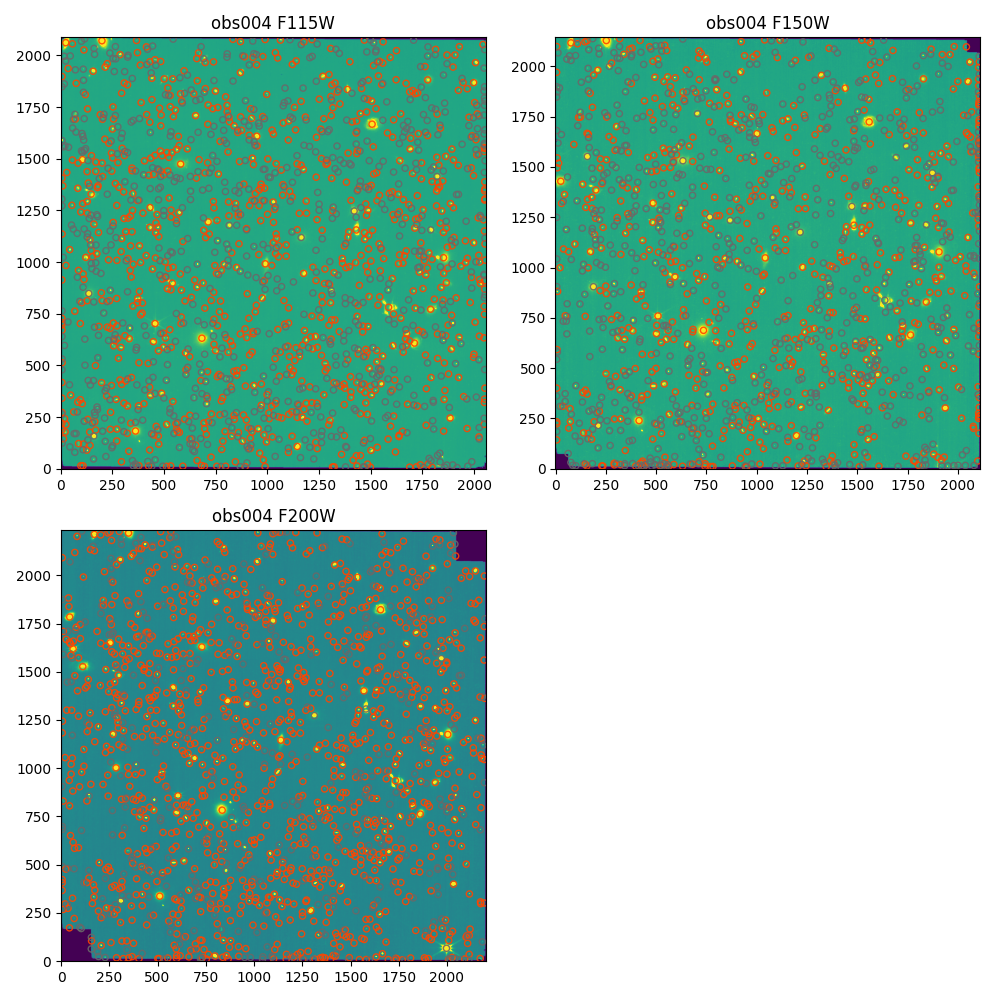

In [19]:
fig = plt.figure(figsize=(10, 10))

cols = 2
rows = int(np.ceil(len(image3_i2d) / cols))

for plt_num, img in enumerate(image3_i2d):

    # determine where the subplot should be
    xpos = (plt_num % 40) % cols
    ypos = ((plt_num % 40) // cols) # // to make it an int.

    # make the subplot
    ax = plt.subplot2grid((rows, cols), (ypos, xpos))

    # plot the image
    with fits.open(img) as hdu:
        ax.imshow(hdu[1].data, vmin=0, vmax=0.3, origin='lower')
        ax.set_title(f"obs{hdu[0].header['OBSERVTN']} {hdu[0].header['PUPIL']}")

    # also plot the associated catalog
    cat = Table.read(img.replace('i2d.fits', 'cat.ecsv'))
    extended_sources = cat[cat['is_extended'] == 1] # 1 is True; i.e. is extended
    point_sources = cat[cat['is_extended'] == 0] # 0 is False; i.e. is a point source
    ax.scatter(extended_sources['xcentroid'], extended_sources['ycentroid'], s=20, facecolors='None', edgecolors='orangered', alpha=0.9)
    ax.scatter(point_sources['xcentroid'], point_sources['ycentroid'], s=20, facecolors='None', edgecolors='dimgrey', alpha=0.9)

# Helps to make the axes not overlap ; you can also set this manually if this doesn't work
plt.tight_layout()

The segmentation maps are also a product of the Image3 pipeline, and they are used the help determine the source catalog. Let's take a look at those to ensure we are happy with what it is defining as a source.

In the segmentation map, each blue blob should correspond to a physical target. There are cases where sources can be blended, in which case the parameters for making the semgentation map and source catalog should be changed. An example of this can be seen below in the observation 004 F200W filter image where two galaxies at ~(1600, 1300) have been blended into one source. This is discussed in more detail below in [Custom Imaging Pipeline Run](#custom). 

*Note that because of the [filter offset difference](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-instrumentation/niriss-gr150-grisms#NIRISSGR150Grisms-Blockingfilters) the field of views for the shown in the cutouts below differs for each filter.*

In [20]:
# we will look at this multiple times, so let's define this as a function
def plot_image_and_segmentation_map(i2d_images, segm_images, xmin=1250, xmax=1750, ymin=1250, ymax=1750, cat_suffix='cat.ecsv'):
        
    cols = 2
    rows = len(i2d_images)

    fig = plt.figure(figsize=(10, 10*(rows/2)))

    for plt_num, img in enumerate(np.sort(np.concatenate([segm_images, i2d_images]))):
    
        # determine where the subplot should be
        xpos = (plt_num % 40) % cols
        ypos = ((plt_num % 40) // cols) # // to make it an int.

        # make the subplot
        ax = plt.subplot2grid((rows, cols), (ypos, xpos))
    
        if 'i2d' in img:
            cat = Table.read(img.replace('i2d.fits', cat_suffix))
            cmap = 'gist_gray'
        else:
            cmap = 'tab20c_r'
            
        # plot the image
        with fits.open(img) as hdu:
            ax.imshow(hdu[1].data, vmin=0, vmax=0.3, origin='lower', cmap=cmap)
            title = f"obs{hdu[0].header['OBSERVTN']} {hdu[0].header['PUPIL']}"
    
        # also plot the associated catalog
        extended_sources = cat[cat['is_extended'] == 1] # 1 is True; i.e. is extended
        point_sources = cat[cat['is_extended'] == 0] # 0 is False; i.e. is a point source
        
        for color, sources in zip(['darkred', 'black'], [extended_sources, point_sources]):
            # plotting the sources
            ax.scatter(sources['xcentroid'], sources['ycentroid'], s=20, facecolors='None', edgecolors=color, alpha=0.9)
    
            # adding source labels 
            for i, source_num in enumerate(sources['label']):
                ax.annotate(source_num, 
                            (sources['xcentroid'][i]+0.5, sources['ycentroid'][i]+0.5), 
                            fontsize=8,
                            color=color)
        if 'i2d' in img:
            ax.set_title(f"{title} combined image")
        else:
            ax.set_title(f"{title} segmentation map")
        
        # zooming in on a smaller region
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
    
    # Helps to make the axes not overlap ; you can also set this manually if this doesn't work
    plt.tight_layout()

    return fig

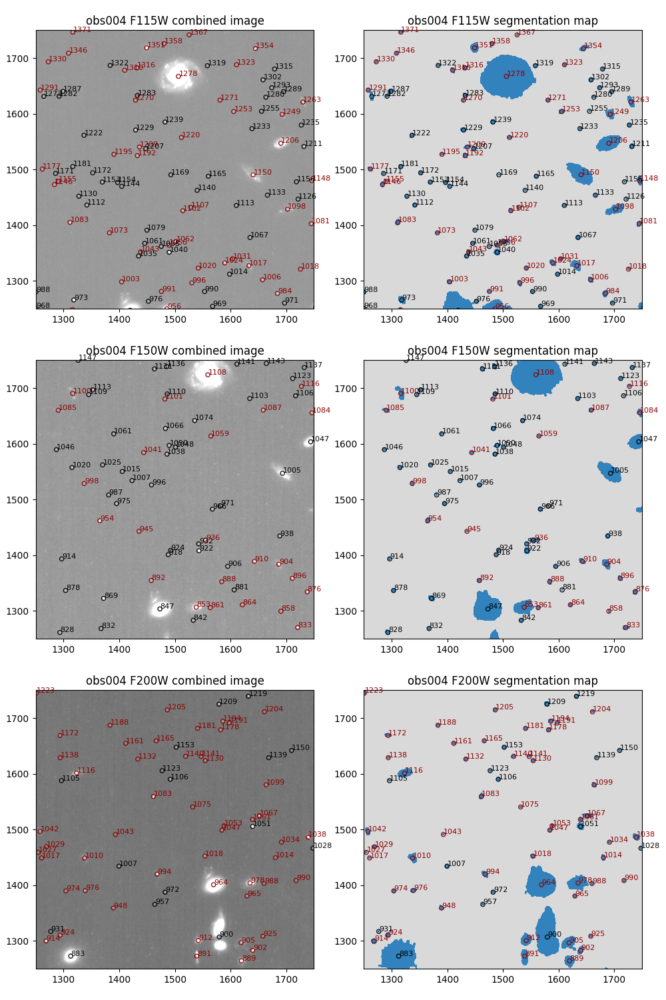

In [21]:
default_fig = plot_image_and_segmentation_map(image3_i2d, image3_segm)

#### ImViz

Similarly to DS9, ImViz allows you to interactively view these images and the corresponding source catalog as well.

In [22]:
imviz = Imviz()
viewer = imviz.default_viewer

# plot each i2d image
catalogs = [] # for plotting the catalogs
labels = [] # for plotting the catalogs
for img in image3_i2d:
    print(f'Plotting: {img}')
    label = f"obs{fits.getval(img, 'OBSERVTN')} {fits.getval(img, 'PUPIL')}"
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        imviz.load_data(img, data_label=label)

    # save info to plot the catalogs next
    catalogs.append(img.replace('i2d.fits', 'cat.ecsv'))
    labels.append(label)

# this aligns the image to use the WCS coordinates; 
#   the images need to be loaded first, but before adding markers
imviz.link_data(link_type='wcs')

# also plot the associated catalog
#   this needs to be a separate loop due to linking in imviz when using sky coordinates
for catname, label in zip(catalogs, labels):
    cat = Table.read(catname)
    
    # format the table into the format imviz expects
    sky_coords = Table({'coord': [SkyCoord(ra=cat['sky_centroid'].ra.degree,
                                           dec=cat['sky_centroid'].dec.degree,
                                           unit="deg")]})

    viewer.marker = {'color': 'orange', 'alpha': 1, 'markersize': 20, 'fill': False}
    viewer.add_markers(sky_coords, use_skycoord=True, marker_name=f"{label} catalog")

# This changes the stretch of all of the images
plotopt = imviz.plugins['Plot Options']
plotopt.select_all(viewers=True, layers=True)
plotopt.stretch_preset = '99.5%'
    
imviz.show()

Plotting: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_i2d.fits
Plotting: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


Plotting: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_i2d.fits


Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.1/imviz/index.html', events=['ca…

<a id='custom'></a>
## Custom Imaging Pipeline Run

<a id='custom_image3'></a>
### Image3

Try editing a few parameters and compare the outcomes to the default run above, at first for a single file.

When we call the image3 pipeline, we can add modifications to a specific step of the pipeline. In this case we're going to edit the `source_catalog` and `tweakreg` steps of the pipeline. An explanation of the different parameters to tweak can be found in the further information below, while the default values are a combination of both the default pipeline values listed in there, and the parameter reference files that are supplied.
- [source_catalog Further Information](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.source_catalog.SourceCatalogStep.html)
- [tweakreg Futher Information](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.tweakreg.tweakreg_step.TweakRegStep.html)

In [23]:
image3_asns = np.sort(glob.glob('*image3*asn*.json'))
test_asn = image3_asns[1]

# check if the calibrated file already exists
asn_data = json.load(open(test_asn))
i2d_file = os.path.join(custom_run_image3, f"{asn_data['products'][0]['name']}_i2d.fits")

if os.path.exists(i2d_file):
    print(i2d_file, 'i2d file already exists.')
else:
    # call the image3 pipeline in the same way as before, but add a few new modifications
    cust_img3 = Image3Pipeline.call(test_asn,
                                    steps={
                                           'source_catalog': {'kernel_fwhm': 5.0,
                                                              'snr_threshold': 10.0,
                                                              'npixels': 50,
                                                              'deblend': True,
                                                              },
                                           'tweakreg': {'snr_threshold': 20,
                                                        'abs_refcat': 'GAIADR3',
                                                        'save_catalogs': True,
                                                        'searchrad': 3.0,
                                                        'kernel_fwhm': 2.302,
                                                        'fitgeometry': 'shift',
                                                        },
                                           },
                                    save_results=True,
                                    output_dir=custom_run_image3)

2024-06-07 14:21:56,208 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0042.asdf


2024-06-07 14:21:56,220 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0010.asdf


2024-06-07 14:21:56,236 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0011.asdf


2024-06-07 14:21:56,251 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-06-07 14:21:56,252 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-06-07 14:21:56,254 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-06-07 14:21:56,255 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-06-07 14:21:56,256 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-06-07 14:21:56,257 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 14:21:56,259 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-06-07 14:21:56,538 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00005_asn.json',).


2024-06-07 14:21:56,551 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: custom_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: True
      us

2024-06-07 14:21:56,684 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_08101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2024-06-07 14:21:56,687 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-06-07 14:21:56,688 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-06-07 14:21:56,689 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:21:56,689 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-06-07 14:21:58,333 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2024-06-07 14:21:59,702 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 41 sources in jw02079004002_08101_00001_nis_cal.fits.


2024-06-07 14:21:59,705 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_08101_00001_nis_cal_cat.ecsv


2024-06-07 14:22:01,077 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 45 sources in jw02079004002_10101_00001_nis_cal.fits.


2024-06-07 14:22:01,080 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_10101_00001_nis_cal_cat.ecsv


2024-06-07 14:22:02,440 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 31 sources in jw02079004002_10101_00002_nis_cal.fits.


2024-06-07 14:22:02,443 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_10101_00002_nis_cal_cat.ecsv


2024-06-07 14:22:03,802 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 38 sources in jw02079004002_10101_00003_nis_cal.fits.


2024-06-07 14:22:03,805 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_10101_00003_nis_cal_cat.ecsv


2024-06-07 14:22:05,164 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 38 sources in jw02079004002_10101_00004_nis_cal.fits.


2024-06-07 14:22:05,167 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_10101_00004_nis_cal_cat.ecsv


2024-06-07 14:22:06,517 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 42 sources in jw02079004002_12101_00001_nis_cal.fits.


2024-06-07 14:22:06,520 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_12101_00001_nis_cal_cat.ecsv


2024-06-07 14:22:07,871 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 34 sources in jw02079004002_12101_00002_nis_cal.fits.


2024-06-07 14:22:07,875 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_12101_00002_nis_cal_cat.ecsv


2024-06-07 14:22:09,227 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 35 sources in jw02079004002_12101_00003_nis_cal.fits.


2024-06-07 14:22:09,231 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_12101_00003_nis_cal_cat.ecsv


2024-06-07 14:22:09,240 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:22:09,240 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2024-06-07 14:22:09,241 - stpipe.Image3Pipeline.tweakreg - INFO - Image groups:


2024-06-07 14:22:09,263 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_08101_00001_nis_cal':


2024-06-07 14:22:09,263 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_08101_00001_nis_cal


2024-06-07 14:22:09,285 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_10101_00001_nis_cal':


2024-06-07 14:22:09,286 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_10101_00001_nis_cal


2024-06-07 14:22:09,309 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_10101_00002_nis_cal':


2024-06-07 14:22:09,309 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_10101_00002_nis_cal


2024-06-07 14:22:09,332 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_10101_00003_nis_cal':


2024-06-07 14:22:09,332 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_10101_00003_nis_cal


2024-06-07 14:22:09,354 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_10101_00004_nis_cal':


2024-06-07 14:22:09,355 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_10101_00004_nis_cal


2024-06-07 14:22:09,375 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_12101_00001_nis_cal':


2024-06-07 14:22:09,375 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_12101_00001_nis_cal


2024-06-07 14:22:09,397 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_12101_00002_nis_cal':


2024-06-07 14:22:09,397 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_12101_00002_nis_cal


2024-06-07 14:22:09,419 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_12101_00003_nis_cal':


2024-06-07 14:22:09,419 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_12101_00003_nis_cal


2024-06-07 14:22:09,420 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:22:09,420 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:22:09,421 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-06-07 14:22:09.420669


2024-06-07 14:22:09,421 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.7


2024-06-07 14:22:09,421 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:22:12,670 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004002_12101_00001_nis_cal' as reference image


2024-06-07 14:22:12,675 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_12101_00002_nis_cal' to the reference catalog.


2024-06-07 14:22:12,761 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_12101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00001_nis_cal' catalog.


2024-06-07 14:22:12,762 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:22:12,763 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01595, 0.01595 (arcsec) with significance of 14 and 14 matches.


2024-06-07 14:22:12,765 - stpipe.Image3Pipeline.tweakreg - INFO - Found 14 matches for 'GROUP ID: jw02079004002_12101_00002_nis_cal'...


2024-06-07 14:22:12,765 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 14) found for image catalog 'GROUP ID: jw02079004002_12101_00002_nis_cal'.


2024-06-07 14:22:12,776 - stpipe.Image3Pipeline.tweakreg - INFO - Added 20 unmatched sources from 'GROUP ID: jw02079004002_12101_00002_nis_cal' to the reference catalog.


2024-06-07 14:22:13,432 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_12101_00003_nis_cal' to the reference catalog.


2024-06-07 14:22:13,521 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_12101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00002_nis_cal' catalog.


2024-06-07 14:22:13,522 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:22:13,523 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01595, 0.01595 (arcsec) with significance of 20 and 20 matches.


2024-06-07 14:22:13,525 - stpipe.Image3Pipeline.tweakreg - INFO - Found 20 matches for 'GROUP ID: jw02079004002_12101_00003_nis_cal'...


2024-06-07 14:22:13,525 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:22:13,527 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_12101_00003_nis_cal:


2024-06-07 14:22:13,527 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000334905  YSH: -0.00379507


2024-06-07 14:22:13,528 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:22:13,529 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00385256   FIT MAE: 0.00313752


2024-06-07 14:22:13,529 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 20 objects.


2024-06-07 14:22:13,577 - stpipe.Image3Pipeline.tweakreg - INFO - Added 15 unmatched sources from 'GROUP ID: jw02079004002_12101_00003_nis_cal' to the reference catalog.


2024-06-07 14:22:14,200 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_08101_00001_nis_cal' to the reference catalog.


2024-06-07 14:22:14,282 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_08101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00003_nis_cal' catalog.


2024-06-07 14:22:14,282 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:22:14,284 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01595, 0.01595 (arcsec) with significance of 31 and 31 matches.


2024-06-07 14:22:14,285 - stpipe.Image3Pipeline.tweakreg - INFO - Found 31 matches for 'GROUP ID: jw02079004002_08101_00001_nis_cal'...


2024-06-07 14:22:14,286 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:22:14,288 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_08101_00001_nis_cal:


2024-06-07 14:22:14,289 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000129273  YSH: -0.00322686


2024-06-07 14:22:14,289 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:22:14,289 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00596284   FIT MAE: 0.00498096


2024-06-07 14:22:14,290 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 31 objects.


2024-06-07 14:22:14,335 - stpipe.Image3Pipeline.tweakreg - INFO - Added 10 unmatched sources from 'GROUP ID: jw02079004002_08101_00001_nis_cal' to the reference catalog.


2024-06-07 14:22:14,859 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_00001_nis_cal' to the reference catalog.


2024-06-07 14:22:14,925 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_08101_00001_nis_cal' catalog.


2024-06-07 14:22:14,925 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:22:14,927 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01595, 0.01595 (arcsec) with significance of 32 and 32 matches.


2024-06-07 14:22:14,928 - stpipe.Image3Pipeline.tweakreg - INFO - Found 33 matches for 'GROUP ID: jw02079004002_10101_00001_nis_cal'...


2024-06-07 14:22:14,929 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:22:14,932 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_00001_nis_cal:


2024-06-07 14:22:14,932 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0071858  YSH: 0.00677966


2024-06-07 14:22:14,933 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:22:14,933 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0495829   FIT MAE: 0.0182775


2024-06-07 14:22:14,933 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 32 objects.


2024-06-07 14:22:14,977 - stpipe.Image3Pipeline.tweakreg - INFO - Added 12 unmatched sources from 'GROUP ID: jw02079004002_10101_00001_nis_cal' to the reference catalog.


2024-06-07 14:22:15,307 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_00004_nis_cal' to the reference catalog.


2024-06-07 14:22:15,381 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00004_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00001_nis_cal' catalog.


2024-06-07 14:22:15,382 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:22:15,384 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01595, 0.01595 (arcsec) with significance of 30 and 30 matches.


2024-06-07 14:22:15,385 - stpipe.Image3Pipeline.tweakreg - INFO - Found 30 matches for 'GROUP ID: jw02079004002_10101_00004_nis_cal'...


2024-06-07 14:22:15,385 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:22:15,387 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_00004_nis_cal:


2024-06-07 14:22:15,388 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000449125  YSH: -0.00312593


2024-06-07 14:22:15,388 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:22:15,388 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00568081   FIT MAE: 0.00494098


2024-06-07 14:22:15,389 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 30 objects.


2024-06-07 14:22:15,433 - stpipe.Image3Pipeline.tweakreg - INFO - Added 8 unmatched sources from 'GROUP ID: jw02079004002_10101_00004_nis_cal' to the reference catalog.


2024-06-07 14:22:15,678 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_00003_nis_cal' to the reference catalog.


2024-06-07 14:22:15,743 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00004_nis_cal' catalog.


2024-06-07 14:22:15,744 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:22:15,745 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01595, 0.01595 (arcsec) with significance of 32.55 and 34 matches.


2024-06-07 14:22:15,746 - stpipe.Image3Pipeline.tweakreg - INFO - Found 33 matches for 'GROUP ID: jw02079004002_10101_00003_nis_cal'...


2024-06-07 14:22:15,747 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:22:15,749 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_00003_nis_cal:


2024-06-07 14:22:15,749 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00358219  YSH: -0.00312355


2024-06-07 14:22:15,750 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:22:15,750 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00569716   FIT MAE: 0.00516098


2024-06-07 14:22:15,752 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 33 objects.


2024-06-07 14:22:15,795 - stpipe.Image3Pipeline.tweakreg - INFO - Added 5 unmatched sources from 'GROUP ID: jw02079004002_10101_00003_nis_cal' to the reference catalog.


2024-06-07 14:22:15,913 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_00002_nis_cal' to the reference catalog.


2024-06-07 14:22:15,978 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00003_nis_cal' catalog.


2024-06-07 14:22:15,979 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:22:15,980 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01595, 0.01595 (arcsec) with significance of 24.02 and 25 matches.


2024-06-07 14:22:15,982 - stpipe.Image3Pipeline.tweakreg - INFO - Found 26 matches for 'GROUP ID: jw02079004002_10101_00002_nis_cal'...


2024-06-07 14:22:15,983 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:22:15,984 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_00002_nis_cal:


2024-06-07 14:22:15,985 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 8.75956e-05  YSH: -0.00263513


2024-06-07 14:22:15,985 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:22:15,985 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00532244   FIT MAE: 0.00432698


2024-06-07 14:22:15,986 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 25 objects.


2024-06-07 14:22:16,032 - stpipe.Image3Pipeline.tweakreg - INFO - Added 5 unmatched sources from 'GROUP ID: jw02079004002_10101_00002_nis_cal' to the reference catalog.


2024-06-07 14:22:16,032 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:22:16,033 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-06-07 14:22:16.032603


2024-06-07 14:22:16,033 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:06.611934


2024-06-07 14:22:16,033 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:22:16,364 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the GAIADR3 reference catalog!


2024-06-07 14:22:16,417 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.146838546 -27.807352819 53.186714450 -27.794897616 53.172542361 -27.759941837 53.132702194 -27.772375494


2024-06-07 14:22:16,514 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147119482 -27.807095012 53.186995194 -27.794639561 53.172822860 -27.759683870 53.132982886 -27.772117775


2024-06-07 14:22:16,611 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147259884 -27.807275272 53.187135701 -27.794819919 53.172963454 -27.759864193 53.133123375 -27.772298000


2024-06-07 14:22:16,706 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.147100576 -27.807238163 53.186976373 -27.794782795 53.172804113 -27.759827074 53.132964054 -27.772260897


2024-06-07 14:22:16,802 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148454272 -27.808033129 53.188330207 -27.795577375 53.174157412 -27.760621792 53.134317215 -27.773055999


2024-06-07 14:22:16,899 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148717642 -27.807918620 53.188593515 -27.795462816 53.174420680 -27.760507250 53.134580544 -27.772941507


2024-06-07 14:22:16,947 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-06-07 14:22:17,276 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2024-06-07 14:22:17,481 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:22:17,482 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-06-07 14:22:17.481859


2024-06-07 14:22:17,482 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:22:17,483 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-06-07 14:22:17,483 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-06-07 14:22:17,484 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-06-07 14:22:17,484 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:22:17,485 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-06-07 14:22:46,872 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_08101_00001_nis_cal.fits. Sky background: 0.00701422


2024-06-07 14:22:46,873 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00001_nis_cal.fits. Sky background: 0


2024-06-07 14:22:46,873 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00002_nis_cal.fits. Sky background: 0.00715553


2024-06-07 14:22:46,874 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00003_nis_cal.fits. Sky background: 0.00901019


2024-06-07 14:22:46,874 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00004_nis_cal.fits. Sky background: 0.0122302


2024-06-07 14:22:46,875 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00001_nis_cal.fits. Sky background: 0.0119913


2024-06-07 14:22:46,875 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00002_nis_cal.fits. Sky background: 0.00981051


2024-06-07 14:22:46,876 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00003_nis_cal.fits. Sky background: 0.00917529


2024-06-07 14:22:46,876 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:22:46,877 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-06-07 14:22:46.876760


2024-06-07 14:22:46,877 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:29.394901


2024-06-07 14:22:46,878 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:22:46,890 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-06-07 14:22:47,236 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2024-06-07 14:22:47,243 - stpipe.Image3Pipeline.outlier_detection - INFO - Performing outlier detection on 8 inputs


2024-06-07 14:22:47,243 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-06-07 14:22:47,244 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:22:47,244 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-06-07 14:22:47,244 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-06-07 14:22:47,245 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:22:47,340 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.0655645107767906 arcsec.


2024-06-07 14:22:47,437 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:22:49,686 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:22:50,662 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:22:51,728 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:22:51,729 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_08101_00001_nis_outlier_i2d.fits


2024-06-07 14:22:51,734 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:22:53,826 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:22:54,806 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:22:55,873 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:22:55,874 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_10101_00001_nis_outlier_i2d.fits


2024-06-07 14:22:55,879 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:22:58,086 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:22:59,060 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:23:00,128 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:23:00,128 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_10101_00002_nis_outlier_i2d.fits


2024-06-07 14:23:00,134 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:23:02,332 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:23:03,307 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:23:04,379 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:23:04,379 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_10101_00003_nis_outlier_i2d.fits


2024-06-07 14:23:04,385 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:23:06,621 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:23:07,594 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:23:08,663 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:23:08,664 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_10101_00004_nis_outlier_i2d.fits


2024-06-07 14:23:08,670 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:23:10,364 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:23:11,349 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:23:12,416 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:23:12,417 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_12101_00001_nis_outlier_i2d.fits


2024-06-07 14:23:12,423 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:23:14,118 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:23:15,091 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:23:16,162 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:23:16,163 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_12101_00002_nis_outlier_i2d.fits


2024-06-07 14:23:16,168 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:23:18,374 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:23:19,356 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:23:20,422 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:23:20,423 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_12101_00003_nis_outlier_i2d.fits


2024-06-07 14:23:20,536 - stpipe.Image3Pipeline.outlier_detection - INFO - Computing median


2024-06-07 14:23:37,315 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_08101_00001_nis_o004_median.fits


2024-06-07 14:23:37,318 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting median


2024-06-07 14:23:39,532 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:23:39,913 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_08101_00001_nis_o004_blot.fits


2024-06-07 14:23:42,160 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:23:42,556 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00001_nis_o004_blot.fits


2024-06-07 14:23:44,758 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:23:45,461 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00002_nis_o004_blot.fits


2024-06-07 14:23:47,685 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:23:48,065 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00003_nis_o004_blot.fits


2024-06-07 14:23:50,326 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:23:50,707 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00004_nis_o004_blot.fits


2024-06-07 14:23:52,393 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:23:52,758 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00001_nis_o004_blot.fits


2024-06-07 14:23:54,470 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:23:54,826 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00002_nis_o004_blot.fits


2024-06-07 14:23:57,032 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-06-07 14:23:57,414 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00003_nis_o004_blot.fits


2024-06-07 14:23:57,415 - stpipe.Image3Pipeline.outlier_detection - INFO - Flagging outliers


2024-06-07 14:23:57,739 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6125 (0.15%)


2024-06-07 14:23:58,049 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6391 (0.15%)


2024-06-07 14:23:58,361 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6467 (0.15%)


2024-06-07 14:23:58,671 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6137 (0.15%)


2024-06-07 14:23:58,984 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6427 (0.15%)


2024-06-07 14:23:59,271 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6370 (0.15%)


2024-06-07 14:23:59,554 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6196 (0.15%)


2024-06-07 14:23:59,865 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 6291 (0.15%)


2024-06-07 14:24:00,428 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_08101_00001_nis_o004_crf.fits


2024-06-07 14:24:00,713 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00001_nis_o004_crf.fits


2024-06-07 14:24:00,996 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00002_nis_o004_crf.fits


2024-06-07 14:24:01,282 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00003_nis_o004_crf.fits


2024-06-07 14:24:01,565 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00004_nis_o004_crf.fits


2024-06-07 14:24:02,141 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00001_nis_o004_crf.fits


2024-06-07 14:24:02,400 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00002_nis_o004_crf.fits


2024-06-07 14:24:02,684 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00003_nis_o004_crf.fits


2024-06-07 14:24:02,684 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-06-07 14:24:02,978 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2024-06-07 14:24:02,994 - stpipe.Image3Pipeline.resample - INFO - Using drizpars reference file: crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits


2024-06-07 14:24:03,007 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-06-07 14:24:03,007 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:24:03,007 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: INDEF


2024-06-07 14:24:03,008 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-06-07 14:24:03,008 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:24:03,105 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.0655645107767906 arcsec.


2024-06-07 14:24:03,161 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for jw02079-o004_t001_niriss_clear-f150w


2024-06-07 14:24:03,734 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-06-07 14:24:05,926 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:08,951 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:12,004 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:15,055 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:18,130 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:20,662 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:23,176 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:26,212 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:27,056 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2024-06-07 14:24:29,288 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:32,400 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:35,487 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:38,561 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:41,644 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:44,188 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:46,724 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:49,814 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:50,665 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2024-06-07 14:24:52,852 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:55,916 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:24:58,951 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:01,977 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:05,033 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:07,554 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:10,057 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:13,092 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:13,942 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2024-06-07 14:25:16,135 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:19,190 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:22,220 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:25,269 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:28,301 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:30,828 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:33,341 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:36,376 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-06-07 14:25:37,263 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.147101307 -27.808518278 53.188746770 -27.795515623 53.174272167 -27.759245678 53.132638864 -27.772243997


2024-06-07 14:25:37,796 - stpipe.Image3Pipeline.resample - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-06-07 14:25:37,797 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-06-07 14:25:38,097 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2145, 2112) from jw02079-o004_t001_niriss_clear-f150w_i2d.fits>,).


2024-06-07 14:25:38,113 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-06-07 14:25:38,122 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-06-07 14:25:38,122 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-06-07 14:25:38,123 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-06-07 14:25:38,123 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-06-07 14:25:38,125 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F150W


2024-06-07 14:25:38,125 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-06-07 14:25:38,164 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.19753


2024-06-07 14:25:44,534 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 230 sources


2024-06-07 14:25:44,886 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_cat.ecsv


2024-06-07 14:25:45,024 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 14:25:45,025 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 14:25:45,026 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-06-07 14:25:45,030 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


In [24]:
# remove unnecessary files to save disk space
for crf in glob.glob(os.path.join(custom_run_image3, '*crf.fits')):
    os.remove(crf)

<a id='view_custom'></a>
### Inspecting Custom Results

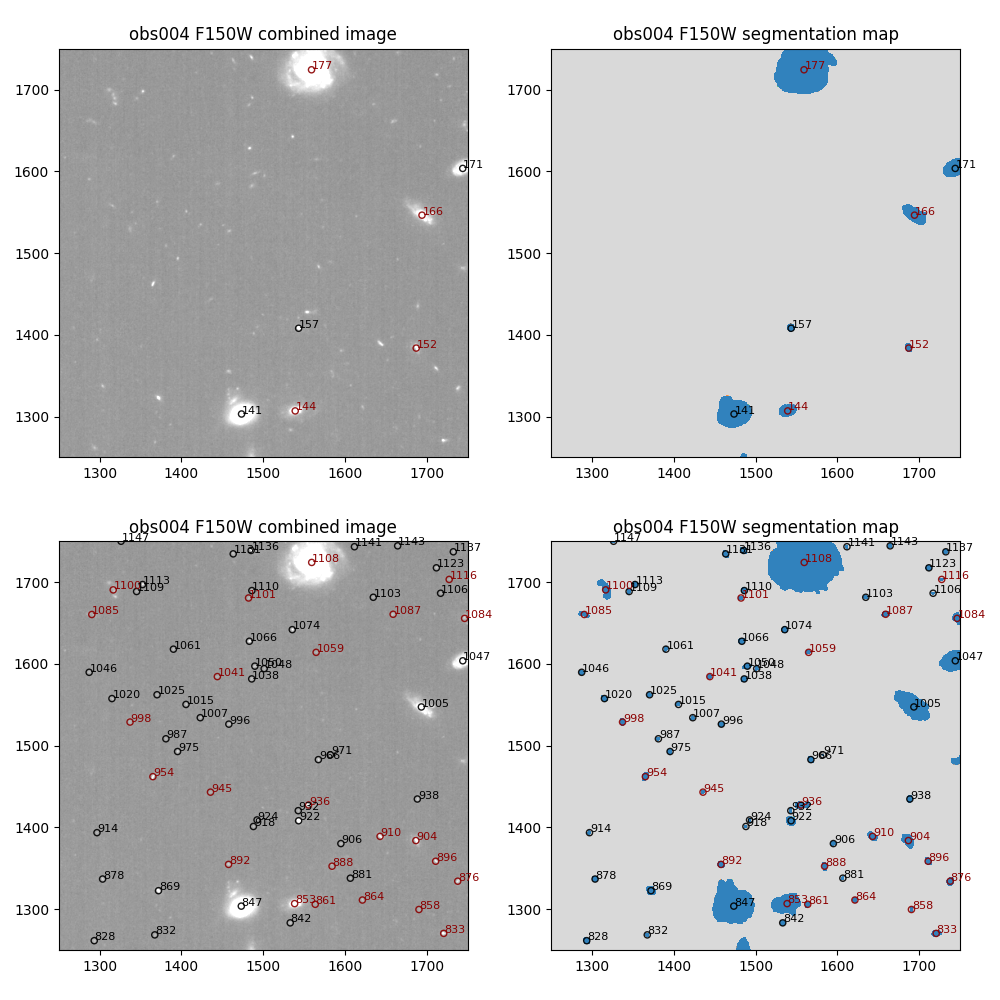

In [25]:
default_i2d = os.path.join(default_run_image3, os.path.basename(i2d_file))
compare_i2ds = [i2d_file, default_i2d]
compare_segm = [i2d_file.replace('i2d.fits', 'segm.fits'), default_i2d.replace('i2d.fits', 'segm.fits')]

compare_fig = plot_image_and_segmentation_map(compare_i2ds, compare_segm)

The cell below shows similar information using Imviz instead to visualize this.

In [26]:
imviz = Imviz()
viewer = imviz.default_viewer

for img, label in zip([i2d_file, os.path.join(default_run_image3, os.path.basename(i2d_file))], ['custom', 'default']):
    print(f'Plotting: {img}')
    title = f"{label} obs{fits.getval(img, 'OBSERVTN')} {fits.getval(img, 'PUPIL')}"
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        imviz.load_data(img, data_label=title)

    # this aligns the image to use the WCS coordinates
    linking = imviz.plugins['Links Control']
    linking.link_type = 'WCS'

    # also plot the associated catalog
    cat = Table.read(img.replace('i2d.fits', 'cat.ecsv'))
    # format the table into the format imviz expects
    t_xy = Table({'x': cat['xcentroid'],
                  'y': cat['ycentroid']})
    viewer.marker = {'color': 'orange', 'alpha': 1, 'markersize': 20, 'fill': False}
    viewer.add_markers(t_xy, marker_name=f"{label} catalog")

# This changes the stretch of all of the images
plotopt = imviz.plugins['Plot Options']
plotopt.select_all(viewers=True, layers=True)
plotopt.stretch_preset = '99.5%'
    
imviz.show()

Plotting: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


Plotting: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.1/imviz/index.html', events=['ca…

Calibrate the remaining images if you are happy with the above results

In [27]:
image3_asns = np.sort(glob.glob('*image3*asn*.json'))

for img3_asn in image3_asns:
    # check if the calibrated file already exists
    asn_data = json.load(open(img3_asn))
    i2d_file = os.path.join(custom_run_image3, f"{asn_data['products'][0]['name']}_i2d.fits")
    if os.path.exists(i2d_file):
        print(i2d_file, 'cal file already exists.')
        continue
    # call the image3 pipeline in the same way as before, but add a few new modifications
    cust_img3 = Image3Pipeline.call(img3_asn,
                                    steps={
                                           'source_catalog': {'kernel_fwhm': 5.0,
                                                              'snr_threshold': 10.0,
                                                              'npixels': 50,
                                                              'deblend': True,
                                                              },
                                           'tweakreg': {'snr_threshold': 20,
                                                        'abs_refcat': 'GAIADR3',
                                                        'save_catalogs': True,
                                                        'searchrad': 3.0,
                                                        'kernel_fwhm': 2.302,
                                                        'fitgeometry': 'shift',
                                                        },
                                           },
                                    save_results=True,
                                    output_dir=custom_run_image3)

2024-06-07 14:25:49,357 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0038.asdf


2024-06-07 14:25:49,368 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0002.asdf


2024-06-07 14:25:49,383 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0002.asdf


2024-06-07 14:25:49,399 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-06-07 14:25:49,400 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-06-07 14:25:49,402 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-06-07 14:25:49,403 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-06-07 14:25:49,404 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-06-07 14:25:49,406 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 14:25:49,407 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-06-07 14:25:49,765 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00002_asn.json',).


2024-06-07 14:25:49,777 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: custom_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: True
      us

2024-06-07 14:25:49,911 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_02101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2024-06-07 14:25:49,914 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-06-07 14:25:49,914 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-06-07 14:25:49,915 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:25:49,916 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-06-07 14:25:51,434 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2024-06-07 14:25:52,792 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 66 sources in jw02079004003_02101_00001_nis_cal.fits.


2024-06-07 14:25:52,796 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_02101_00001_nis_cal_cat.ecsv


2024-06-07 14:25:54,160 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 57 sources in jw02079004003_04101_00001_nis_cal.fits.


2024-06-07 14:25:54,163 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_04101_00001_nis_cal_cat.ecsv


2024-06-07 14:25:55,527 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 68 sources in jw02079004003_04101_00002_nis_cal.fits.


2024-06-07 14:25:55,530 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_04101_00002_nis_cal_cat.ecsv


2024-06-07 14:25:56,882 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 55 sources in jw02079004003_04101_00003_nis_cal.fits.


2024-06-07 14:25:56,886 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_04101_00003_nis_cal_cat.ecsv


2024-06-07 14:25:58,254 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 52 sources in jw02079004003_04101_00004_nis_cal.fits.


2024-06-07 14:25:58,257 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_04101_00004_nis_cal_cat.ecsv


2024-06-07 14:25:59,610 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 52 sources in jw02079004003_06101_00001_nis_cal.fits.


2024-06-07 14:25:59,613 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_06101_00001_nis_cal_cat.ecsv


2024-06-07 14:26:00,961 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 60 sources in jw02079004003_06101_00002_nis_cal.fits.


2024-06-07 14:26:00,964 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_06101_00002_nis_cal_cat.ecsv


2024-06-07 14:26:02,316 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 52 sources in jw02079004003_06101_00003_nis_cal.fits.


2024-06-07 14:26:02,320 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_06101_00003_nis_cal_cat.ecsv


2024-06-07 14:26:02,329 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:02,329 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2024-06-07 14:26:02,330 - stpipe.Image3Pipeline.tweakreg - INFO - Image groups:


2024-06-07 14:26:02,352 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_02101_00001_nis_cal':


2024-06-07 14:26:02,353 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_02101_00001_nis_cal


2024-06-07 14:26:02,375 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_04101_00001_nis_cal':


2024-06-07 14:26:02,375 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_04101_00001_nis_cal


2024-06-07 14:26:02,399 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_04101_00002_nis_cal':


2024-06-07 14:26:02,400 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_04101_00002_nis_cal


2024-06-07 14:26:02,423 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_04101_00003_nis_cal':


2024-06-07 14:26:02,423 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_04101_00003_nis_cal


2024-06-07 14:26:02,446 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_04101_00004_nis_cal':


2024-06-07 14:26:02,447 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_04101_00004_nis_cal


2024-06-07 14:26:02,469 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_06101_00001_nis_cal':


2024-06-07 14:26:02,469 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_06101_00001_nis_cal


2024-06-07 14:26:02,492 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_06101_00002_nis_cal':


2024-06-07 14:26:02,492 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_06101_00002_nis_cal


2024-06-07 14:26:02,523 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004003_06101_00003_nis_cal':


2024-06-07 14:26:02,524 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004003_06101_00003_nis_cal


2024-06-07 14:26:02,524 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:02,525 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:26:02,525 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-06-07 14:26:02.525137


2024-06-07 14:26:02,526 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.7


2024-06-07 14:26:02,526 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:26:07,357 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004003_04101_00003_nis_cal' as reference image


2024-06-07 14:26:07,363 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_00002_nis_cal' to the reference catalog.


2024-06-07 14:26:07,431 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00003_nis_cal' catalog.


2024-06-07 14:26:07,431 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:26:07,433 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01585, 0.01796 (arcsec) with significance of 30 and 31 matches.


2024-06-07 14:26:07,434 - stpipe.Image3Pipeline.tweakreg - INFO - Found 31 matches for 'GROUP ID: jw02079004003_04101_00002_nis_cal'...


2024-06-07 14:26:07,435 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:26:07,437 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_00002_nis_cal:


2024-06-07 14:26:07,437 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000980678  YSH: -0.00227641


2024-06-07 14:26:07,438 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:07,438 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00770893   FIT MAE: 0.00630105


2024-06-07 14:26:07,439 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 29 objects.


2024-06-07 14:26:07,483 - stpipe.Image3Pipeline.tweakreg - INFO - Added 37 unmatched sources from 'GROUP ID: jw02079004003_04101_00002_nis_cal' to the reference catalog.


2024-06-07 14:26:08,722 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_02101_00001_nis_cal' to the reference catalog.


2024-06-07 14:26:08,798 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00002_nis_cal' catalog.


2024-06-07 14:26:08,799 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:26:08,800 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01585, 0.01876 (arcsec) with significance of 42.66 and 45 matches.


2024-06-07 14:26:08,802 - stpipe.Image3Pipeline.tweakreg - INFO - Found 41 matches for 'GROUP ID: jw02079004003_02101_00001_nis_cal'...


2024-06-07 14:26:08,802 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:26:08,805 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_02101_00001_nis_cal:


2024-06-07 14:26:08,805 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00200859  YSH: 0.00588222


2024-06-07 14:26:08,806 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:08,806 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0473253   FIT MAE: 0.0165242


2024-06-07 14:26:08,807 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 39 objects.


2024-06-07 14:26:08,858 - stpipe.Image3Pipeline.tweakreg - INFO - Added 25 unmatched sources from 'GROUP ID: jw02079004003_02101_00001_nis_cal' to the reference catalog.


2024-06-07 14:26:09,810 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_00003_nis_cal' to the reference catalog.


2024-06-07 14:26:09,893 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004003_02101_00001_nis_cal' catalog.


2024-06-07 14:26:09,893 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:26:09,895 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01585, 0.01585 (arcsec) with significance of 32 and 32 matches.


2024-06-07 14:26:09,896 - stpipe.Image3Pipeline.tweakreg - INFO - Found 31 matches for 'GROUP ID: jw02079004003_06101_00003_nis_cal'...


2024-06-07 14:26:09,897 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:26:09,899 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_06101_00003_nis_cal:


2024-06-07 14:26:09,900 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00263879  YSH: -0.00124847


2024-06-07 14:26:09,900 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:09,901 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00693188   FIT MAE: 0.0059585


2024-06-07 14:26:09,901 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 30 objects.


2024-06-07 14:26:09,949 - stpipe.Image3Pipeline.tweakreg - INFO - Added 21 unmatched sources from 'GROUP ID: jw02079004003_06101_00003_nis_cal' to the reference catalog.


2024-06-07 14:26:10,770 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_00001_nis_cal' to the reference catalog.


2024-06-07 14:26:10,839 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00003_nis_cal' catalog.


2024-06-07 14:26:10,839 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:26:10,841 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01585, 0.01585 (arcsec) with significance of 36.92 and 40 matches.


2024-06-07 14:26:10,842 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: jw02079004003_06101_00001_nis_cal'...


2024-06-07 14:26:10,843 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:26:10,845 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_06101_00001_nis_cal:


2024-06-07 14:26:10,845 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -2.36014e-05  YSH: 0.00336189


2024-06-07 14:26:10,846 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:10,846 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0479969   FIT MAE: 0.0170249


2024-06-07 14:26:10,847 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 38 objects.


2024-06-07 14:26:10,890 - stpipe.Image3Pipeline.tweakreg - INFO - Added 12 unmatched sources from 'GROUP ID: jw02079004003_06101_00001_nis_cal' to the reference catalog.


2024-06-07 14:26:11,575 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_00002_nis_cal' to the reference catalog.


2024-06-07 14:26:11,658 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00001_nis_cal' catalog.


2024-06-07 14:26:11,659 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:26:11,660 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01585, 0.01585 (arcsec) with significance of 42.09 and 45 matches.


2024-06-07 14:26:11,662 - stpipe.Image3Pipeline.tweakreg - INFO - Found 46 matches for 'GROUP ID: jw02079004003_06101_00002_nis_cal'...


2024-06-07 14:26:11,662 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:26:11,665 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_06101_00002_nis_cal:


2024-06-07 14:26:11,665 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000482047  YSH: 0.00295462


2024-06-07 14:26:11,666 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:11,666 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.105352   FIT MAE: 0.0327001


2024-06-07 14:26:11,666 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 44 objects.


2024-06-07 14:26:11,714 - stpipe.Image3Pipeline.tweakreg - INFO - Added 14 unmatched sources from 'GROUP ID: jw02079004003_06101_00002_nis_cal' to the reference catalog.


2024-06-07 14:26:12,139 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_00004_nis_cal' to the reference catalog.


2024-06-07 14:26:12,209 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00002_nis_cal' catalog.


2024-06-07 14:26:12,209 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:26:12,211 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01585, 0.01585 (arcsec) with significance of 41.16 and 44 matches.


2024-06-07 14:26:12,212 - stpipe.Image3Pipeline.tweakreg - INFO - Found 43 matches for 'GROUP ID: jw02079004003_04101_00004_nis_cal'...


2024-06-07 14:26:12,213 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:26:12,216 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_00004_nis_cal:


2024-06-07 14:26:12,216 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00280334  YSH: 0.00342516


2024-06-07 14:26:12,217 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:12,217 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0455036   FIT MAE: 0.0155877


2024-06-07 14:26:12,217 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 42 objects.


2024-06-07 14:26:12,271 - stpipe.Image3Pipeline.tweakreg - INFO - Added 9 unmatched sources from 'GROUP ID: jw02079004003_04101_00004_nis_cal' to the reference catalog.


2024-06-07 14:26:12,558 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_00001_nis_cal' to the reference catalog.


2024-06-07 14:26:12,638 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00004_nis_cal' catalog.


2024-06-07 14:26:12,639 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:26:12,640 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01585, 0.01842 (arcsec) with significance of 45.14 and 51 matches.


2024-06-07 14:26:12,642 - stpipe.Image3Pipeline.tweakreg - INFO - Found 46 matches for 'GROUP ID: jw02079004003_04101_00001_nis_cal'...


2024-06-07 14:26:12,642 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:26:12,646 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_00001_nis_cal:


2024-06-07 14:26:12,646 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0021335  YSH: 0.00539296


2024-06-07 14:26:12,646 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:26:12,647 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0458621   FIT MAE: 0.0155974


2024-06-07 14:26:12,647 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 44 objects.


2024-06-07 14:26:12,694 - stpipe.Image3Pipeline.tweakreg - INFO - Added 11 unmatched sources from 'GROUP ID: jw02079004003_04101_00001_nis_cal' to the reference catalog.


2024-06-07 14:26:12,695 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:26:12,695 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-06-07 14:26:12.695308


2024-06-07 14:26:12,696 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:10.170171


2024-06-07 14:26:12,696 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:26:13,037 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the GAIADR3 reference catalog!


2024-06-07 14:26:13,090 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.145044958 -27.807868774 53.184919906 -27.795413450 53.170749170 -27.760458823 53.130909624 -27.772892057


2024-06-07 14:26:13,188 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.145328092 -27.807613621 53.185202876 -27.795158121 53.171031976 -27.760203556 53.131192594 -27.772636965


2024-06-07 14:26:13,285 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.145467110 -27.807793503 53.185341963 -27.795338011 53.171171050 -27.760383443 53.131331598 -27.772816844


2024-06-07 14:26:13,382 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.149039603 -27.809540776 53.188914667 -27.797084207 53.174742320 -27.762130022 53.134902657 -27.774564499


2024-06-07 14:26:13,480 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.149324189 -27.809285664 53.189199139 -27.796829044 53.175026767 -27.761874877 53.135187219 -27.774309405


2024-06-07 14:26:13,577 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.149462380 -27.809463578 53.189337392 -27.797006948 53.175164986 -27.762052784 53.135325376 -27.774487322


2024-06-07 14:26:13,674 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.149305105 -27.809427295 53.189180127 -27.796970724 53.175007792 -27.762016540 53.135168172 -27.774451019


2024-06-07 14:26:13,724 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-06-07 14:26:14,143 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2024-06-07 14:26:14,350 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:26:14,350 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-06-07 14:26:14.350101


2024-06-07 14:26:14,351 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:26:14,351 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-06-07 14:26:14,352 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-06-07 14:26:14,352 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-06-07 14:26:14,353 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:26:14,353 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-06-07 14:26:42,812 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_02101_00001_nis_cal.fits. Sky background: 0.00406897


2024-06-07 14:26:42,812 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00001_nis_cal.fits. Sky background: 0.00696727


2024-06-07 14:26:42,813 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00002_nis_cal.fits. Sky background: 0.00251591


2024-06-07 14:26:42,813 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00003_nis_cal.fits. Sky background: 0.0108175


2024-06-07 14:26:42,814 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00004_nis_cal.fits. Sky background: 0.00906636


2024-06-07 14:26:42,815 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00001_nis_cal.fits. Sky background: 0.00897486


2024-06-07 14:26:42,815 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00002_nis_cal.fits. Sky background: 0


2024-06-07 14:26:42,816 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00003_nis_cal.fits. Sky background: 0.00684481


2024-06-07 14:26:42,817 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:26:42,817 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-06-07 14:26:42.817095


2024-06-07 14:26:42,818 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:28.466994


2024-06-07 14:26:42,818 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:26:42,829 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-06-07 14:26:43,203 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2024-06-07 14:26:43,209 - stpipe.Image3Pipeline.outlier_detection - INFO - Performing outlier detection on 8 inputs


2024-06-07 14:26:43,210 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-06-07 14:26:43,210 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:26:43,211 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-06-07 14:26:43,211 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-06-07 14:26:43,212 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:26:43,309 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556229637164333 arcsec.


2024-06-07 14:26:43,405 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:26:45,623 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:26:46,612 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:26:47,681 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:26:47,681 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_02101_00001_nis_outlier_i2d.fits


2024-06-07 14:26:47,687 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:26:49,899 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:26:50,888 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:26:51,956 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:26:51,957 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_04101_00001_nis_outlier_i2d.fits


2024-06-07 14:26:51,963 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:26:54,205 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:26:55,216 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:26:56,284 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:26:56,284 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_04101_00002_nis_outlier_i2d.fits


2024-06-07 14:26:56,290 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:26:57,972 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:26:58,962 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:27:00,030 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:27:00,031 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_04101_00003_nis_outlier_i2d.fits


2024-06-07 14:27:00,037 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:27:02,287 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:27:03,274 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:27:04,342 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:27:04,343 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_04101_00004_nis_outlier_i2d.fits


2024-06-07 14:27:04,348 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:27:06,568 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:27:07,554 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:27:08,621 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:27:08,622 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_06101_00001_nis_outlier_i2d.fits


2024-06-07 14:27:08,628 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:27:10,833 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:27:11,814 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:27:12,882 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:27:12,883 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_06101_00002_nis_outlier_i2d.fits


2024-06-07 14:27:12,889 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:27:15,135 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:27:16,111 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:27:17,178 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:27:17,179 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004003_06101_00003_nis_outlier_i2d.fits


2024-06-07 14:27:17,295 - stpipe.Image3Pipeline.outlier_detection - INFO - Computing median


2024-06-07 14:27:35,025 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_02101_00001_nis_o004_median.fits


2024-06-07 14:27:35,029 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting median


2024-06-07 14:27:37,218 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:27:37,603 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_02101_00001_nis_o004_blot.fits


2024-06-07 14:27:39,899 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:27:40,273 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00001_nis_o004_blot.fits


2024-06-07 14:27:42,508 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:27:42,892 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00002_nis_o004_blot.fits


2024-06-07 14:27:44,590 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:27:44,955 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00003_nis_o004_blot.fits


2024-06-07 14:27:47,175 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:27:47,562 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00004_nis_o004_blot.fits


2024-06-07 14:27:49,777 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:27:50,163 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00001_nis_o004_blot.fits


2024-06-07 14:27:52,395 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:27:52,776 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00002_nis_o004_blot.fits


2024-06-07 14:27:55,020 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-06-07 14:27:55,805 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00003_nis_o004_blot.fits


2024-06-07 14:27:55,806 - stpipe.Image3Pipeline.outlier_detection - INFO - Flagging outliers


2024-06-07 14:27:56,132 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 3771 (0.09%)


2024-06-07 14:27:56,469 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 4529 (0.11%)


2024-06-07 14:27:56,783 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 4147 (0.10%)


2024-06-07 14:27:57,070 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 3568 (0.09%)


2024-06-07 14:27:57,400 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 3773 (0.09%)


2024-06-07 14:27:57,717 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 4094 (0.10%)


2024-06-07 14:27:58,043 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 4396 (0.10%)


2024-06-07 14:27:58,367 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 3912 (0.09%)


2024-06-07 14:27:58,928 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_02101_00001_nis_o004_crf.fits


2024-06-07 14:27:59,215 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00001_nis_o004_crf.fits


2024-06-07 14:27:59,503 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00002_nis_o004_crf.fits


2024-06-07 14:27:59,763 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00003_nis_o004_crf.fits


2024-06-07 14:28:00,050 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00004_nis_o004_crf.fits


2024-06-07 14:28:00,338 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00001_nis_o004_crf.fits


2024-06-07 14:28:00,624 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00002_nis_o004_crf.fits


2024-06-07 14:28:00,912 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00003_nis_o004_crf.fits


2024-06-07 14:28:00,913 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-06-07 14:28:01,288 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2024-06-07 14:28:01,304 - stpipe.Image3Pipeline.resample - INFO - Using drizpars reference file: crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits


2024-06-07 14:28:01,318 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-06-07 14:28:01,318 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:28:01,319 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: INDEF


2024-06-07 14:28:01,319 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-06-07 14:28:01,320 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:28:01,420 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556229637164333 arcsec.


2024-06-07 14:28:01,474 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for jw02079-o004_t001_niriss_clear-f200w


2024-06-07 14:28:02,058 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-06-07 14:28:04,270 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:07,310 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:10,337 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:12,849 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:15,858 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:18,856 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:21,881 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:24,908 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:25,740 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2024-06-07 14:28:27,886 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:30,810 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:33,835 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:36,316 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:39,322 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:42,242 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:45,266 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:48,295 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:49,147 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2024-06-07 14:28:51,332 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:54,284 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:57,266 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:28:59,776 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:02,781 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:05,778 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:08,827 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:11,847 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:12,707 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2024-06-07 14:29:14,882 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:17,891 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:20,894 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:23,417 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:26,419 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:29,365 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:32,388 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:35,420 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-06-07 14:29:36,305 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.145923573 -27.810577451 53.189335031 -27.797023555 53.174243742 -27.759209381 53.130845499 -27.772758564


2024-06-07 14:29:36,850 - stpipe.Image3Pipeline.resample - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 14:29:36,850 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-06-07 14:29:37,196 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2236, 2202) from jw02079-o004_t001_niriss_clear-f200w_i2d.fits>,).


2024-06-07 14:29:37,212 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-06-07 14:29:37,221 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-06-07 14:29:37,221 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-06-07 14:29:37,222 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-06-07 14:29:37,223 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-06-07 14:29:37,223 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F200W


2024-06-07 14:29:37,223 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-06-07 14:29:37,263 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.68884


2024-06-07 14:29:44,178 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 269 sources


2024-06-07 14:29:44,580 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_cat.ecsv


2024-06-07 14:29:44,720 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 14:29:44,721 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 14:29:44,722 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-06-07 14:29:44,726 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-06-07 14:29:44,867 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0041.asdf


2024-06-07 14:29:44,882 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0006.asdf


2024-06-07 14:29:44,901 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0010.asdf


2024-06-07 14:29:44,917 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-06-07 14:29:44,918 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-06-07 14:29:44,920 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-06-07 14:29:44,921 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-06-07 14:29:44,923 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-06-07 14:29:44,925 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-06-07 14:29:44,926 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits cal file already exists.


2024-06-07 14:29:45,264 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00009_asn.json',).


2024-06-07 14:29:45,277 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: custom_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: True
      us

2024-06-07 14:29:45,410 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_02101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr', 'drizpars']


2024-06-07 14:29:45,413 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-06-07 14:29:45,414 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-06-07 14:29:45,414 - stpipe.Image3Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:29:45,416 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-06-07 14:29:52,019 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<ModelContainer>,).


2024-06-07 14:29:53,430 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 42 sources in jw02079004001_02101_00001_nis_cal.fits.


2024-06-07 14:29:53,433 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_02101_00001_nis_cal_cat.ecsv


2024-06-07 14:29:54,814 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 31 sources in jw02079004001_04101_00001_nis_cal.fits.


2024-06-07 14:29:54,818 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_04101_00001_nis_cal_cat.ecsv


2024-06-07 14:29:56,202 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 31 sources in jw02079004001_04101_00002_nis_cal.fits.


2024-06-07 14:29:56,205 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_04101_00002_nis_cal_cat.ecsv


2024-06-07 14:29:57,593 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 31 sources in jw02079004001_04101_00003_nis_cal.fits.


2024-06-07 14:29:57,596 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_04101_00003_nis_cal_cat.ecsv


2024-06-07 14:29:58,985 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 31 sources in jw02079004001_04101_00004_nis_cal.fits.


2024-06-07 14:29:58,988 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_04101_00004_nis_cal_cat.ecsv


2024-06-07 14:30:00,383 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 23 sources in jw02079004001_06101_00001_nis_cal.fits.


2024-06-07 14:30:00,386 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_06101_00001_nis_cal_cat.ecsv


2024-06-07 14:30:01,776 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 28 sources in jw02079004001_06101_00002_nis_cal.fits.


2024-06-07 14:30:01,779 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_06101_00002_nis_cal_cat.ecsv


2024-06-07 14:30:03,158 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 22 sources in jw02079004001_06101_00003_nis_cal.fits.


2024-06-07 14:30:03,161 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_06101_00003_nis_cal_cat.ecsv


2024-06-07 14:30:04,541 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 37 sources in jw02079004001_08101_00001_nis_cal.fits.


2024-06-07 14:30:04,544 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_08101_00001_nis_cal_cat.ecsv


2024-06-07 14:30:05,938 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 35 sources in jw02079004001_10101_00001_nis_cal.fits.


2024-06-07 14:30:05,941 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_10101_00001_nis_cal_cat.ecsv


2024-06-07 14:30:07,331 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 31 sources in jw02079004001_10101_00002_nis_cal.fits.


2024-06-07 14:30:07,334 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_10101_00002_nis_cal_cat.ecsv


2024-06-07 14:30:08,741 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 25 sources in jw02079004001_10101_00003_nis_cal.fits.


2024-06-07 14:30:08,744 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_10101_00003_nis_cal_cat.ecsv


2024-06-07 14:30:10,135 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 35 sources in jw02079004001_10101_00004_nis_cal.fits.


2024-06-07 14:30:10,138 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_10101_00004_nis_cal_cat.ecsv


2024-06-07 14:30:11,514 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 25 sources in jw02079004001_12101_00001_nis_cal.fits.


2024-06-07 14:30:11,517 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_12101_00001_nis_cal_cat.ecsv


2024-06-07 14:30:12,892 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 29 sources in jw02079004001_12101_00002_nis_cal.fits.


2024-06-07 14:30:12,895 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_12101_00002_nis_cal_cat.ecsv


2024-06-07 14:30:14,284 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 29 sources in jw02079004001_12101_00003_nis_cal.fits.


2024-06-07 14:30:14,288 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_12101_00003_nis_cal_cat.ecsv


2024-06-07 14:30:15,689 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 41 sources in jw02079004002_02101_00001_nis_cal.fits.


2024-06-07 14:30:15,693 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_02101_00001_nis_cal_cat.ecsv


2024-06-07 14:30:17,076 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 32 sources in jw02079004002_04101_00001_nis_cal.fits.


2024-06-07 14:30:17,079 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_04101_00001_nis_cal_cat.ecsv


2024-06-07 14:30:18,497 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 30 sources in jw02079004002_04101_00002_nis_cal.fits.


2024-06-07 14:30:18,501 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_04101_00002_nis_cal_cat.ecsv


2024-06-07 14:30:19,884 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 28 sources in jw02079004002_04101_00003_nis_cal.fits.


2024-06-07 14:30:19,887 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_04101_00003_nis_cal_cat.ecsv


2024-06-07 14:30:21,263 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 32 sources in jw02079004002_04101_00004_nis_cal.fits.


2024-06-07 14:30:21,266 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_04101_00004_nis_cal_cat.ecsv


2024-06-07 14:30:22,665 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 22 sources in jw02079004002_06101_00001_nis_cal.fits.


2024-06-07 14:30:22,668 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_06101_00001_nis_cal_cat.ecsv


2024-06-07 14:30:24,059 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 28 sources in jw02079004002_06101_00002_nis_cal.fits.


2024-06-07 14:30:24,062 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_06101_00002_nis_cal_cat.ecsv


2024-06-07 14:30:25,457 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 27 sources in jw02079004002_06101_00003_nis_cal.fits.


2024-06-07 14:30:25,460 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_06101_00003_nis_cal_cat.ecsv


2024-06-07 14:30:25,470 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:30:25,470 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 24.


2024-06-07 14:30:25,471 - stpipe.Image3Pipeline.tweakreg - INFO - Image groups:


2024-06-07 14:30:25,494 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_02101_00001_nis_cal':


2024-06-07 14:30:25,495 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_02101_00001_nis_cal


2024-06-07 14:30:25,526 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_04101_00001_nis_cal':


2024-06-07 14:30:25,526 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_04101_00001_nis_cal


2024-06-07 14:30:25,548 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_04101_00002_nis_cal':


2024-06-07 14:30:25,549 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_04101_00002_nis_cal


2024-06-07 14:30:25,570 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_04101_00003_nis_cal':


2024-06-07 14:30:25,570 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_04101_00003_nis_cal


2024-06-07 14:30:25,592 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_04101_00004_nis_cal':


2024-06-07 14:30:25,593 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_04101_00004_nis_cal


2024-06-07 14:30:25,614 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_06101_00001_nis_cal':


2024-06-07 14:30:25,614 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_06101_00001_nis_cal


2024-06-07 14:30:25,636 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_06101_00002_nis_cal':


2024-06-07 14:30:25,637 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_06101_00002_nis_cal


2024-06-07 14:30:25,658 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_06101_00003_nis_cal':


2024-06-07 14:30:25,659 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_06101_00003_nis_cal


2024-06-07 14:30:25,681 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_08101_00001_nis_cal':


2024-06-07 14:30:25,681 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_08101_00001_nis_cal


2024-06-07 14:30:25,703 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_10101_00001_nis_cal':


2024-06-07 14:30:25,704 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_10101_00001_nis_cal


2024-06-07 14:30:25,726 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_10101_00002_nis_cal':


2024-06-07 14:30:25,726 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_10101_00002_nis_cal


2024-06-07 14:30:25,748 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_10101_00003_nis_cal':


2024-06-07 14:30:25,749 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_10101_00003_nis_cal


2024-06-07 14:30:25,783 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_10101_00004_nis_cal':


2024-06-07 14:30:25,783 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_10101_00004_nis_cal


2024-06-07 14:30:25,805 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_12101_00001_nis_cal':


2024-06-07 14:30:25,806 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_12101_00001_nis_cal


2024-06-07 14:30:25,828 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_12101_00002_nis_cal':


2024-06-07 14:30:25,829 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_12101_00002_nis_cal


2024-06-07 14:30:25,855 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004001_12101_00003_nis_cal':


2024-06-07 14:30:25,856 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004001_12101_00003_nis_cal


2024-06-07 14:30:25,877 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_02101_00001_nis_cal':


2024-06-07 14:30:25,877 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_02101_00001_nis_cal


2024-06-07 14:30:25,900 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_04101_00001_nis_cal':


2024-06-07 14:30:25,900 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_04101_00001_nis_cal


2024-06-07 14:30:25,929 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_04101_00002_nis_cal':


2024-06-07 14:30:25,930 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_04101_00002_nis_cal


2024-06-07 14:30:25,951 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_04101_00003_nis_cal':


2024-06-07 14:30:25,951 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_04101_00003_nis_cal


2024-06-07 14:30:25,974 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_04101_00004_nis_cal':


2024-06-07 14:30:25,974 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_04101_00004_nis_cal


2024-06-07 14:30:25,996 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_06101_00001_nis_cal':


2024-06-07 14:30:25,997 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_06101_00001_nis_cal


2024-06-07 14:30:26,018 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_06101_00002_nis_cal':


2024-06-07 14:30:26,018 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_06101_00002_nis_cal


2024-06-07 14:30:26,041 - stpipe.Image3Pipeline.tweakreg - INFO - * Images in GROUP 'jw02079004002_06101_00003_nis_cal':


2024-06-07 14:30:26,041 - stpipe.Image3Pipeline.tweakreg - INFO -      jw02079004002_06101_00003_nis_cal


2024-06-07 14:30:26,041 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:30:26,042 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:30:26,042 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-06-07 14:30:26.042181


2024-06-07 14:30:26,042 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.7


2024-06-07 14:30:26,043 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:30:56,971 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004001_04101_00001_nis_cal' as reference image


2024-06-07 14:30:56,976 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_00001_nis_cal' to the reference catalog.


2024-06-07 14:30:57,068 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00001_nis_cal' catalog.


2024-06-07 14:30:57,069 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:30:57,070 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 25 and 25 matches.


2024-06-07 14:30:57,071 - stpipe.Image3Pipeline.tweakreg - INFO - Found 24 matches for 'GROUP ID: jw02079004002_04101_00001_nis_cal'...


2024-06-07 14:30:57,072 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:30:57,074 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_00001_nis_cal:


2024-06-07 14:30:57,074 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00115982  YSH: 0.00019081


2024-06-07 14:30:57,075 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:30:57,076 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00637281   FIT MAE: 0.0046044


2024-06-07 14:30:57,076 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 24 objects.


2024-06-07 14:30:57,121 - stpipe.Image3Pipeline.tweakreg - INFO - Added 8 unmatched sources from 'GROUP ID: jw02079004002_04101_00001_nis_cal' to the reference catalog.


2024-06-07 14:30:59,559 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_00003_nis_cal' to the reference catalog.


2024-06-07 14:30:59,665 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00001_nis_cal' catalog.


2024-06-07 14:30:59,666 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:30:59,667 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 7.407 and 8 matches.


2024-06-07 14:30:59,668 - stpipe.Image3Pipeline.tweakreg - INFO - Found 6 matches for 'GROUP ID: jw02079004001_04101_00003_nis_cal'...


2024-06-07 14:30:59,669 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 6) found for image catalog 'GROUP ID: jw02079004001_04101_00003_nis_cal'.


2024-06-07 14:30:59,671 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_04101_00003_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:01,981 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_00003_nis_cal' to the reference catalog.


2024-06-07 14:31:02,089 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00001_nis_cal' catalog.


2024-06-07 14:31:02,089 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:02,091 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 7.155 and 8 matches.


2024-06-07 14:31:02,092 - stpipe.Image3Pipeline.tweakreg - INFO - Found 6 matches for 'GROUP ID: jw02079004002_04101_00003_nis_cal'...


2024-06-07 14:31:02,093 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 6) found for image catalog 'GROUP ID: jw02079004002_04101_00003_nis_cal'.


2024-06-07 14:31:02,095 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004002_04101_00003_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:04,304 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_00001_nis_cal' to the reference catalog.


2024-06-07 14:31:04,386 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00001_nis_cal' catalog.


2024-06-07 14:31:04,386 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:04,388 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 24.65 and 27 matches.


2024-06-07 14:31:04,390 - stpipe.Image3Pipeline.tweakreg - INFO - Found 25 matches for 'GROUP ID: jw02079004001_10101_00001_nis_cal'...


2024-06-07 14:31:04,390 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-06-07 14:31:04,392 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_00001_nis_cal:


2024-06-07 14:31:04,393 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000641887  YSH: -8.59698e-05


2024-06-07 14:31:04,393 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-06-07 14:31:04,394 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00712737   FIT MAE: 0.0050196


2024-06-07 14:31:04,394 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 25 objects.


2024-06-07 14:31:04,439 - stpipe.Image3Pipeline.tweakreg - INFO - Added 10 unmatched sources from 'GROUP ID: jw02079004001_10101_00001_nis_cal' to the reference catalog.


2024-06-07 14:31:06,100 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_00004_nis_cal' to the reference catalog.


2024-06-07 14:31:06,183 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:06,184 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:06,185 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 11 and 11 matches.


2024-06-07 14:31:06,187 - stpipe.Image3Pipeline.tweakreg - INFO - Found 11 matches for 'GROUP ID: jw02079004001_04101_00004_nis_cal'...


2024-06-07 14:31:06,187 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 11) found for image catalog 'GROUP ID: jw02079004001_04101_00004_nis_cal'.


2024-06-07 14:31:06,189 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_04101_00004_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:07,770 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_00002_nis_cal' to the reference catalog.


2024-06-07 14:31:07,867 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:07,867 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:07,869 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 6.364 and 9 matches.


2024-06-07 14:31:07,870 - stpipe.Image3Pipeline.tweakreg - INFO - Found 9 matches for 'GROUP ID: jw02079004002_04101_00002_nis_cal'...


2024-06-07 14:31:07,871 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 9) found for image catalog 'GROUP ID: jw02079004002_04101_00002_nis_cal'.


2024-06-07 14:31:07,873 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004002_04101_00002_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:09,357 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_00002_nis_cal' to the reference catalog.


2024-06-07 14:31:09,458 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:09,459 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:09,461 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 6.197 and 8 matches.


2024-06-07 14:31:09,462 - stpipe.Image3Pipeline.tweakreg - INFO - Found 8 matches for 'GROUP ID: jw02079004001_04101_00002_nis_cal'...


2024-06-07 14:31:09,462 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 8) found for image catalog 'GROUP ID: jw02079004001_04101_00002_nis_cal'.


2024-06-07 14:31:09,464 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_04101_00002_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:10,844 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_00002_nis_cal' to the reference catalog.


2024-06-07 14:31:10,972 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:10,973 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:10,975 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 6 and 6 matches.


2024-06-07 14:31:10,976 - stpipe.Image3Pipeline.tweakreg - INFO - Found 7 matches for 'GROUP ID: jw02079004002_06101_00002_nis_cal'...


2024-06-07 14:31:10,976 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 7) found for image catalog 'GROUP ID: jw02079004002_06101_00002_nis_cal'.


2024-06-07 14:31:10,978 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004002_06101_00002_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:12,269 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_00002_nis_cal' to the reference catalog.


2024-06-07 14:31:12,352 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:12,352 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:12,354 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 5 and 5 matches.


2024-06-07 14:31:12,355 - stpipe.Image3Pipeline.tweakreg - INFO - Found 5 matches for 'GROUP ID: jw02079004001_06101_00002_nis_cal'...


2024-06-07 14:31:12,355 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 5) found for image catalog 'GROUP ID: jw02079004001_06101_00002_nis_cal'.


2024-06-07 14:31:12,358 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_06101_00002_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:13,563 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_00003_nis_cal' to the reference catalog.


2024-06-07 14:31:13,646 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:13,646 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:13,648 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 6.971 and 9 matches.


2024-06-07 14:31:13,649 - stpipe.Image3Pipeline.tweakreg - INFO - Found 6 matches for 'GROUP ID: jw02079004001_10101_00003_nis_cal'...


2024-06-07 14:31:13,650 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 6) found for image catalog 'GROUP ID: jw02079004001_10101_00003_nis_cal'.


2024-06-07 14:31:13,652 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_10101_00003_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:14,822 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_00001_nis_cal' to the reference catalog.


2024-06-07 14:31:14,918 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:14,919 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:14,920 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 7 and 7 matches.


2024-06-07 14:31:14,921 - stpipe.Image3Pipeline.tweakreg - INFO - Found 5 matches for 'GROUP ID: jw02079004001_06101_00001_nis_cal'...


2024-06-07 14:31:14,922 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 5) found for image catalog 'GROUP ID: jw02079004001_06101_00001_nis_cal'.


2024-06-07 14:31:14,924 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_06101_00001_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:15,991 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_00001_nis_cal' to the reference catalog.


2024-06-07 14:31:16,072 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:16,073 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:16,075 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 8 and 8 matches.


2024-06-07 14:31:16,076 - stpipe.Image3Pipeline.tweakreg - INFO - Found 6 matches for 'GROUP ID: jw02079004001_12101_00001_nis_cal'...


2024-06-07 14:31:16,076 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 6) found for image catalog 'GROUP ID: jw02079004001_12101_00001_nis_cal'.


2024-06-07 14:31:16,079 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_12101_00001_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:17,065 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_02101_00001_nis_cal' to the reference catalog.


2024-06-07 14:31:17,156 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:17,156 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:17,158 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 9.701 and 11 matches.


2024-06-07 14:31:17,159 - stpipe.Image3Pipeline.tweakreg - INFO - Found 8 matches for 'GROUP ID: jw02079004002_02101_00001_nis_cal'...


2024-06-07 14:31:17,159 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 8) found for image catalog 'GROUP ID: jw02079004002_02101_00001_nis_cal'.


2024-06-07 14:31:17,162 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004002_02101_00001_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:18,042 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_00003_nis_cal' to the reference catalog.


2024-06-07 14:31:18,128 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:18,129 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:18,131 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 6.761 and 8 matches.


2024-06-07 14:31:18,132 - stpipe.Image3Pipeline.tweakreg - INFO - Found 8 matches for 'GROUP ID: jw02079004001_12101_00003_nis_cal'...


2024-06-07 14:31:18,132 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 8) found for image catalog 'GROUP ID: jw02079004001_12101_00003_nis_cal'.


2024-06-07 14:31:18,135 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_12101_00003_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:18,916 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_08101_00001_nis_cal' to the reference catalog.


2024-06-07 14:31:19,448 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_08101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:19,449 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:19,450 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 9.701 and 11 matches.


2024-06-07 14:31:19,451 - stpipe.Image3Pipeline.tweakreg - INFO - Found 8 matches for 'GROUP ID: jw02079004001_08101_00001_nis_cal'...


2024-06-07 14:31:19,452 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 8) found for image catalog 'GROUP ID: jw02079004001_08101_00001_nis_cal'.


2024-06-07 14:31:19,454 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_08101_00001_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:20,142 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_00002_nis_cal' to the reference catalog.


2024-06-07 14:31:20,226 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:20,226 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:20,228 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 6 and 6 matches.


2024-06-07 14:31:20,229 - stpipe.Image3Pipeline.tweakreg - INFO - Found 6 matches for 'GROUP ID: jw02079004001_12101_00002_nis_cal'...


2024-06-07 14:31:20,229 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 6) found for image catalog 'GROUP ID: jw02079004001_12101_00002_nis_cal'.


2024-06-07 14:31:20,232 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_12101_00002_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:20,831 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_00002_nis_cal' to the reference catalog.


2024-06-07 14:31:20,914 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:20,914 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:20,916 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 6.364 and 9 matches.


2024-06-07 14:31:20,917 - stpipe.Image3Pipeline.tweakreg - INFO - Found 9 matches for 'GROUP ID: jw02079004001_10101_00002_nis_cal'...


2024-06-07 14:31:20,917 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 9) found for image catalog 'GROUP ID: jw02079004001_10101_00002_nis_cal'.


2024-06-07 14:31:20,920 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_10101_00002_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:21,447 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_00004_nis_cal' to the reference catalog.


2024-06-07 14:31:21,558 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:21,559 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:21,560 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 11 and 11 matches.


2024-06-07 14:31:21,562 - stpipe.Image3Pipeline.tweakreg - INFO - Found 11 matches for 'GROUP ID: jw02079004002_04101_00004_nis_cal'...


2024-06-07 14:31:21,562 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 11) found for image catalog 'GROUP ID: jw02079004002_04101_00004_nis_cal'.


2024-06-07 14:31:21,565 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004002_04101_00004_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:22,011 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_00004_nis_cal' to the reference catalog.


2024-06-07 14:31:22,102 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:22,103 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:22,104 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 12 and 12 matches.


2024-06-07 14:31:22,106 - stpipe.Image3Pipeline.tweakreg - INFO - Found 12 matches for 'GROUP ID: jw02079004001_10101_00004_nis_cal'...


2024-06-07 14:31:22,106 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 12) found for image catalog 'GROUP ID: jw02079004001_10101_00004_nis_cal'.


2024-06-07 14:31:22,109 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_10101_00004_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:22,467 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_02101_00001_nis_cal' to the reference catalog.


2024-06-07 14:31:22,551 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:22,552 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:22,553 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 9.701 and 11 matches.


2024-06-07 14:31:22,554 - stpipe.Image3Pipeline.tweakreg - INFO - Found 8 matches for 'GROUP ID: jw02079004001_02101_00001_nis_cal'...


2024-06-07 14:31:22,555 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 8) found for image catalog 'GROUP ID: jw02079004001_02101_00001_nis_cal'.


2024-06-07 14:31:22,557 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_02101_00001_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:22,826 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_00001_nis_cal' to the reference catalog.


2024-06-07 14:31:22,943 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:22,943 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:22,945 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 7 and 7 matches.


2024-06-07 14:31:22,946 - stpipe.Image3Pipeline.tweakreg - INFO - Found 6 matches for 'GROUP ID: jw02079004002_06101_00001_nis_cal'...


2024-06-07 14:31:22,946 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 6) found for image catalog 'GROUP ID: jw02079004002_06101_00001_nis_cal'.


2024-06-07 14:31:22,949 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004002_06101_00001_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:23,146 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_00003_nis_cal' to the reference catalog.


2024-06-07 14:31:23,274 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:23,275 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:23,276 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 6.761 and 8 matches.


2024-06-07 14:31:23,277 - stpipe.Image3Pipeline.tweakreg - INFO - Found 8 matches for 'GROUP ID: jw02079004002_06101_00003_nis_cal'...


2024-06-07 14:31:23,278 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 8) found for image catalog 'GROUP ID: jw02079004002_06101_00003_nis_cal'.


2024-06-07 14:31:23,280 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004002_06101_00003_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:23,370 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_00003_nis_cal' to the reference catalog.


2024-06-07 14:31:23,453 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-06-07 14:31:23,453 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-06-07 14:31:23,455 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01589, 0.01589 (arcsec) with significance of 4.648 and 6 matches.


2024-06-07 14:31:23,456 - stpipe.Image3Pipeline.tweakreg - INFO - Found 6 matches for 'GROUP ID: jw02079004001_06101_00003_nis_cal'...


2024-06-07 14:31:23,456 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 6) found for image catalog 'GROUP ID: jw02079004001_06101_00003_nis_cal'.


2024-06-07 14:31:23,459 - stpipe.Image3Pipeline.tweakreg - WARNING - Failed to align catalog GROUP ID: jw02079004001_06101_00003_nis_cal to the refence catalog. Therefore, it will not be added to the expanded reference catalog. Reported error: 'FAILED: not enough matches'


2024-06-07 14:31:23,459 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:31:23,459 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-06-07 14:31:23.459513


2024-06-07 14:31:23,460 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:57.417332


2024-06-07 14:31:23,460 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-06-07 14:31:24,155 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the GAIADR3 reference catalog!


2024-06-07 14:31:24,210 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148310891 -27.806724307 53.188185679 -27.794269170 53.174013004 -27.759314085 53.134174237 -27.771748069


2024-06-07 14:31:24,309 - stpipe.Image3Pipeline.tweakreg - INFO - Update S_REGION to POLYGON ICRS  53.148310549 -27.806724386 53.188185319 -27.794269202 53.174012593 -27.759314134 53.134173845 -27.771748164


2024-06-07 14:31:24,364 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-06-07 14:31:24,823 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<ModelContainer>,).


2024-06-07 14:31:25,352 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:31:25,353 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-06-07 14:31:25.352359


2024-06-07 14:31:25,353 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:31:25,353 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-06-07 14:31:25,354 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-06-07 14:31:25,354 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-06-07 14:31:25,355 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:31:25,356 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-06-07 14:36:17,586 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_02101_00001_nis_cal.fits. Sky background: 0.00351144


2024-06-07 14:36:17,587 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00001_nis_cal.fits. Sky background: 0.00164157


2024-06-07 14:36:17,587 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00002_nis_cal.fits. Sky background: 0.00275531


2024-06-07 14:36:17,587 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00003_nis_cal.fits. Sky background: 0.00245008


2024-06-07 14:36:17,588 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00004_nis_cal.fits. Sky background: 0


2024-06-07 14:36:17,588 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00001_nis_cal.fits. Sky background: 0.0021594


2024-06-07 14:36:17,588 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00002_nis_cal.fits. Sky background: 0.00464846


2024-06-07 14:36:17,589 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00003_nis_cal.fits. Sky background: 0.000654628


2024-06-07 14:36:17,589 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_08101_00001_nis_cal.fits. Sky background: 0.0071469


2024-06-07 14:36:17,589 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00001_nis_cal.fits. Sky background: 0.00503673


2024-06-07 14:36:17,590 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00002_nis_cal.fits. Sky background: 0.00417006


2024-06-07 14:36:17,590 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00003_nis_cal.fits. Sky background: 0.00519853


2024-06-07 14:36:17,591 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00004_nis_cal.fits. Sky background: 0.00269137


2024-06-07 14:36:17,591 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00001_nis_cal.fits. Sky background: 0.00419122


2024-06-07 14:36:17,591 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00002_nis_cal.fits. Sky background: 0.00398067


2024-06-07 14:36:17,592 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00003_nis_cal.fits. Sky background: 0.00228466


2024-06-07 14:36:17,592 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_02101_00001_nis_cal.fits. Sky background: 0.0017979


2024-06-07 14:36:17,592 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00001_nis_cal.fits. Sky background: 0.00281801


2024-06-07 14:36:17,593 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00002_nis_cal.fits. Sky background: 0.006335


2024-06-07 14:36:17,593 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00003_nis_cal.fits. Sky background: 0.00437074


2024-06-07 14:36:17,593 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00004_nis_cal.fits. Sky background: 0.00455817


2024-06-07 14:36:17,594 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00001_nis_cal.fits. Sky background: 0.00236246


2024-06-07 14:36:17,594 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00002_nis_cal.fits. Sky background: 0.0098268


2024-06-07 14:36:17,595 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00003_nis_cal.fits. Sky background: 0.00626838


2024-06-07 14:36:17,595 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:36:17,595 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-06-07 14:36:17.595401


2024-06-07 14:36:17,596 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:04:52.243042


2024-06-07 14:36:17,596 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-06-07 14:36:17,628 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-06-07 14:36:18,078 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<ModelContainer>,).


2024-06-07 14:36:18,086 - stpipe.Image3Pipeline.outlier_detection - INFO - Performing outlier detection on 24 inputs


2024-06-07 14:36:18,086 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-06-07 14:36:18,087 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:36:18,087 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-06-07 14:36:18,087 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-06-07 14:36:18,088 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:36:18,283 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556312845480262 arcsec.


2024-06-07 14:36:18,485 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:20,691 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:21,677 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:22,748 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:22,749 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_02101_00001_nis_outlier_i2d.fits


2024-06-07 14:36:22,756 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:24,808 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:25,782 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:26,852 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:26,853 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_04101_00001_nis_outlier_i2d.fits


2024-06-07 14:36:26,860 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:28,958 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:29,934 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:31,004 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:31,005 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_04101_00002_nis_outlier_i2d.fits


2024-06-07 14:36:31,011 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:33,069 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:34,033 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:35,100 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:35,101 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_04101_00003_nis_outlier_i2d.fits


2024-06-07 14:36:35,106 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:37,213 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:38,186 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:39,255 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:39,255 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_04101_00004_nis_outlier_i2d.fits


2024-06-07 14:36:39,261 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:41,384 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:42,341 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:43,415 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:43,415 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_06101_00001_nis_outlier_i2d.fits


2024-06-07 14:36:43,422 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:45,526 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:46,494 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:47,566 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:47,566 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_06101_00002_nis_outlier_i2d.fits


2024-06-07 14:36:47,574 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:49,749 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:50,721 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:51,788 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:51,789 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_06101_00003_nis_outlier_i2d.fits


2024-06-07 14:36:51,796 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:53,884 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:54,849 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:36:55,917 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:36:55,917 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_08101_00001_nis_outlier_i2d.fits


2024-06-07 14:36:55,924 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:36:58,645 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:36:59,609 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:00,676 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:00,676 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_10101_00001_nis_outlier_i2d.fits


2024-06-07 14:37:00,683 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:02,756 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:03,719 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:04,786 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:04,787 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_10101_00002_nis_outlier_i2d.fits


2024-06-07 14:37:04,794 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:06,888 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:07,846 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:08,914 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:08,914 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_10101_00003_nis_outlier_i2d.fits


2024-06-07 14:37:08,921 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:11,036 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:11,998 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:13,065 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:13,066 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_10101_00004_nis_outlier_i2d.fits


2024-06-07 14:37:13,083 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:15,156 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:16,110 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:17,182 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:17,182 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_12101_00001_nis_outlier_i2d.fits


2024-06-07 14:37:17,189 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:19,253 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:20,210 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:21,285 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:21,285 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_12101_00002_nis_outlier_i2d.fits


2024-06-07 14:37:21,293 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:23,364 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:24,330 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:25,399 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:25,399 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004001_12101_00003_nis_outlier_i2d.fits


2024-06-07 14:37:25,407 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:27,474 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:28,444 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:29,512 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:29,513 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_02101_00001_nis_outlier_i2d.fits


2024-06-07 14:37:29,520 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:32,291 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:33,252 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:34,322 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:34,322 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_04101_00001_nis_outlier_i2d.fits


2024-06-07 14:37:34,329 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:36,423 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:37,390 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:38,457 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:38,458 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_04101_00002_nis_outlier_i2d.fits


2024-06-07 14:37:38,464 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:40,564 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:41,534 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:42,602 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:42,602 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_04101_00003_nis_outlier_i2d.fits


2024-06-07 14:37:42,609 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:44,688 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:45,653 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:46,721 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:46,722 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_04101_00004_nis_outlier_i2d.fits


2024-06-07 14:37:46,728 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:48,830 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:49,812 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:50,880 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:50,881 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_06101_00001_nis_outlier_i2d.fits


2024-06-07 14:37:50,888 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:52,989 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:53,966 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:55,033 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:55,033 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_06101_00002_nis_outlier_i2d.fits


2024-06-07 14:37:55,040 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-06-07 14:37:57,157 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:37:58,115 - stpipe.Image3Pipeline.outlier_detection - INFO - Sleeping for 1.0s and reading back saved data


2024-06-07 14:37:59,191 - stpipe.Image3Pipeline.outlier_detection - INFO - Shape of read back model data matches that of input model


2024-06-07 14:37:59,192 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in jw02079004002_06101_00003_nis_outlier_i2d.fits


2024-06-07 14:37:59,736 - stpipe.Image3Pipeline.outlier_detection - INFO - Computing median


2024-06-07 14:38:49,299 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_02101_00001_nis_o004_median.fits


2024-06-07 14:38:49,302 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting median


2024-06-07 14:38:51,511 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:38:51,861 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_02101_00001_nis_o004_blot.fits


2024-06-07 14:38:53,884 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:38:54,235 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00001_nis_o004_blot.fits


2024-06-07 14:38:56,337 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:38:56,701 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00002_nis_o004_blot.fits


2024-06-07 14:38:58,731 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:38:59,081 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00003_nis_o004_blot.fits


2024-06-07 14:39:01,131 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:01,482 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00004_nis_o004_blot.fits


2024-06-07 14:39:03,574 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:03,927 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00001_nis_o004_blot.fits


2024-06-07 14:39:06,096 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:06,447 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00002_nis_o004_blot.fits


2024-06-07 14:39:08,546 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:08,899 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00003_nis_o004_blot.fits


2024-06-07 14:39:10,984 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:11,338 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_08101_00001_nis_o004_blot.fits


2024-06-07 14:39:14,075 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:14,451 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00001_nis_o004_blot.fits


2024-06-07 14:39:16,537 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:16,889 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00002_nis_o004_blot.fits


2024-06-07 14:39:18,970 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:19,328 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00003_nis_o004_blot.fits


2024-06-07 14:39:21,393 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:21,744 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00004_nis_o004_blot.fits


2024-06-07 14:39:23,834 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:24,186 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00001_nis_o004_blot.fits


2024-06-07 14:39:26,266 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:26,618 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00002_nis_o004_blot.fits


2024-06-07 14:39:28,659 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:29,008 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00003_nis_o004_blot.fits


2024-06-07 14:39:31,094 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:31,452 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_02101_00001_nis_o004_blot.fits


2024-06-07 14:39:34,111 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:34,485 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00001_nis_o004_blot.fits


2024-06-07 14:39:36,526 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:36,890 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00002_nis_o004_blot.fits


2024-06-07 14:39:38,982 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:39,333 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00003_nis_o004_blot.fits


2024-06-07 14:39:41,400 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:42,167 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00004_nis_o004_blot.fits


2024-06-07 14:39:44,197 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:44,549 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00001_nis_o004_blot.fits


2024-06-07 14:39:46,579 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:46,938 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00002_nis_o004_blot.fits


2024-06-07 14:39:49,009 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-06-07 14:39:49,366 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00003_nis_o004_blot.fits


2024-06-07 14:39:49,367 - stpipe.Image3Pipeline.outlier_detection - INFO - Flagging outliers


2024-06-07 14:39:49,670 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14254 (0.34%)


2024-06-07 14:39:49,996 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14356 (0.34%)


2024-06-07 14:39:50,319 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13681 (0.33%)


2024-06-07 14:39:50,633 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14217 (0.34%)


2024-06-07 14:39:50,948 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14749 (0.35%)


2024-06-07 14:39:51,257 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14134 (0.34%)


2024-06-07 14:39:51,581 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13978 (0.33%)


2024-06-07 14:39:51,889 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14387 (0.34%)


2024-06-07 14:39:52,211 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13660 (0.33%)


2024-06-07 14:39:52,579 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14749 (0.35%)


2024-06-07 14:39:52,908 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14094 (0.34%)


2024-06-07 14:39:53,224 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14561 (0.35%)


2024-06-07 14:39:53,551 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14873 (0.35%)


2024-06-07 14:39:53,865 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14294 (0.34%)


2024-06-07 14:39:54,202 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14107 (0.34%)


2024-06-07 14:39:54,518 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14112 (0.34%)


2024-06-07 14:39:54,844 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14273 (0.34%)


2024-06-07 14:39:55,223 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14499 (0.35%)


2024-06-07 14:39:56,017 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13894 (0.33%)


2024-06-07 14:39:56,346 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14513 (0.35%)


2024-06-07 14:39:56,680 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14698 (0.35%)


2024-06-07 14:39:56,992 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 14671 (0.35%)


2024-06-07 14:39:57,330 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13970 (0.33%)


2024-06-07 14:39:57,645 - stpipe.Image3Pipeline.outlier_detection - INFO - New pixels flagged as outliers: 13649 (0.33%)


2024-06-07 14:39:58,619 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_02101_00001_nis_o004_crf.fits


2024-06-07 14:39:58,884 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00001_nis_o004_crf.fits


2024-06-07 14:39:59,154 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00002_nis_o004_crf.fits


2024-06-07 14:39:59,420 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00003_nis_o004_crf.fits


2024-06-07 14:39:59,683 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00004_nis_o004_crf.fits


2024-06-07 14:39:59,943 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00001_nis_o004_crf.fits


2024-06-07 14:40:00,206 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00002_nis_o004_crf.fits


2024-06-07 14:40:00,466 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00003_nis_o004_crf.fits


2024-06-07 14:40:00,730 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_08101_00001_nis_o004_crf.fits


2024-06-07 14:40:01,023 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00001_nis_o004_crf.fits


2024-06-07 14:40:01,288 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00002_nis_o004_crf.fits


2024-06-07 14:40:01,552 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00003_nis_o004_crf.fits


2024-06-07 14:40:01,813 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00004_nis_o004_crf.fits


2024-06-07 14:40:02,074 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00001_nis_o004_crf.fits


2024-06-07 14:40:02,350 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00002_nis_o004_crf.fits


2024-06-07 14:40:02,614 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00003_nis_o004_crf.fits


2024-06-07 14:40:02,882 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_02101_00001_nis_o004_crf.fits


2024-06-07 14:40:03,180 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00001_nis_o004_crf.fits


2024-06-07 14:40:03,463 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00002_nis_o004_crf.fits


2024-06-07 14:40:03,732 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00003_nis_o004_crf.fits


2024-06-07 14:40:03,998 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00004_nis_o004_crf.fits


2024-06-07 14:40:04,260 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00001_nis_o004_crf.fits


2024-06-07 14:40:04,722 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00002_nis_o004_crf.fits


2024-06-07 14:40:04,982 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00003_nis_o004_crf.fits


2024-06-07 14:40:04,982 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-06-07 14:40:05,411 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<ModelContainer>,).


2024-06-07 14:40:05,427 - stpipe.Image3Pipeline.resample - INFO - Using drizpars reference file: crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits


2024-06-07 14:40:05,440 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-06-07 14:40:05,440 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-06-07 14:40:05,441 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: INDEF


2024-06-07 14:40:05,442 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-06-07 14:40:05,442 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-06-07 14:40:05,647 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556312845480262 arcsec.


2024-06-07 14:40:05,701 - stpipe.Image3Pipeline.resample - INFO - Blending metadata for jw02079-o004_t001_niriss_clear-f115w


2024-06-07 14:40:06,359 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-06-07 14:40:08,079 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:10,625 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:13,174 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:15,740 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:18,299 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:20,854 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:23,407 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:25,947 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:28,506 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:31,560 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:34,103 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:36,648 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:39,237 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:41,822 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:44,372 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:46,937 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:49,497 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:52,504 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:55,066 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:40:57,609 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:00,173 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:02,727 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:05,281 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:07,849 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:08,677 - stpipe.Image3Pipeline.resample - INFO - Resampling var_rnoise


2024-06-07 14:41:10,324 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:12,792 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:15,304 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:17,799 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:20,323 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:22,821 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:25,352 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:27,866 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:30,348 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:33,317 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:35,764 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:38,213 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:40,677 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:43,146 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:45,638 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:48,111 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:50,592 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:53,627 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:56,077 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:41:58,520 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:00,977 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:03,430 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:05,921 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:08,421 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:09,283 - stpipe.Image3Pipeline.resample - INFO - Resampling var_poisson


2024-06-07 14:42:10,930 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:13,382 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:15,837 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:18,275 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:20,770 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:23,215 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:25,722 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:28,189 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:30,643 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:33,633 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:36,168 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:38,642 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:41,111 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:43,566 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:46,075 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:48,532 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:51,019 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:54,059 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:56,539 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:42:59,023 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:01,491 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:03,980 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:06,485 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:08,986 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:09,833 - stpipe.Image3Pipeline.resample - INFO - Resampling var_flat


2024-06-07 14:43:11,456 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:13,956 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:16,441 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:18,967 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:21,463 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:23,967 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:26,550 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:29,009 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:31,489 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:34,503 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:37,009 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:39,491 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:41,964 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:44,457 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:46,929 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:49,419 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:51,917 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:54,926 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:57,399 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:43:59,868 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:44:02,383 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:44:04,860 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:44:07,319 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:44:09,787 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-06-07 14:44:10,662 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.147837671 -27.807256739 53.188375067 -27.794599516 53.174263777 -27.759240587 53.133737919 -27.771893695


2024-06-07 14:44:11,207 - stpipe.Image3Pipeline.resample - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:44:11,208 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-06-07 14:44:11,623 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2088, 2059) from jw02079-o004_t001_niriss_clear-f115w_i2d.fits>,).


2024-06-07 14:44:11,640 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-06-07 14:44:11,649 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-06-07 14:44:11,650 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-06-07 14:44:11,650 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-06-07 14:44:11,651 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-06-07 14:44:11,651 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F115W


2024-06-07 14:44:11,652 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-06-07 14:44:11,693 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 0.76458


2024-06-07 14:44:17,739 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 279 sources


2024-06-07 14:44:18,115 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_cat.ecsv


2024-06-07 14:44:18,254 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:44:18,255 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:44:18,257 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-06-07 14:44:18,265 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


In [28]:
# remove unnecessary files to save disk space
for crf in glob.glob(os.path.join(custom_run_image3, '*crf.fits')):
    os.remove(crf)

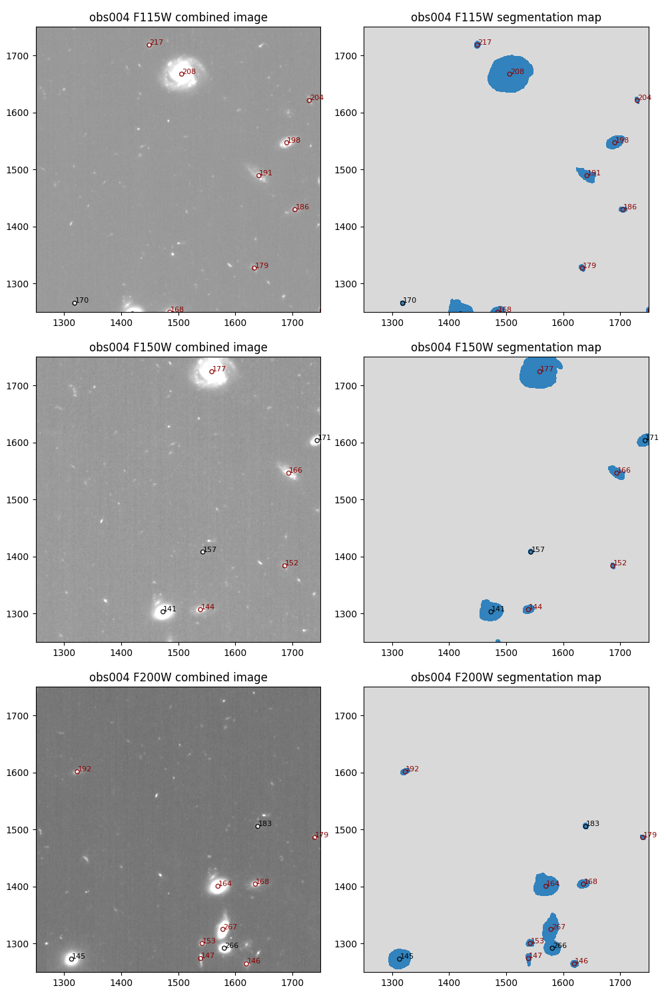

In [29]:
# These are all resuts from the Image3 pipeline
cust_image3_i2d = np.sort(glob.glob(os.path.join(custom_run_image3, '*i2d.fits'))) # combined image over multiple dithers/mosaic
cust_image3_segm = np.sort(glob.glob(os.path.join(custom_run_image3, '*segm.fits'))) # segmentation map that defines the extent of a source

custom_fig = plot_image_and_segmentation_map(cust_image3_i2d, cust_image3_segm)

<a id='source_cat'></a>
## Refining the Source Catalog Further

In the above cases, we have modified the results using the pipeline directly. It might be the case that perhaps you want to use someone else's custom source catalog, or modify the source catalog even further from what was output by the pipeline. In these cases, we will then need to modify the spec2 ASN files to point to the new source catalog, which will be discussed in the spec2 notebook. Additionally, it can be useful to match all of the source IDs across the different catalogs. In this case, there are three different catalogs created by the pipeline that identify the same RA/Dec or X/Y pixel location as a different source ID, so we will edit those to have the same source ID values across the catalogs. These extra steps aren't always necessary, but could be helpful in analyses of NIRISS WFSS data.

<a id='match_sources'></a>
#### Matching Source IDs Across Catalogs

In the above figures, you can see that the same source has multiple source IDs. Here we want to match all of the source IDs across all observations to be sure we are talking about the same source regardless of which filter or observation we look at. To do this, we use the astropy `match_to_catalog_3d` function and rebase the labels.

The first step is to decide on a base catalog to match all of the other catalogs to. Here we'll use the the observation 004 F115W filter.

In [30]:
custom_cats = np.sort(glob.glob(os.path.join(custom_run_image3, '*niriss_clear-f????_cat.ecsv'))) # cat filename format from image3 results
print("All image3 catalogs:\n", custom_cats)

base_cat = Table.read(custom_cats[0])

# save out the base catalog with a new name to be consistent
base_cat_name = custom_cats[0].replace('cat.ecsv', 'source-match_cat.ecsv')
base_cat.write(base_cat_name, overwrite=True)
print("\nBase catalog:", base_cat_name)

All image3 catalogs:
 ['custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_cat.ecsv'
 'custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_cat.ecsv'
 'custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_cat.ecsv']

Base catalog: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_source-match_cat.ecsv


Loop through the remaining catalogs to match the IDs based off of sky coordinates matching to within 1 arcsecond.

In [31]:
max_sep = 1 * u.arcsec # adjust if necessary

base_sky = base_cat['sky_centroid']

for to_match_cat in custom_cats[1:]:
    # read in the catalog
    other_cat = Table.read(to_match_cat)
    other_sky = other_cat['sky_centroid']

    # find the matching sources between the two catalogs based on sky coordinates
    idx, d2d, d3d = base_sky.match_to_catalog_3d(other_sky)
    sep_constraint = d2d < max_sep
    base_matches = base_cat[sep_constraint]
    other_matches = other_cat[idx[sep_constraint]]

    # rebase the ID values to be the same
    other_matches['label'] = base_matches['label']

    # save out the new catalog
    match_cat_name = to_match_cat.replace('cat.ecsv', 'source-match_cat.ecsv')
    other_matches.write(match_cat_name, overwrite=True)
    print('Saved:', match_cat_name)

Saved: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_source-match_cat.ecsv
Saved: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


Look at the new source label numbers. They should match!

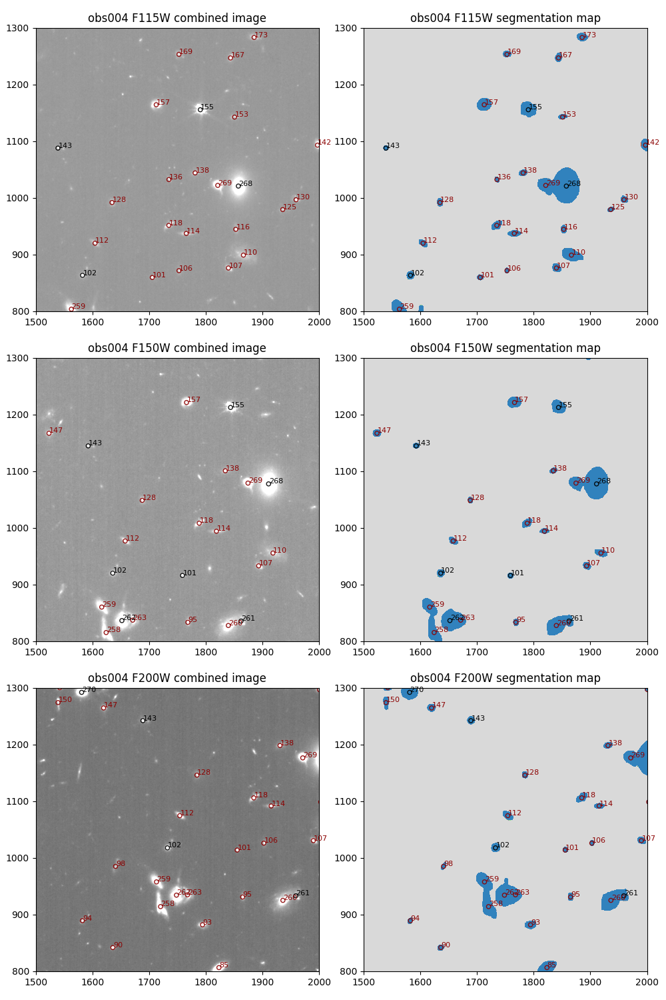

In [32]:
new_cat_fig = plot_image_and_segmentation_map(cust_image3_i2d, cust_image3_segm, cat_suffix='source-match_cat.ecsv',
                                              xmin=1500, xmax=2000, ymin=800, ymax=1300)

<a id='manual_cat'></a>
#### Manually Editing the Source Catalog

Looking ahead to the WFSS extraction, it might be that we only really care about one or two sources at any particular moment. In this case, it's helpful to pair down the source catalog to just that source to make it easier to look at the extracted 1-D spectrum in the WFSS data.

- [Source Catalog Column Information](https://jwst-pipeline.readthedocs.io/en/latest/jwst/source_catalog/main.html#output-products)

To start, look at the current custom source catalog for one of the filters to get an idea of what is contained in the catalogs.

In [33]:
# first, look at the current, custom source catalog for the F200W filter
cat_name = np.sort(glob.glob(os.path.join(custom_run_image3, '*source-match_cat.ecsv')))[2]
cat = Table.read(cat_name)

print(cat_name)
cat

custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


label,xcentroid,ycentroid,sky_centroid,aper_bkg_flux,aper_bkg_flux_err,aper50_flux,aper50_flux_err,aper70_flux,aper70_flux_err,aper80_flux,aper80_flux_err,aper_total_flux,aper_total_flux_err,aper50_abmag,aper50_abmag_err,aper70_abmag,aper70_abmag_err,aper80_abmag,aper80_abmag_err,aper_total_abmag,aper_total_abmag_err,aper50_vegamag,aper50_vegamag_err,aper70_vegamag,aper70_vegamag_err,aper80_vegamag,aper80_vegamag_err,aper_total_vegamag,aper_total_vegamag_err,CI_70_50,CI_80_70,CI_80_50,is_extended,sharpness,roundness,nn_label,nn_dist,isophotal_flux,isophotal_flux_err,isophotal_abmag,isophotal_abmag_err,isophotal_vegamag,isophotal_vegamag_err,isophotal_area,semimajor_sigma,semiminor_sigma,ellipticity,orientation,sky_orientation,sky_bbox_ll,sky_bbox_ul,sky_bbox_lr,sky_bbox_ur
,,,"deg,deg",Jy,Jy,Jy,Jy,Jy,Jy,Jy,Jy,Jy,Jy,,,,,,,,,,,,,,,,,,,,,,,,pix,Jy,Jy,,,,,pix2,pix,pix,,deg,deg,"deg,deg","deg,deg","deg,deg","deg,deg"
int64,float64,float64,SkyCoord,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bool,float64,float32,int64,float64,float64,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,SkyCoord,SkyCoord,SkyCoord,SkyCoord
1,1976.3053,169.6582,"53.1356838047834,-27.775607282627778",8.467091e-09,8.419665e-10,6.084808e-08,2.075741e-09,1.155467e-07,3.013423e-09,1.801670e-07,4.253471e-09,2.403231e-07,5.673666e-09,26.939383,0.036421,26.243106,0.027953,25.760812,0.025335,25.448011,0.025335,25.250541,0.036421,24.554264,0.027953,24.071970,0.025335,23.759169,0.025335,1.8989,1.5593,2.9609,True,0.492680,-0.704542,14,46.579531,1.008846e-06,7.622777e-09,23.890438,0.008173,22.201596,0.008173,101.0,3.645750,1.881904,0.483809,-2.251765,158.310256,"53.13565652288959,-27.77576652452247","53.135831226833275,-27.7757120095755","53.13554014098163,-27.775474550765676","53.13571484451438,-27.775420035964856"
2,1992.5784,213.3026,"53.13641960077549,-27.775063427582676",6.173700e-09,1.300237e-09,1.734249e-07,1.974052e-09,3.046190e-07,2.756568e-09,4.437935e-07,3.715117e-09,5.919721e-07,4.955562e-09,25.802221,0.012289,25.190607,0.009781,24.782048,0.009051,24.469247,0.009051,24.113379,0.012289,23.501765,0.009781,23.093206,0.009051,22.780405,0.009051,1.7565,1.4569,2.5590,True,0.486020,-0.713437,12,46.579531,9.417857e-07,5.468044e-09,23.965120,0.006286,22.276278,0.006286,75.0,2.550052,1.867799,0.267545,-59.015154,101.546867,"53.13634173046523,-27.775185796702072","53.13657466731792,-27.775113108907874","53.13626642366461,-27.77499687288901","53.13649936016273,-27.774924185220893"
4,1651.8488,243.3759,"53.13933618282145,-27.78073322592687",1.530286e-08,1.872074e-09,4.004159e-08,1.685012e-09,8.779823e-08,2.489833e-09,1.534610e-07,3.605650e-09,2.047003e-07,4.809544e-09,27.393722,0.044754,26.541286,0.030361,25.935005,0.025215,25.622204,0.025215,25.704880,0.044754,24.852444,0.030361,24.246163,0.025215,23.933362,0.025215,2.1927,1.7479,3.8325,True,0.371462,0.649428,35,174.039723,2.951009e-06,1.070477e-08,22.725074,0.003931,21.036232,0.003931,319.0,5.035661,4.458171,0.114680,76.537059,237.099080,"53.13921532552249,-27.78097078939227","53.139700632110625,-27.78081934601957","53.13905784732713,-27.7805757700637","53.139543152370884,-27.780424327240357"
5,275.6682,243.6932,"53.14876697160748,-27.804366533176278",7.328662e-09,5.616484e-10,1.497516e-07,1.861761e-09,2.822167e-07,2.657700e-09,4.306937e-07,3.634732e-09,5.744985e-07,4.848336e-09,25.961571,0.013415,25.273543,0.010177,24.814579,0.009124,24.501778,0.009124,24.272729,0.013415,23.584701,0.010177,23.125737,0.009124,22.812936,0.009124,1.8846,1.5261,2.8761,True,0.411228,-0.117693,18,51.216047,9.197826e-07,5.404308e-09,23.990787,0.006361,22.301945,0.006361,81.0,2.249560,2.191784,0.025683,-35.663088,124.898933,"53.1487015426845,-27.804486758971176","53.148915118137154,-27.80442010953589","53.1486261941032

There may be multiple ways to look for a source, so shown below are three options:
1. With a known RA/Dec of an object
2. A known x/y location of an object
3. With a source ID of an object. Note that we are using the rebased source catalogs here for the IDs.

This same concept can be extended to filter by any of the columns contained in the source catalog.

In [34]:
# with a known RA/Dec
desired_ra = 53.15437048946369
desired_dec = -27.771689847051736

c = SkyCoord(ra=desired_ra*u.degree, dec=desired_dec*u.degree)
nearest_id, distance_2d, distance_3d = c.match_to_catalog_sky(cat['sky_centroid']) 

cat[['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'is_extended', 'isophotal_abmag', 'isophotal_vegamag']][nearest_id]

label,xcentroid,ycentroid,sky_centroid,is_extended,isophotal_abmag,isophotal_vegamag
,,,"deg,deg",,,
int64,float64,float64,SkyCoord,bool,float64,float64
118,1884.8703,1105.8951,"53.15448285193964,-27.771505418460002",True,22.876637,21.187795


In [35]:
# alternatively with a known X/Y pixel location in the F200W image (based on what you've defined cat to be)
known_x = 1880
known_y = 1100

nearest_pos = [np.sqrt((x-known_x)**2 + (y-known_y)**2) for x, y in zip(cat['xcentroid'], cat['ycentroid'])]

wh_nearest = np.where(np.array(nearest_pos) == min(nearest_pos))[0][0]

cat[['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'is_extended', 'isophotal_abmag', 'isophotal_vegamag']][wh_nearest]

label,xcentroid,ycentroid,sky_centroid,is_extended,isophotal_abmag,isophotal_vegamag
,,,"deg,deg",,,
int64,float64,float64,SkyCoord,bool,float64,float64
118,1884.8703,1105.8951,"53.15448285193964,-27.771505418460002",True,22.876637,21.187795


In [36]:
# alternatively with a known source number
# note that this number might be different for you depending on pipeline versions and parameters changed.
source = 118

wh_source = np.where(np.array(cat['label'] == source))[0][0]

cat[['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'is_extended', 'isophotal_abmag', 'isophotal_vegamag']][wh_source]

label,xcentroid,ycentroid,sky_centroid,is_extended,isophotal_abmag,isophotal_vegamag
,,,"deg,deg",,,
int64,float64,float64,SkyCoord,bool,float64,float64
118,1884.8703,1105.8951,"53.15448285193964,-27.771505418460002",True,22.876637,21.187795


Using any of the three methods above, write out the new catalog.
- with RA/Dec: `new_cat = Table(cat[nearest_id])`
- with x/y: `new_cat = Table(cat[wh_nearest])`
- with source ID: `new_cat = Table(cat[wh_source])`

In [37]:
new_cat = Table(cat[wh_source]) # turn the row instance into a dataframe again

# save the new catalog with a unique name
new_cat_name = cat_name.replace('cat.ecsv', f'source{source}_cat.ecsv')
new_cat.write(new_cat_name, overwrite=True)
print('Saved:', new_cat_name)

Saved: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_source-match_source118_cat.ecsv


Once we have an updated source catalog that we are content with, we can move on to the spec2 step of the pipeline. It likely will be necessary to come back to this step after running spec2. Let's take a quick look at the source that we will be extracting in the following notebook with spec2.

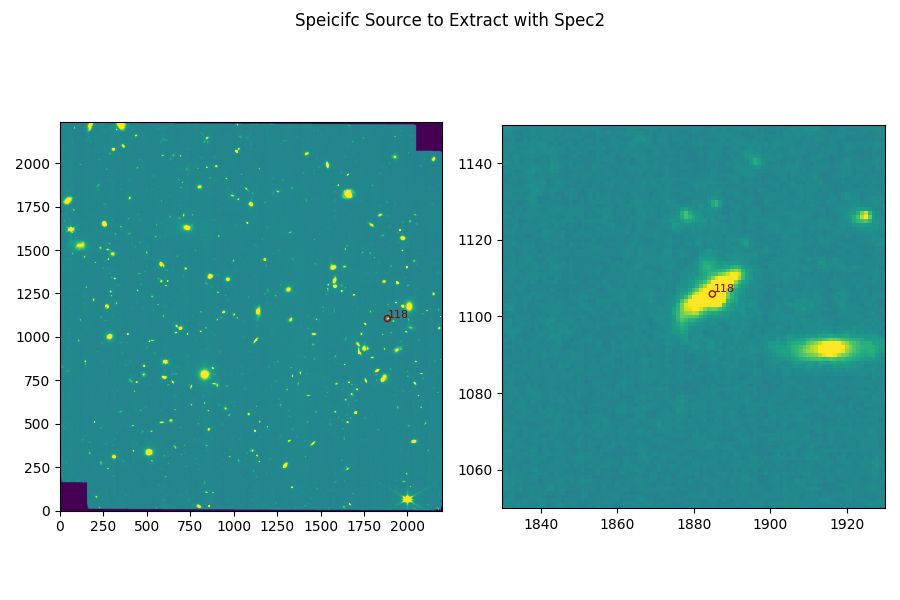

In [38]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))

img = cust_image3_i2d[-1]
    
cat = Table.read(new_cat_name)

for ax in [ax1, ax2]:
    # plot the image
    with fits.open(img) as hdu:
        ax.imshow(hdu[1].data, vmin=0, vmax=0.3, origin='lower')
        title = f"obs{hdu[0].header['OBSERVTN']} {hdu[0].header['PUPIL']}"
        
    # also plot the associated catalog
    extended_sources = cat[cat['is_extended'] == 1] # 1 is True; i.e. is extended
    point_sources = cat[cat['is_extended'] == 0] # 0 is False; i.e. is a point source
            
    for color, sources in zip(['darkred', 'black'], [extended_sources, point_sources]):
        # plotting the sources
        ax.scatter(sources['xcentroid'], sources['ycentroid'], s=20, facecolors='None', edgecolors=color, alpha=0.9)
    
        # adding source labels 
        for i, source_num in enumerate(sources['label']):
            ax.annotate(source_num, 
                        (sources['xcentroid'][i]+0.5, sources['ycentroid'][i]+0.5), 
                        fontsize=8,
                        color=color)

fig.suptitle("Speicifc Source to Extract with Spec2")

# zooming in on a smaller region
ax2.set_xlim(known_x-50, known_x+50)
ax2.set_ylim(known_y-50, known_y+50)

fig.tight_layout()

<img style="float: right;" src="https://raw.githubusercontent.com/spacetelescope/notebooks/master/assets/stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="Space Telescope Logo" width="200px"/>